# MÉTODO DE ENTRADA DE VENTANA SÓLO VALOR 6-1

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [2]:
import tensorflow as tf
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
from array import *
from pickle import dump
import math

import numpy as np
import pandas as pd
import seaborn as sns

from sklearn.model_selection import train_test_split
np.random.seed(123)

from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [3]:
FILEPATH = "../../datasources/THC-id-17.csv"
df_original = pd.read_csv(FILEPATH, parse_dates=True)

FILEPATH = "../../datasources/THC-id-17-preprocessed.csv"
df = pd.read_csv(FILEPATH, parse_dates=True)

In [4]:
df_original

,datetime,id,value
0,2019-01-01 03:00:00,17.0,0.087
1,2019-01-01 03:15:00,17.0,0.100
2,2019-01-01 03:30:00,17.0,0.084
3,2019-01-01 03:45:00,17.0,0.057
4,2019-01-01 04:00:00,17.0,0.167
...,...,...,...
64588,2020-11-03 22:00:00,17.0,0.031
64589,2020-11-03 22:15:00,17.0,0.055
64590,2020-11-03 22:30:00,17.0,0.019
64591,2020-11-03 22:45:00,17.0,0.021


In [5]:
df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


In [6]:
df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


### División de los datos

In [7]:
train_df, aux = train_test_split(df, test_size=0.3, shuffle=False)
test_df, val_df = train_test_split(aux, test_size=0.5, shuffle=False)

In [8]:
train_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
45210,0.382683,0.923880,0.056070,0.998427,0.968510,-0.248976,0.041
45211,0.442289,0.896873,0.065403,0.997859,0.968465,-0.249150,0.024
45212,0.500000,0.866025,0.074730,0.997204,0.968420,-0.249323,0.017
45213,0.555570,0.831470,0.084051,0.996461,0.968376,-0.249497,0.046


In [9]:
test_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
45215,6.593458e-01,0.751840,0.102669,0.994716,0.968286,-0.249844,0.016
45216,7.071068e-01,0.707107,0.111964,0.993712,0.968241,-0.250017,0.046
45217,7.518398e-01,0.659346,0.121251,0.992622,0.968197,-0.250191,0.009
45218,7.933533e-01,0.608761,0.130526,0.991445,0.968152,-0.250364,0.003
45219,8.314696e-01,0.555570,0.139790,0.990181,0.968107,-0.250538,0.034
...,...,...,...,...,...,...,...
54899,-6.540313e-02,0.997859,0.442289,-0.896873,-0.405068,-0.914287,0.018
54900,-5.539676e-12,1.000000,0.433884,-0.900969,-0.405231,-0.914214,0.018
54901,6.540313e-02,0.997859,0.425441,-0.904986,-0.405395,-0.914142,0.038
54902,1.305262e-01,0.991445,0.416961,-0.908924,-0.405559,-0.914069,0.039


In [10]:
val_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
54904,0.258819,0.965926,0.399892,-0.916562,-0.405887,-0.913923,0.018
54905,0.321439,0.946930,0.391305,-0.920261,-0.406050,-0.913851,0.017
54906,0.382683,0.923880,0.382683,-0.923880,-0.406214,-0.913778,0.018
54907,0.442289,0.896873,0.374029,-0.927417,-0.406378,-0.913705,0.048
54908,0.500000,0.866025,0.365341,-0.930874,-0.406541,-0.913632,0.024
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


## Funciones auxiliares

In [11]:
def split_data(data, n_input, n_out):
    X, y = list(), list()
    in_start = 0
    
    for _ in range(len(data)):
        in_end = in_start + n_input
        out_end = in_end + n_out
        if out_end <= len(data):
            X.append(np.array(data.iloc[in_start:in_end, -1]))
            y.append(np.array(data.iloc[in_end:out_end, -1]))
        in_start += 1
        
    return np.array(X).reshape(len(X), n_input, 1), np.array(y)

In [12]:
def plot_history(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Abs Error [MPG]')
    plt.plot(hist['epoch'], hist['mae'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mae'], label = 'Val Error')
    plt.ylim(bottom=0)
    plt.legend()
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Square Error [$MPG^2$]')
    plt.plot(hist['epoch'], hist['mse'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mse'], label = 'Val Error')
    plt.ylim(bottom=0)
    plt.legend()
    plt.show()

In [13]:
def plot_window_predictions(index_min, index_max, real_outputs, pred_outputs, num_plots, start):
    for n in range(start, start + num_plots):
        limit = index_min + n + n_entrada
        input_indices = np.array(df_original['datetime'].iloc[index_min + n : limit])
        input_values = np.array(df_original['value'].iloc[index_min + n : limit])
        output_indices = np.array(df_original['datetime'].iloc[limit : limit + n_predicciones])
        real_values = real_outputs[n]
        pred_values = pred_outputs[n]
        
        plt.figure()
        plt.xlabel('Time')
        plt.ylabel(f'Valores de prediccion - Iteracion {n+1}')
        plt.scatter(input_indices, input_values, color='b',zorder=2)
        plt.plot(input_indices, input_values, label='Inputs', color='b', zorder=1)
        plt.scatter(output_indices, real_values, edgecolors='k', label='Real output', c='#2ca02c', s=64)
        plt.scatter(output_indices, pred_values, marker='X', edgecolors='k', label='Prediction output', c='#ff7f0e', s=64)
        plt.xticks(rotation = 90)
        plt.legend()

In [14]:
def plot_window_predictions_values(index_min, pred_outputs, max_plots):
    plt.figure()
    plt.xlabel('Time')
    plt.ylabel(f'Valores de prediccion')
    plt.plot(np.array(df_original['datetime'].iloc[index_min + n_entrada : index_min + n_entrada + max_plots + n_predicciones]), 
             np.array(df_original['value'].iloc[index_min + n_entrada : index_min + n_entrada + max_plots + n_predicciones]), 
             color='b', zorder=1)
    
    for n in range(max_plots):
        limit = index_min + n + n_entrada
        output_indices = np.array(df_original['datetime'].iloc[limit : limit + n_predicciones])
        pred_values = pred_outputs[n]
        
        plt.scatter(output_indices, pred_values, marker='X', edgecolors='k', label='Prediction output', c='#ff7f0e', s=64)
        plt.xticks(rotation = 90)

In [15]:
import tensorflow.keras.backend as K

def smape(y_true, y_pred):
    return K.mean(2*K.abs(y_pred-y_true)/(K.abs(y_true)+K.abs(y_pred)))

## Parámetros

In [16]:
###### PARAMETERS ######
n_epochs = 200
batch_size = 128
n_entrada = 6           # Número de mediciones de entrada
n_predicciones = 1       # Mediciones de salida
n_features = 1 
########################

## Extraer datos de entrada y salida

In [17]:
data_trainX, data_trainY = split_data(train_df, n_entrada, n_predicciones)
data_valX, data_valY = split_data(val_df, n_entrada, n_predicciones)
data_testX, data_testY = split_data(test_df, n_entrada, n_predicciones)

In [18]:
data_trainX.shape

(45209, 6, 1)

In [19]:
data_trainY.shape

(45209, 1)

In [20]:
data_valX.shape

(9683, 6, 1)

In [21]:
data_valY.shape

(9683, 1)

In [22]:
data_testX.shape

(9683, 6, 1)

In [23]:
data_testY.shape

(9683, 1)

In [24]:
data_trainX[0]

array([[0.087],
       [0.1  ],
       [0.084],
       [0.057],
       [0.167],
       [0.053]])

In [25]:
data_trainY[0]

array([0.057])

## Estandarización y normalización de los datos

In [26]:
# Normalizado
maxabs_scaler = MaxAbsScaler()
    
maxabs_scaler.fit(data_trainX.reshape(-1, data_trainX.shape[-1]))
    
scaled_trainX = maxabs_scaler.transform(data_trainX.reshape(-1, data_trainX.shape[-1])).reshape(data_trainX.shape)
scaled_valX = maxabs_scaler.transform(data_valX.reshape(-1, data_valX.shape[-1])).reshape(data_valX.shape)
scaled_testX = maxabs_scaler.transform(data_testX.reshape(-1, data_testX.shape[-1])).reshape(data_testX.shape)

In [27]:
scaled_trainX.shape

(45209, 6, 1)

In [28]:
scaled_valX.shape

(9683, 6, 1)

In [29]:
scaled_testX.shape

(9683, 6, 1)

In [30]:
scaled_trainX[0]

array([[0.12869822],
       [0.14792899],
       [0.12426036],
       [0.08431953],
       [0.24704142],
       [0.07840237]])

### Algunos modelos necesitan otros tipos de entrada

In [31]:
scaled_trainX_4D = scaled_trainX.reshape(scaled_trainX.shape[0], 1, n_entrada, n_features)
scaled_valX_4D = scaled_valX.reshape(scaled_valX.shape[0], 1, n_entrada, n_features)
scaled_testX_4D = scaled_testX.reshape(scaled_testX.shape[0], 1, n_entrada, n_features)

scaled_trainX_5D = scaled_trainX.reshape(scaled_trainX.shape[0], 1, 1, n_entrada, n_features)
scaled_valX_5D = scaled_valX.reshape(scaled_valX.shape[0], 1, 1, n_entrada, n_features)
scaled_testX_5D = scaled_testX.reshape(scaled_testX.shape[0], 1, 1, n_entrada, n_features)

data_trainY_3D = data_trainY.reshape(data_trainY.shape[0], 1, n_predicciones)
data_valY_3D = data_valY.reshape(data_valY.shape[0], 1, n_predicciones)
data_testY_3D = data_testY.reshape(data_testY.shape[0], 1, n_predicciones)

data_trainY_3D_2 = data_trainY.reshape(data_trainY.shape[0], n_predicciones, 1)
data_valY_3D_2 = data_valY.reshape(data_valY.shape[0], n_predicciones, 1)
data_testY_3D_2 = data_testY.reshape(data_testY.shape[0], n_predicciones, 1)

### Early stopping

In [32]:
early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=100)

# MODELO 1: LSTM DE UNA CAPA

### Construimos el modelo

In [33]:
def build_model1():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [34]:
model1 = build_model1()
model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 128)               66560     
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 66,689
Trainable params: 66,689
Non-trainable params: 0
_________________________________________________________________


2022-06-24 02:37:45.372011: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-06-24 02:37:45.955588: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 29433 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:5b:00.0, compute capability: 7.0


### Entrenamiento del modelo

In [35]:
history1 = model1.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200


2022-06-24 02:37:47.755267: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8100


354/354 [==============================] - 6s 9ms/step - loss: 0.0050 - mae: 0.0412 - mse: 0.0050 - smape: 0.7563 - val_loss: 0.0042 - val_mae: 0.0348 - val_mse: 0.0042 - val_smape: 0.6863
Epoch 2/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0047 - mae: 0.0401 - mse: 0.0047 - smape: 0.7406 - val_loss: 0.0041 - val_mae: 0.0347 - val_mse: 0.0041 - val_smape: 0.6865
Epoch 3/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0047 - mae: 0.0400 - mse: 0.0047 - smape: 0.7397 - val_loss: 0.0041 - val_mae: 0.0310 - val_mse: 0.0041 - val_smape: 0.6123
Epoch 4/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0047 - mae: 0.0399 - mse: 0.0047 - smape: 0.7401 - val_loss: 0.0040 - val_mae: 0.0308 - val_mse: 0.0040 - val_smape: 0.6151
Epoch 5/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0046 - mae: 0.0397 - mse: 0.0046 - smape: 0.7378 - val_loss: 0.0040 - val_mae: 0.0309 - val_mse: 0.0040 - val_smape: 0.6197
Epoch 6

Epoch 42/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0045 - mae: 0.0384 - mse: 0.0045 - smape: 0.7182 - val_loss: 0.0039 - val_mae: 0.0325 - val_mse: 0.0039 - val_smape: 0.6605
Epoch 43/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0045 - mae: 0.0385 - mse: 0.0045 - smape: 0.7199 - val_loss: 0.0039 - val_mae: 0.0335 - val_mse: 0.0039 - val_smape: 0.6765
Epoch 44/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0045 - mae: 0.0384 - mse: 0.0045 - smape: 0.7183 - val_loss: 0.0038 - val_mae: 0.0327 - val_mse: 0.0038 - val_smape: 0.6667
Epoch 45/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0045 - mae: 0.0384 - mse: 0.0045 - smape: 0.7187 - val_loss: 0.0039 - val_mae: 0.0345 - val_mse: 0.0039 - val_smape: 0.7011
Epoch 46/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0045 - mae: 0.0384 - mse: 0.0045 - smape: 0.7169 - val_loss: 0.0039 - val_mae: 0.0326 - val_mse: 0.0039 - val_smap

354/354 [==============================] - 3s 7ms/step - loss: 0.0044 - mae: 0.0378 - mse: 0.0044 - smape: 0.7047 - val_loss: 0.0038 - val_mae: 0.0318 - val_mse: 0.0038 - val_smape: 0.6464
Epoch 123/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0044 - mae: 0.0379 - mse: 0.0044 - smape: 0.7059 - val_loss: 0.0038 - val_mae: 0.0312 - val_mse: 0.0038 - val_smape: 0.6247
Epoch 124/200
354/354 [==============================] - 3s 7ms/step - loss: 0.0044 - mae: 0.0378 - mse: 0.0044 - smape: 0.7039 - val_loss: 0.0039 - val_mae: 0.0329 - val_mse: 0.0039 - val_smape: 0.6685
Epoch 125/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0044 - mae: 0.0378 - mse: 0.0044 - smape: 0.7036 - val_loss: 0.0038 - val_mae: 0.0328 - val_mse: 0.0038 - val_smape: 0.6709
Epoch 126/200
354/354 [==============================] - 3s 7ms/step - loss: 0.0044 - mae: 0.0378 - mse: 0.0044 - smape: 0.7038 - val_loss: 0.0038 - val_mae: 0.0330 - val_mse: 0.0038 - val_smape: 0.6693

In [36]:
hist1 = pd.DataFrame(history1.history)
hist1['epoch'] = history1.epoch
hist1

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.005001,0.041188,0.005001,0.756325,0.004172,0.034804,0.004172,0.686270,0
1,0.004739,0.040054,0.004739,0.740561,0.004103,0.034677,0.004103,0.686475,1
2,0.004713,0.039973,0.004713,0.739662,0.004098,0.030967,0.004098,0.612256,2
3,0.004682,0.039868,0.004682,0.740080,0.003957,0.030824,0.003957,0.615056,3
4,0.004646,0.039705,0.004646,0.737751,0.003956,0.030901,0.003956,0.619722,4
...,...,...,...,...,...,...,...,...,...
195,0.004332,0.037243,0.004332,0.698073,0.003974,0.035232,0.003974,0.709832,195
196,0.004320,0.037284,0.004320,0.699715,0.003859,0.030724,0.003859,0.618912,196
197,0.004326,0.037100,0.004326,0.696151,0.003901,0.033870,0.003901,0.682587,197
198,0.004320,0.037282,0.004320,0.699526,0.003829,0.032509,0.003829,0.651403,198


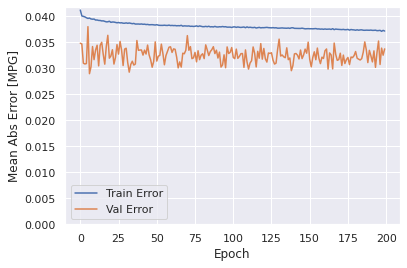

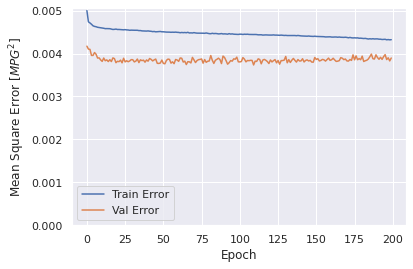

In [37]:
sns.set(rc = {'figure.figsize':(15,5), 'figure.dpi':80})
plot_history(history1)

### Evaluar predicciones

In [38]:
score_train1 = model1.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train1[0]}')
print(f'MAE:{score_train1[1]}')
print(f'MSE:{score_train1[2]}')
print(f'SMAPE:{score_train1[3]}')

1413/1413 [==============================] - 7s 5ms/step - loss: 0.0043 - mae: 0.0383 - mse: 0.0043 - smape: 0.7133
Loss:0.004300639033317566
MAE:0.038252901285886765
MSE:0.004300639033317566
SMAPE:0.713336706161499


In [39]:
score_val1 = model1.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val1[0]}')
print(f'MAE:{score_val1[1]}')
print(f'MSE:{score_val1[2]}')
print(f'SMAPE:{score_val1[3]}')

303/303 [==============================] - 2s 5ms/step - loss: 0.0039 - mae: 0.0337 - mse: 0.0039 - smape: 0.6755
Loss:0.003895836416631937
MAE:0.03372342884540558
MSE:0.003895836416631937
SMAPE:0.6754658222198486


In [40]:
score_test1 = model1.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test1[0]}') 
print(f'MAE:{score_test1[1]}')
print(f'MSE:{score_test1[2]}')
print(f'SMAPE:{score_test1[3]}')

303/303 [==============================] - 1s 5ms/step - loss: 0.0047 - mae: 0.0402 - mse: 0.0047 - smape: 0.7219
Loss:0.004689060151576996
MAE:0.04017804190516472
MSE:0.004689060151576996
SMAPE:0.7218658328056335


### Comparativa de resultados

In [41]:
result = hist1.iloc[-1]
comparativa1 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test1[1], score_test1[2], score_test1[3], math.sqrt(score_test1[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa1.style.set_caption("Método de ventana de un paso - LSTM de una capa")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.037151,0.004322,0.695787,0.065745
VALIDACION,0.033723,0.003896,0.676066,0.062417
TEST,0.040178,0.004689,0.721866,0.068477


### Obtener predicciones

In [42]:
trainPredict1 = model1.predict(scaled_trainX)
testPredict1 = model1.predict(scaled_testX)

### Visualización de las predicciones

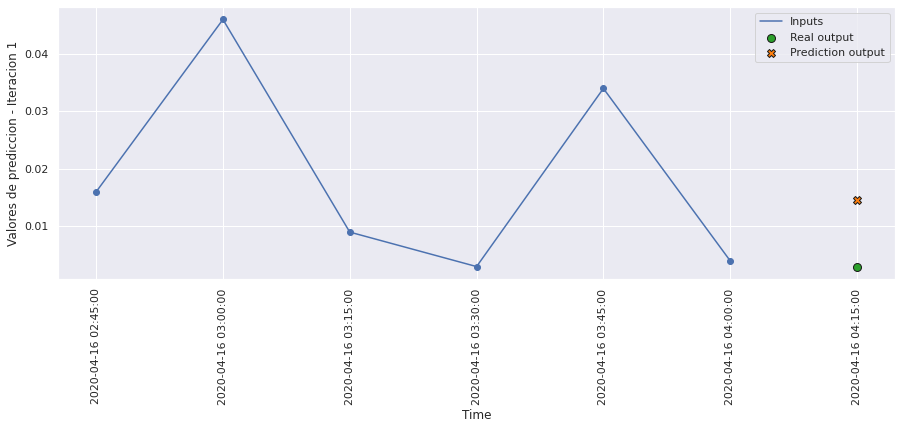

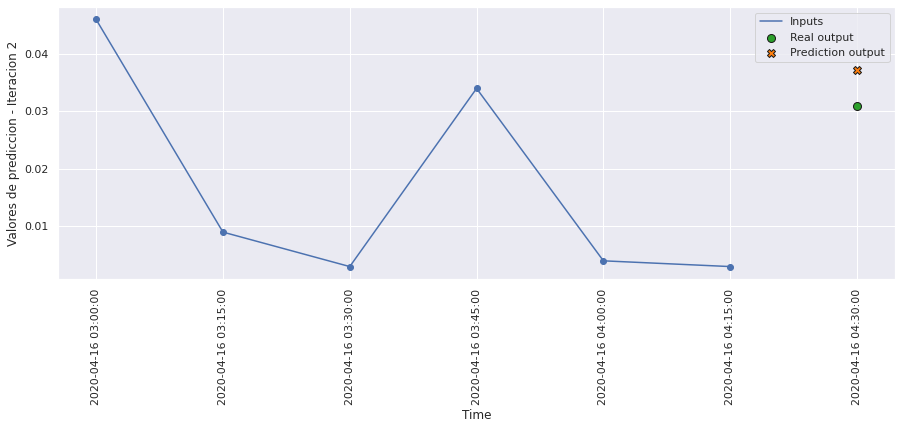

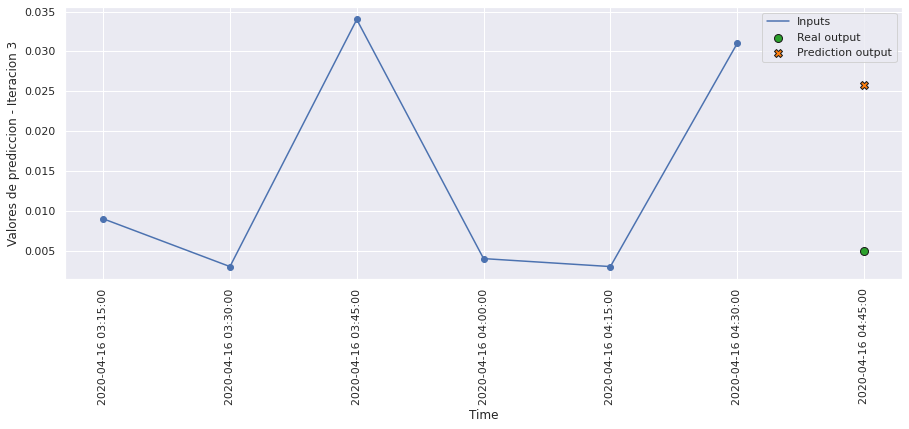

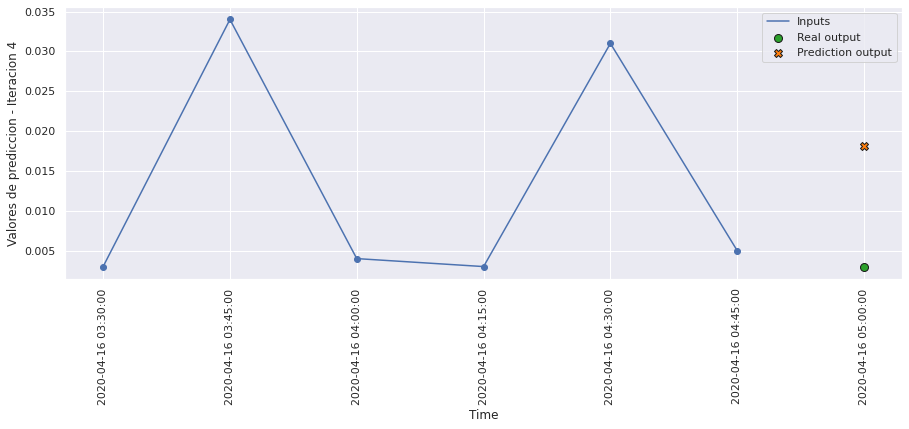

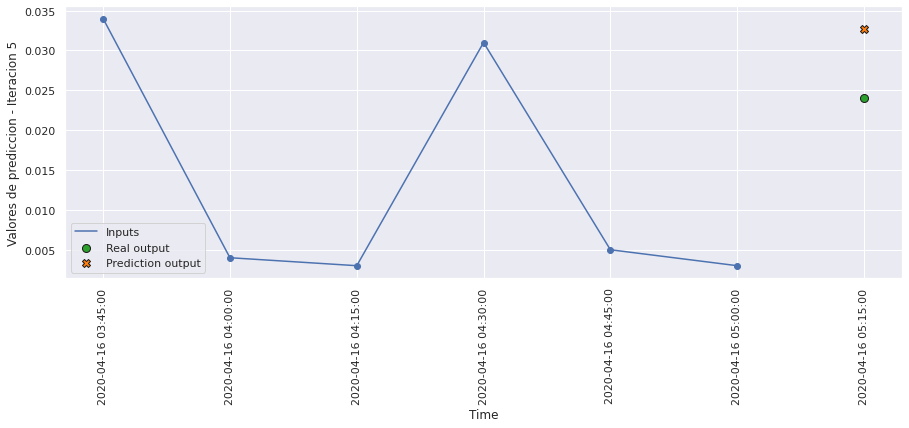

...

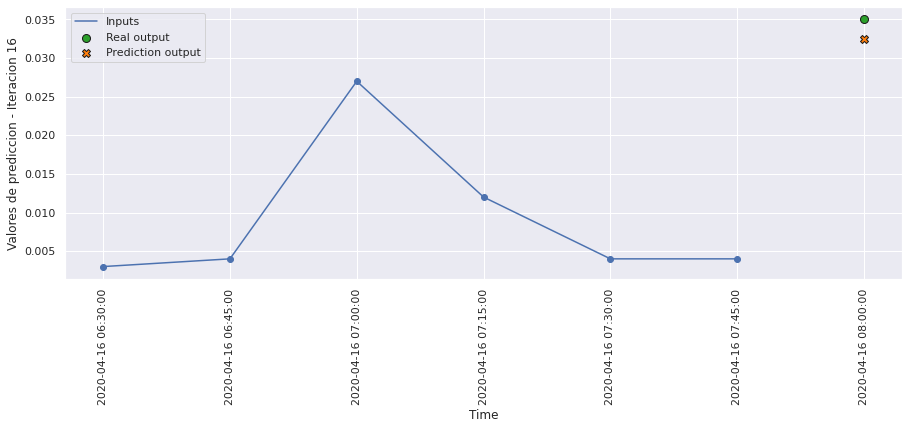

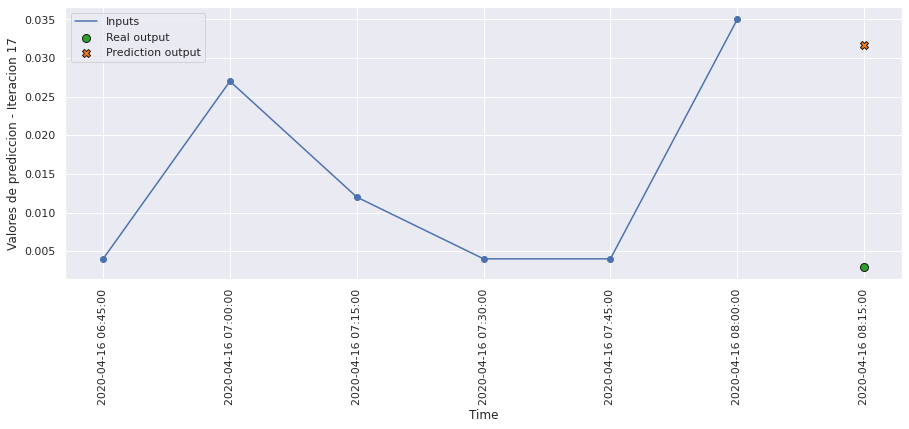

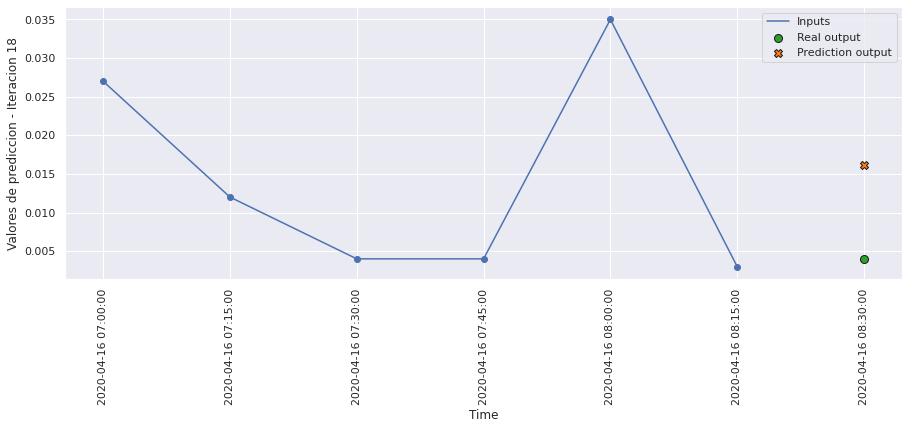

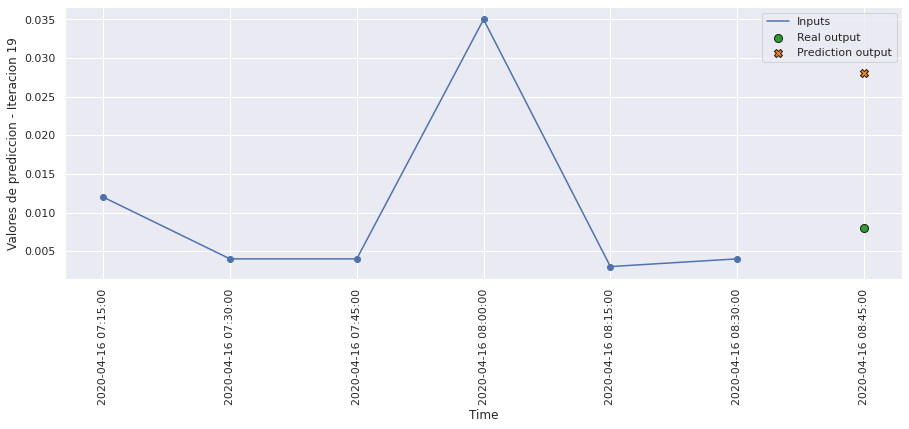

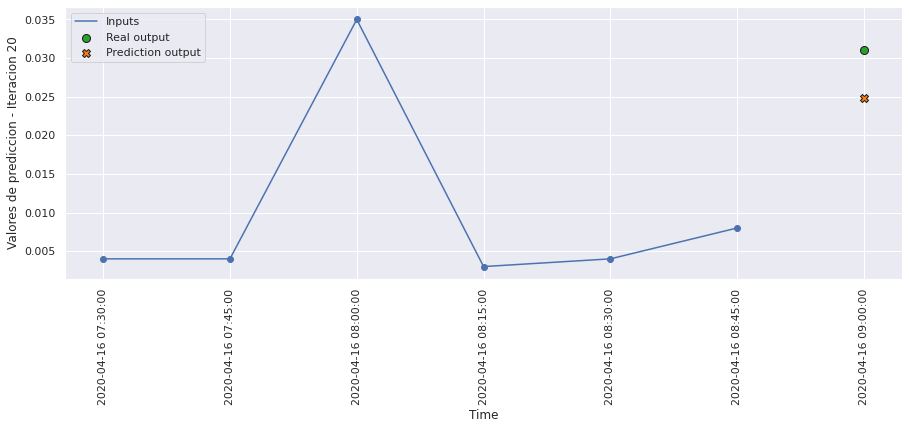

In [43]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict1, 20, 0)

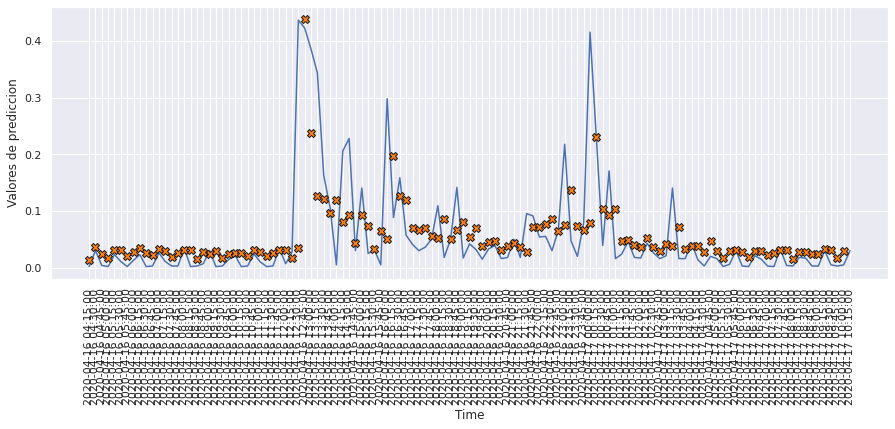

In [44]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict1, 120)

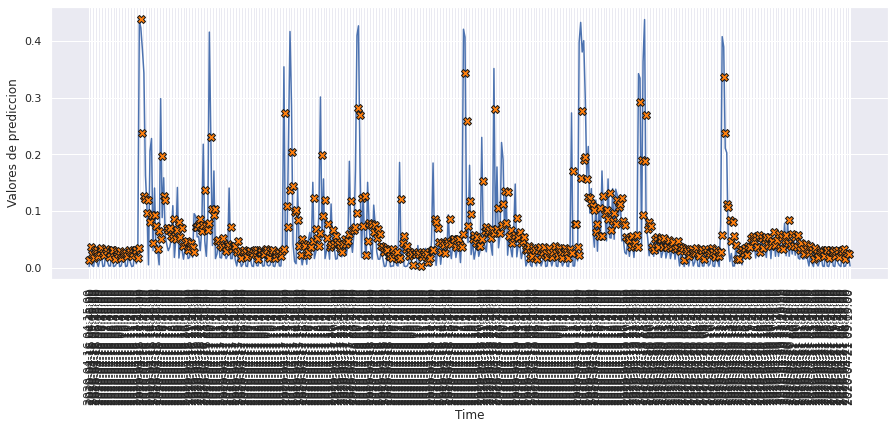

In [45]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict1, 500)

# MODELO 2: LSTM DE DOS CAPAS

### Construimos el modelo

In [46]:
def build_model2():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences = True),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [47]:
model2 = build_model2()
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 6, 128)            66560     
                                                                 
 lstm_2 (LSTM)               (None, 128)               131584    
                                                                 
 dense_1 (Dense)             (None, 1)                 129       
                                                                 
Total params: 198,273
Trainable params: 198,273
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [48]:
history2 = model2.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 14ms/step - loss: 0.0050 - mae: 0.0413 - mse: 0.0050 - smape: 0.7580 - val_loss: 0.0041 - val_mae: 0.0332 - val_mse: 0.0041 - val_smape: 0.6581
Epoch 2/200
354/354 [==============================] - 4s 13ms/step - loss: 0.0048 - mae: 0.0402 - mse: 0.0048 - smape: 0.7440 - val_loss: 0.0042 - val_mae: 0.0326 - val_mse: 0.0042 - val_smape: 0.6463
Epoch 3/200
354/354 [==============================] - 4s 13ms/step - loss: 0.0047 - mae: 0.0399 - mse: 0.0047 - smape: 0.7407 - val_loss: 0.0040 - val_mae: 0.0349 - val_mse: 0.0040 - val_smape: 0.6952
Epoch 4/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0047 - mae: 0.0398 - mse: 0.0047 - smape: 0.7395 - val_loss: 0.0041 - val_mae: 0.0343 - val_mse: 0.0041 - val_smape: 0.6718
Epoch 5/200
354/354 [==============================] - 4s 13ms/step - loss: 0.0046 - mae: 0.0397 - mse: 0.0046 - smape: 0.7398 - val_loss: 0.0040 - val_mae: 0.0328 - val_mse: 0.0040 - val_smap

354/354 [==============================] - 4s 12ms/step - loss: 0.0044 - mae: 0.0378 - mse: 0.0044 - smape: 0.7082 - val_loss: 0.0037 - val_mae: 0.0301 - val_mse: 0.0037 - val_smape: 0.6030
Epoch 82/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0044 - mae: 0.0378 - mse: 0.0044 - smape: 0.7075 - val_loss: 0.0038 - val_mae: 0.0330 - val_mse: 0.0038 - val_smape: 0.6742
Epoch 83/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0044 - mae: 0.0378 - mse: 0.0044 - smape: 0.7061 - val_loss: 0.0037 - val_mae: 0.0321 - val_mse: 0.0037 - val_smape: 0.6586
Epoch 84/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0044 - mae: 0.0377 - mse: 0.0044 - smape: 0.7059 - val_loss: 0.0038 - val_mae: 0.0321 - val_mse: 0.0038 - val_smape: 0.6558
Epoch 85/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0044 - mae: 0.0378 - mse: 0.0044 - smape: 0.7063 - val_loss: 0.0039 - val_mae: 0.0335 - val_mse: 0.0039 - val_smape: 0.684

In [49]:
hist2 = pd.DataFrame(history2.history)
hist2['epoch'] = history2.epoch
hist2

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.005012,0.041294,0.005012,0.757974,0.004086,0.033211,0.004086,0.658149,0
1,0.004757,0.040227,0.004757,0.743998,0.004163,0.032590,0.004163,0.646253,1
2,0.004705,0.039893,0.004705,0.740703,0.004024,0.034924,0.004024,0.695199,2
3,0.004672,0.039768,0.004672,0.739547,0.004077,0.034255,0.004077,0.671820,3
4,0.004647,0.039686,0.004647,0.739811,0.003994,0.032800,0.003994,0.653325,4
...,...,...,...,...,...,...,...,...,...
141,0.004215,0.036707,0.004215,0.696444,0.003896,0.034276,0.003896,0.691589,141
142,0.004204,0.036761,0.004204,0.696629,0.003945,0.034093,0.003945,0.691271,142
143,0.004204,0.036774,0.004204,0.697925,0.003883,0.031114,0.003883,0.636387,143
144,0.004203,0.036585,0.004203,0.694807,0.003935,0.033548,0.003935,0.678873,144


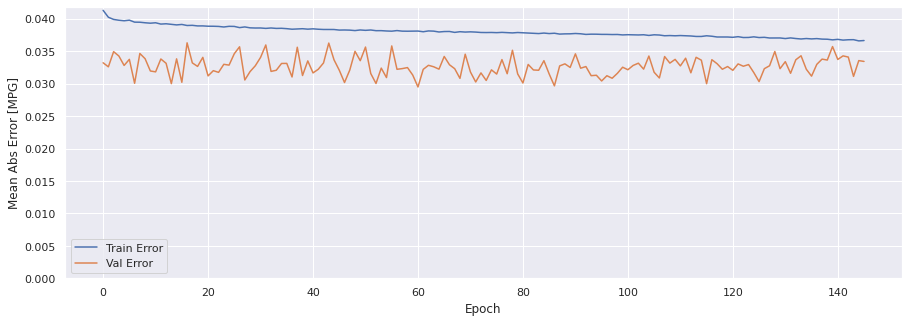

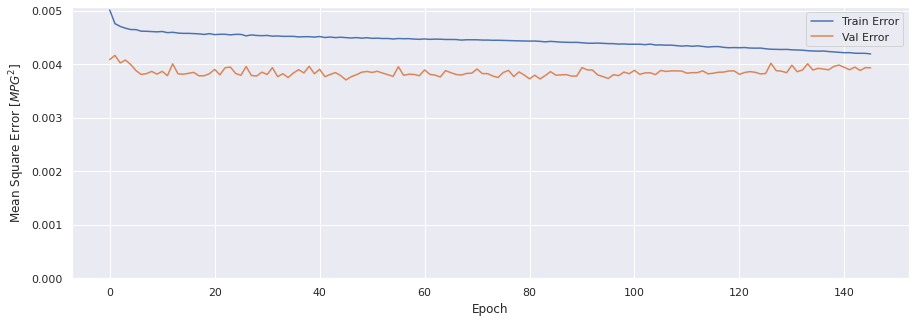

In [50]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history2)

### Evaluar predicciones

In [51]:
score_train2 = model2.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train2[0]}')
print(f'MAE:{score_train2[1]}')
print(f'MSE:{score_train2[2]}')
print(f'SMAPE:{score_train2[3]}')

1413/1413 [==============================] - 9s 6ms/step - loss: 0.0041 - mae: 0.0364 - mse: 0.0041 - smape: 0.6976
Loss:0.0041423640213906765
MAE:0.036406006664037704
MSE:0.0041423640213906765
SMAPE:0.6975535750389099


In [52]:
score_val2 = model2.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val2[0]}')
print(f'MAE:{score_val2[1]}')
print(f'MSE:{score_val2[2]}')
print(f'SMAPE:{score_val2[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0039 - mae: 0.0334 - mse: 0.0039 - smape: 0.6817
Loss:0.0039327130652964115
MAE:0.033420395106077194
MSE:0.0039327130652964115
SMAPE:0.6816785335540771


In [53]:
score_test2 = model2.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test2[0]}')
print(f'MAE:{score_test2[1]}')
print(f'MSE:{score_test2[2]}')
print(f'SMAPE:{score_test2[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0047 - mae: 0.0390 - mse: 0.0047 - smape: 0.7172
Loss:0.004666363354772329
MAE:0.039029560983181
MSE:0.004666363354772329
SMAPE:0.7171590328216553


### Comparativa de resultados

In [54]:
result = hist2.iloc[-1]
comparativa2 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test2[1], score_test2[2], score_test2[3], math.sqrt(score_test2[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa2.style.set_caption("Método de ventana de un paso - LSTM de dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.036641,0.004191,0.694660,0.064741
VALIDACION,0.033420,0.003933,0.682440,0.062711
TEST,0.039030,0.004666,0.717159,0.068311


### Obtener predicciones

In [55]:
trainPredict2 = model2.predict(scaled_trainX)
testPredict2 = model2.predict(scaled_testX)

### Visualización de las predicciones

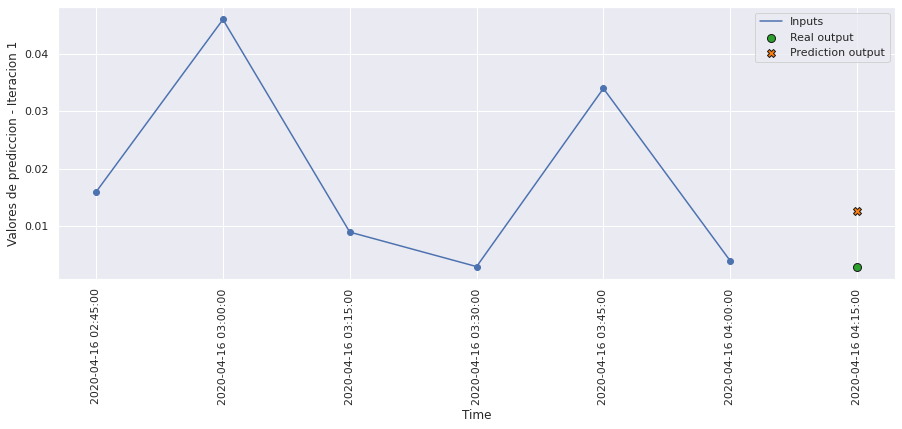

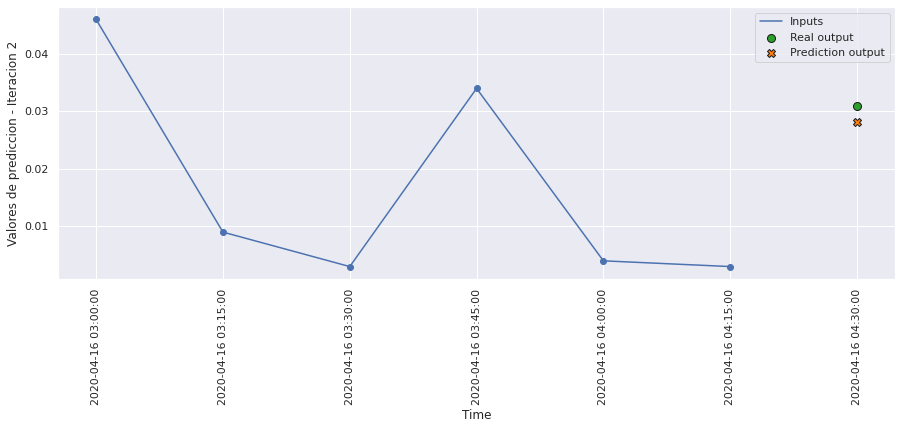

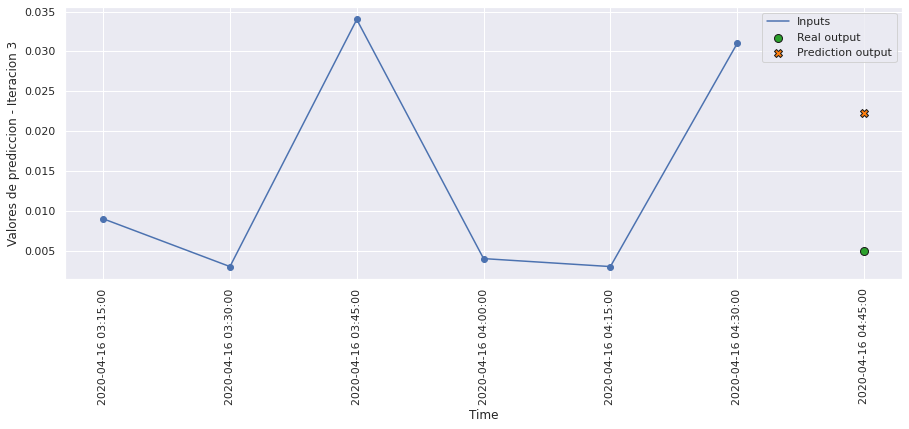

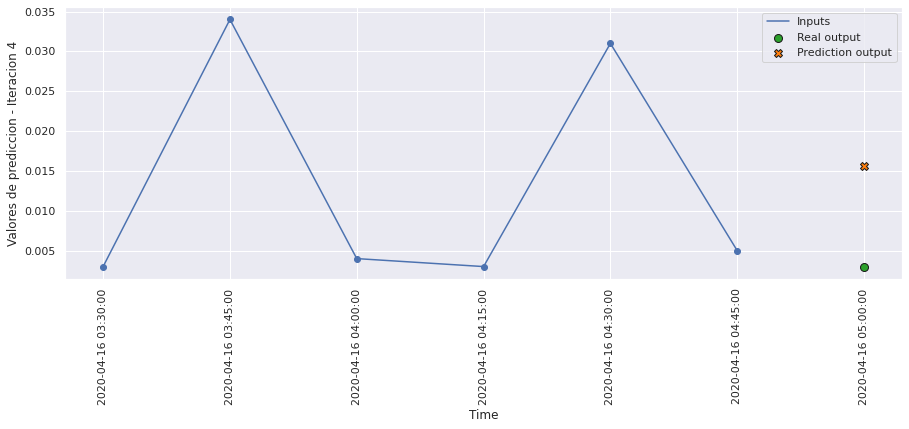

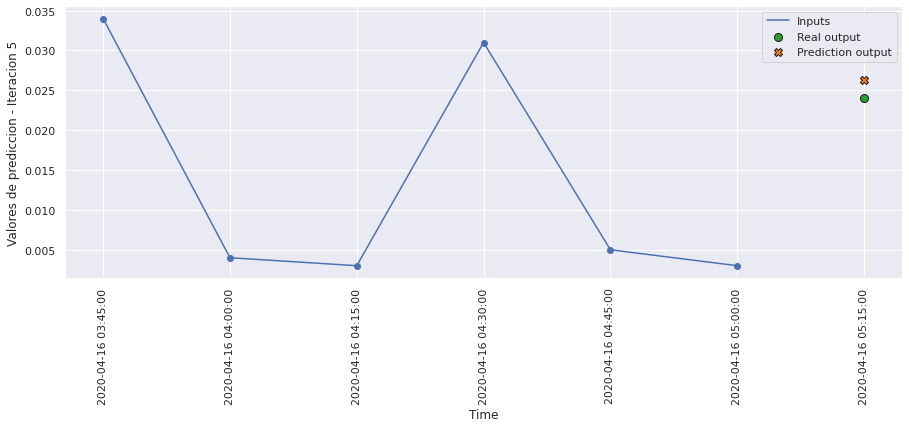

...

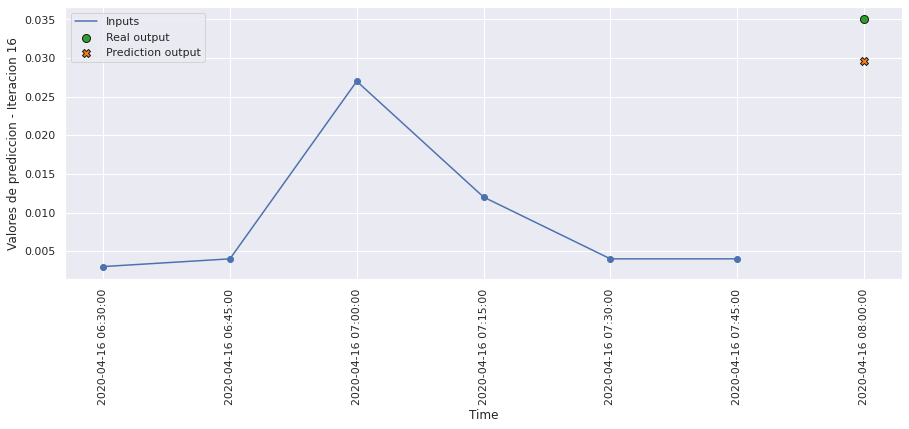

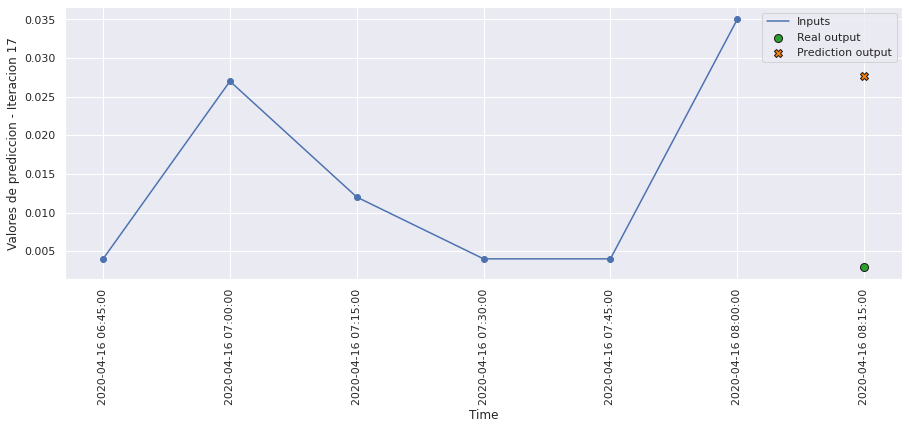

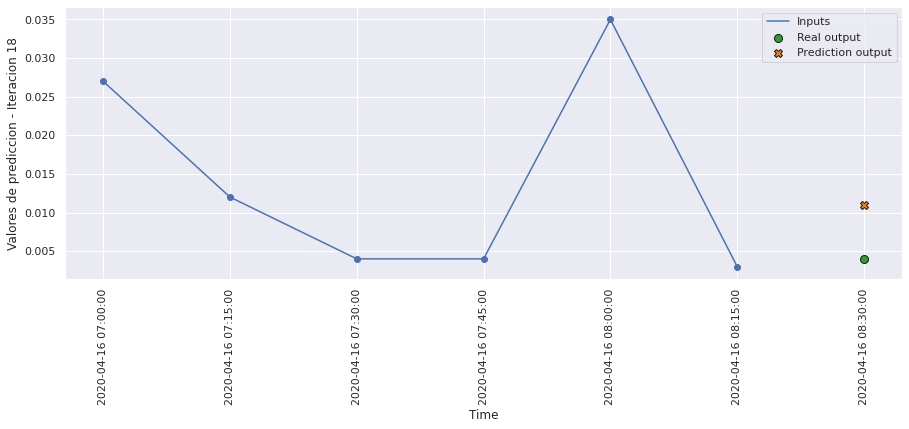

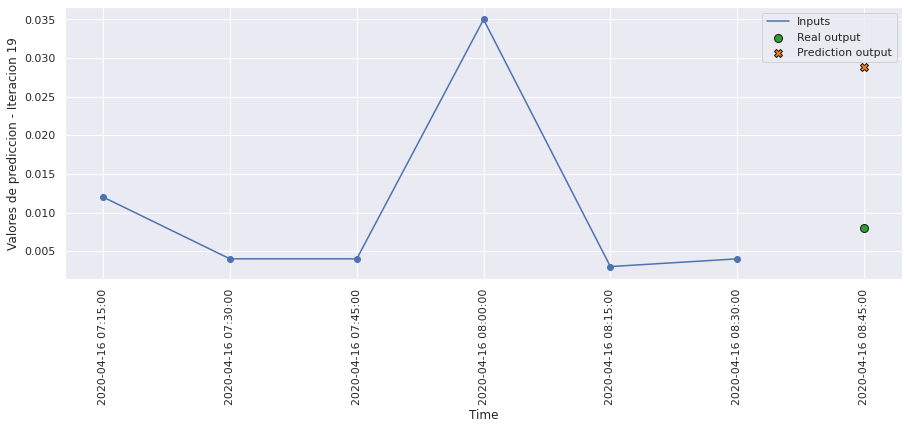

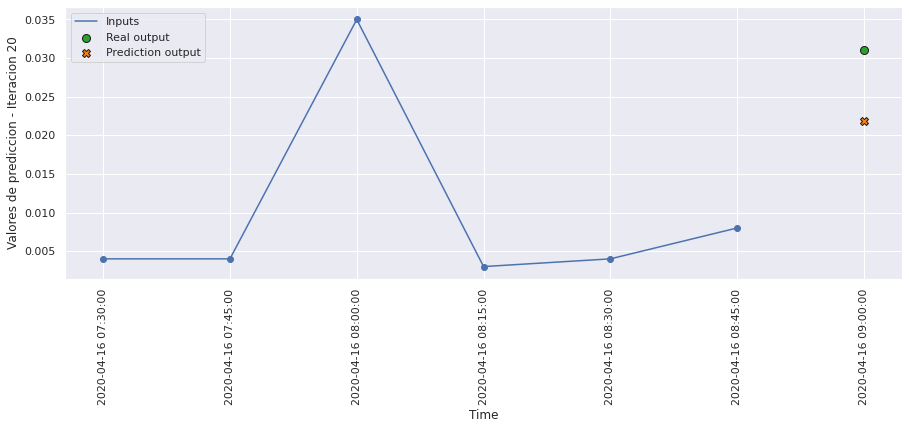

In [56]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict2, 20, 0)

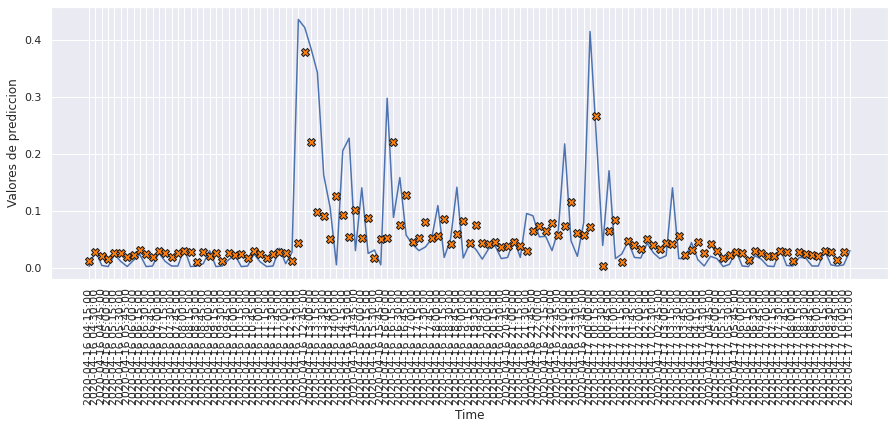

In [57]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict2, 120)

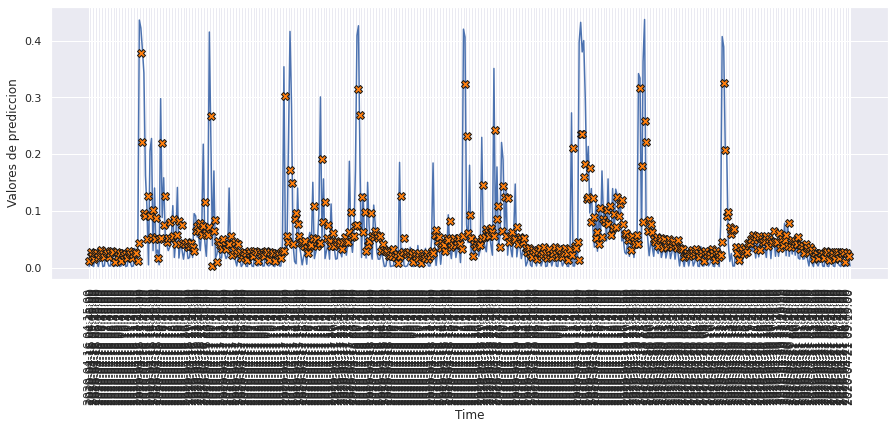

In [58]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict2, 500)

# MODELO 3: LSTM DE 3 CAPAS

### Construimos el modelo

In [59]:
def build_model3():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.LSTM(64, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [60]:
model3 = build_model3()
model3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 6, 128)            66560     
                                                                 
 lstm_4 (LSTM)               (None, 6, 128)            131584    
                                                                 
 lstm_5 (LSTM)               (None, 64)                49408     
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 247,617
Trainable params: 247,617
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [61]:
history3 = model3.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 9s 17ms/step - loss: 0.0052 - mae: 0.0423 - mse: 0.0052 - smape: 0.7706 - val_loss: 0.0041 - val_mae: 0.0293 - val_mse: 0.0041 - val_smape: 0.5654
Epoch 2/200
354/354 [==============================] - 5s 16ms/step - loss: 0.0047 - mae: 0.0402 - mse: 0.0047 - smape: 0.7462 - val_loss: 0.0040 - val_mae: 0.0294 - val_mse: 0.0040 - val_smape: 0.5713
Epoch 3/200
354/354 [==============================] - 5s 15ms/step - loss: 0.0047 - mae: 0.0397 - mse: 0.0047 - smape: 0.7390 - val_loss: 0.0041 - val_mae: 0.0349 - val_mse: 0.0041 - val_smape: 0.6923
Epoch 4/200
354/354 [==============================] - 5s 15ms/step - loss: 0.0047 - mae: 0.0398 - mse: 0.0047 - smape: 0.7419 - val_loss: 0.0039 - val_mae: 0.0338 - val_mse: 0.0039 - val_smape: 0.6859
Epoch 5/200
354/354 [==============================] - 5s 15ms/step - loss: 0.0046 - mae: 0.0395 - mse: 0.0046 - smape: 0.7365 - val_loss: 0.0038 - val_mae: 0.0324 - val_mse: 0.0038 - val_smap

354/354 [==============================] - 5s 16ms/step - loss: 0.0042 - mae: 0.0368 - mse: 0.0042 - smape: 0.6958 - val_loss: 0.0039 - val_mae: 0.0336 - val_mse: 0.0039 - val_smape: 0.6811
Epoch 82/200
354/354 [==============================] - 5s 15ms/step - loss: 0.0042 - mae: 0.0366 - mse: 0.0042 - smape: 0.6923 - val_loss: 0.0039 - val_mae: 0.0323 - val_mse: 0.0039 - val_smape: 0.6580
Epoch 83/200
354/354 [==============================] - 6s 16ms/step - loss: 0.0042 - mae: 0.0366 - mse: 0.0042 - smape: 0.6947 - val_loss: 0.0040 - val_mae: 0.0353 - val_mse: 0.0040 - val_smape: 0.7134
Epoch 84/200
354/354 [==============================] - 5s 15ms/step - loss: 0.0042 - mae: 0.0365 - mse: 0.0042 - smape: 0.6925 - val_loss: 0.0040 - val_mae: 0.0324 - val_mse: 0.0040 - val_smape: 0.6597
Epoch 85/200
354/354 [==============================] - 5s 15ms/step - loss: 0.0041 - mae: 0.0364 - mse: 0.0041 - smape: 0.6921 - val_loss: 0.0040 - val_mae: 0.0329 - val_mse: 0.0040 - val_smape: 0.663

In [62]:
hist3 = pd.DataFrame(history3.history)
hist3['epoch'] = history3.epoch
hist3

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.005235,0.042290,0.005235,0.770585,0.004124,0.029301,0.004124,0.565435,0
1,0.004747,0.040231,0.004747,0.746181,0.003985,0.029396,0.003985,0.571292,1
2,0.004672,0.039740,0.004672,0.739010,0.004053,0.034884,0.004053,0.692287,2
3,0.004663,0.039792,0.004663,0.741928,0.003885,0.033756,0.003885,0.685853,3
4,0.004631,0.039480,0.004631,0.736457,0.003833,0.032448,0.003833,0.655463,4
...,...,...,...,...,...,...,...,...,...
129,0.002708,0.029139,0.002708,0.634008,0.004919,0.035947,0.004919,0.701136,129
130,0.002654,0.028893,0.002654,0.631982,0.004985,0.035086,0.004985,0.680965,130
131,0.002595,0.028364,0.002595,0.624272,0.004974,0.037039,0.004974,0.711617,131
132,0.002570,0.028290,0.002570,0.627582,0.004961,0.033632,0.004961,0.647049,132


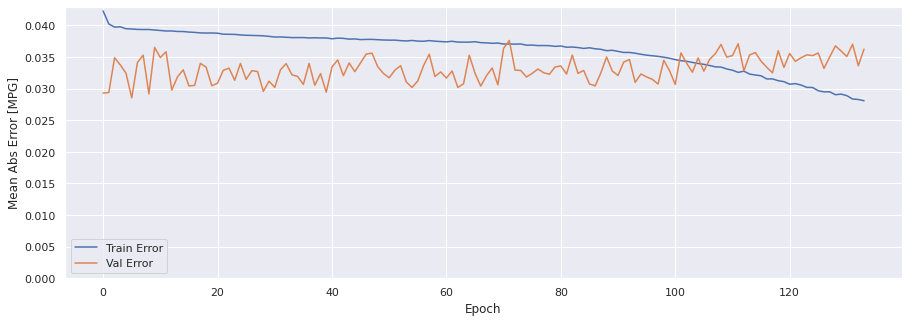

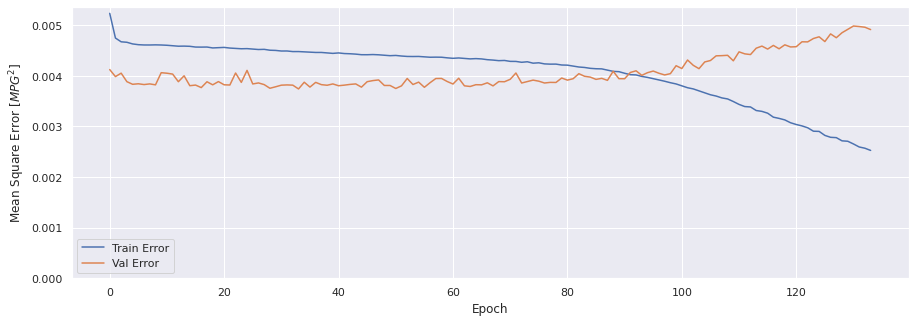

In [63]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history3)

### Evaluar predicciones

In [64]:
score_train3 = model3.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train3[0]}')
print(f'MAE:{score_train3[1]}')
print(f'MSE:{score_train3[2]}')
print(f'SMAPE:{score_train3[3]}')

1413/1413 [==============================] - 11s 7ms/step - loss: 0.0024 - mae: 0.0287 - mse: 0.0024 - smape: 0.6469
Loss:0.0024475513491779566
MAE:0.0286824032664299
MSE:0.0024475513491779566
SMAPE:0.6469143629074097


In [65]:
score_val3 = model3.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val3[0]}')
print(f'MAE:{score_val3[1]}')
print(f'MSE:{score_val3[2]}')
print(f'SMAPE:{score_val3[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0049 - mae: 0.0363 - mse: 0.0049 - smape: 0.7018
Loss:0.0049140662886202335
MAE:0.03625847026705742
MSE:0.0049140662886202335
SMAPE:0.701833188533783


In [66]:
score_test3 = model3.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test3[0]}')
print(f'MAE:{score_test3[1]}')
print(f'MSE:{score_test3[2]}')
print(f'SMAPE:{score_test3[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0058 - mae: 0.0412 - mse: 0.0058 - smape: 0.7208
Loss:0.005798452999442816
MAE:0.04121711850166321
MSE:0.005798452999442816
SMAPE:0.7208102941513062


### Comparativa de resultados

In [67]:
result = hist3.iloc[-1]
comparativa3 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test3[1], score_test3[2], score_test3[3], math.sqrt(score_test3[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa3.style.set_caption("Método de ventana de un paso - LSTM de tres capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.028091,0.002527,0.628229,0.050266
VALIDACION,0.036258,0.004914,0.702604,0.070100
TEST,0.041217,0.005798,0.720810,0.076148


### Obtener predicciones

In [68]:
trainPredict3 = model3.predict(scaled_trainX)
testPredict3 = model3.predict(scaled_testX)

### Visualización de las predicciones

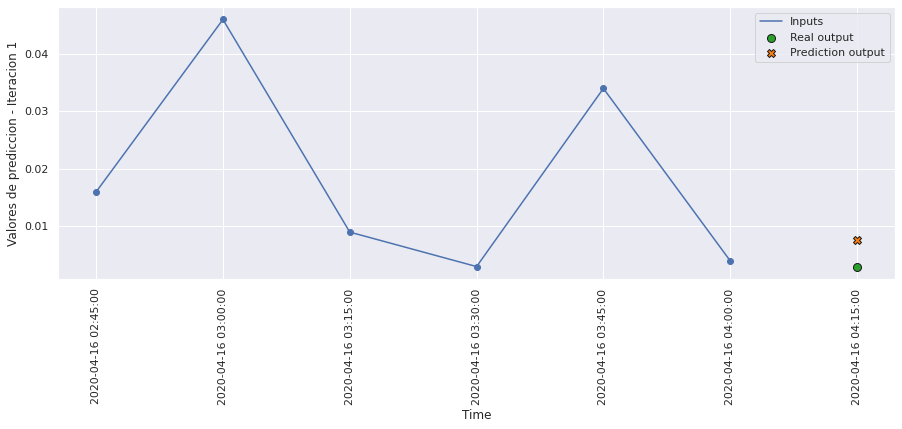

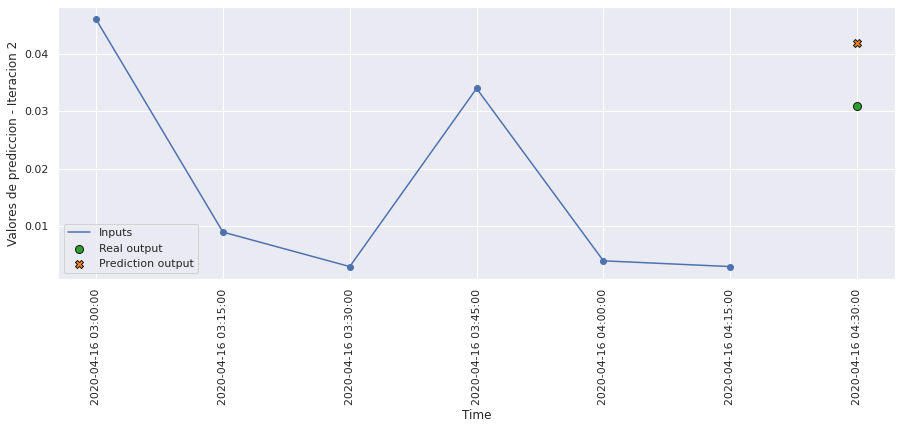

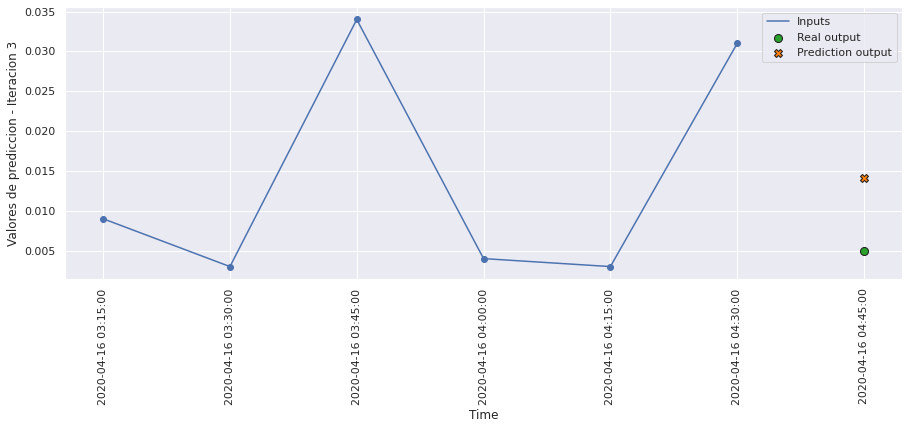

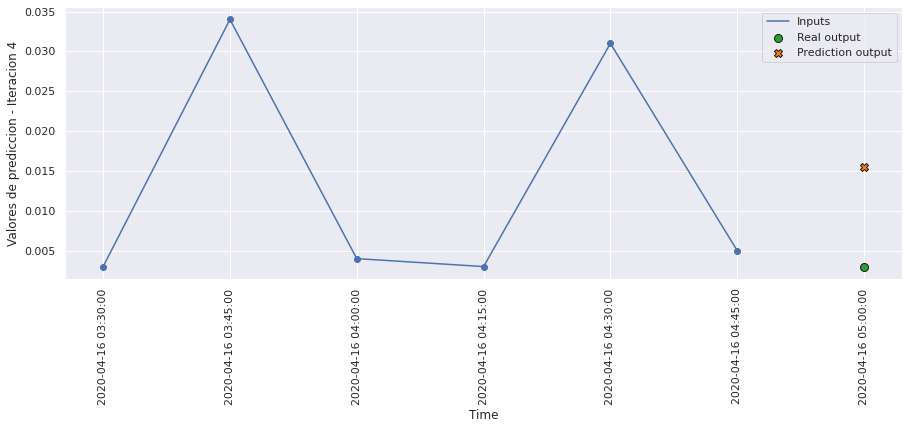

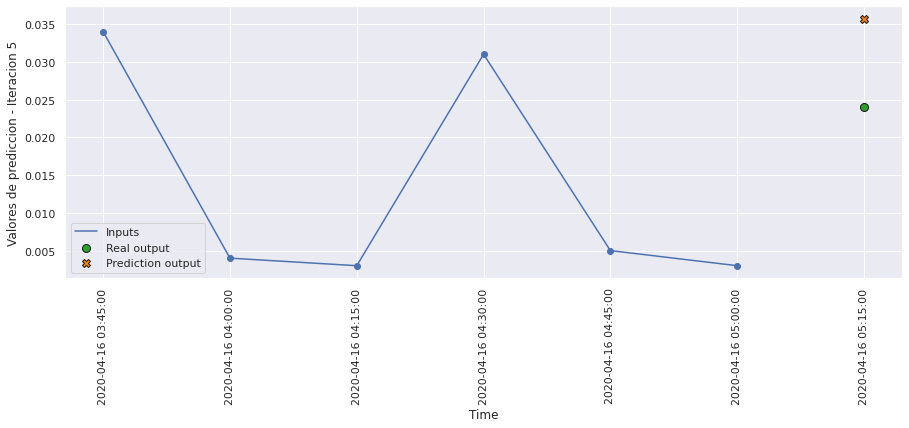

...

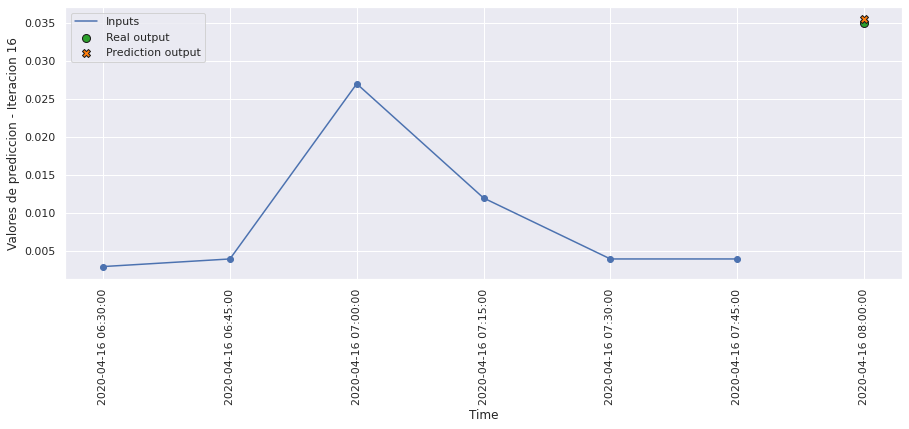

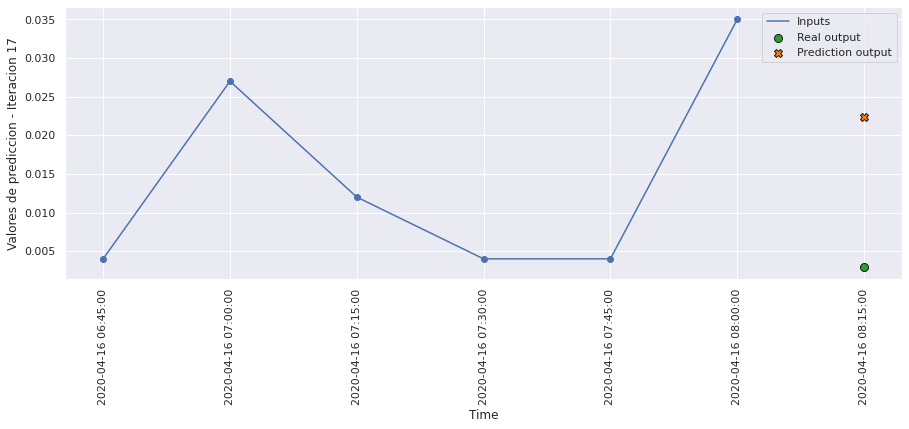

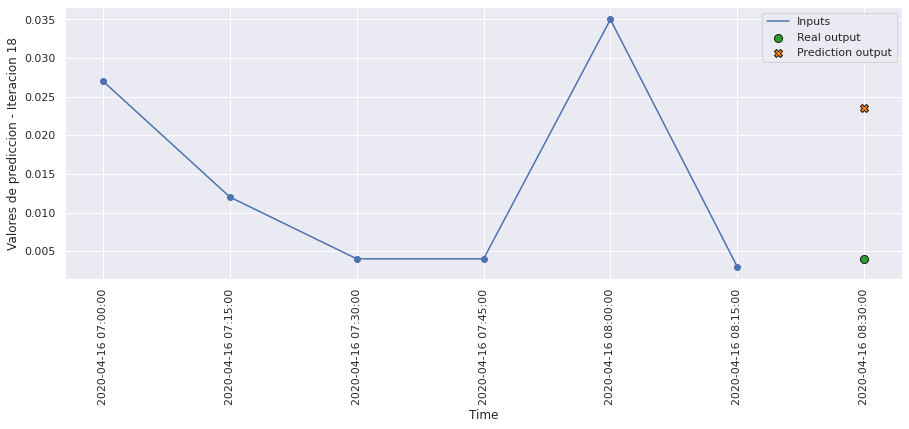

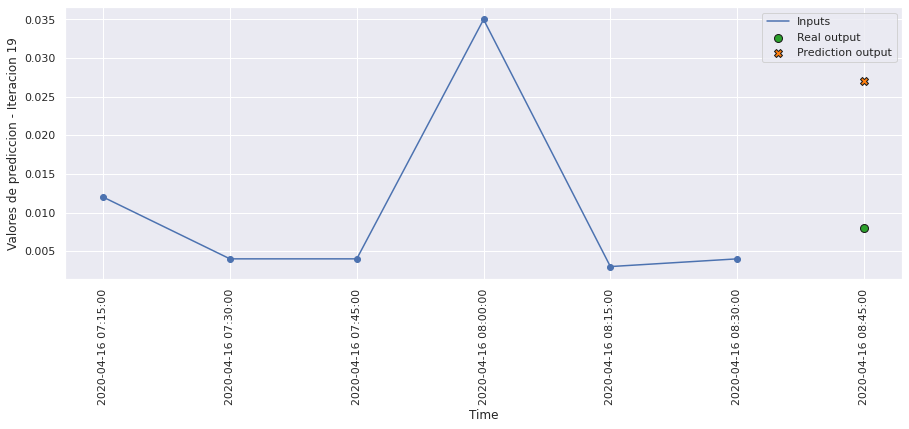

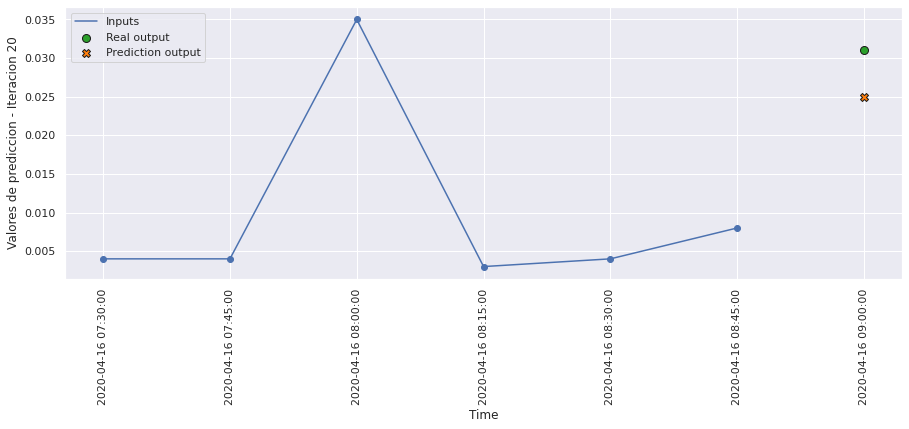

In [69]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict3, 20, 0)

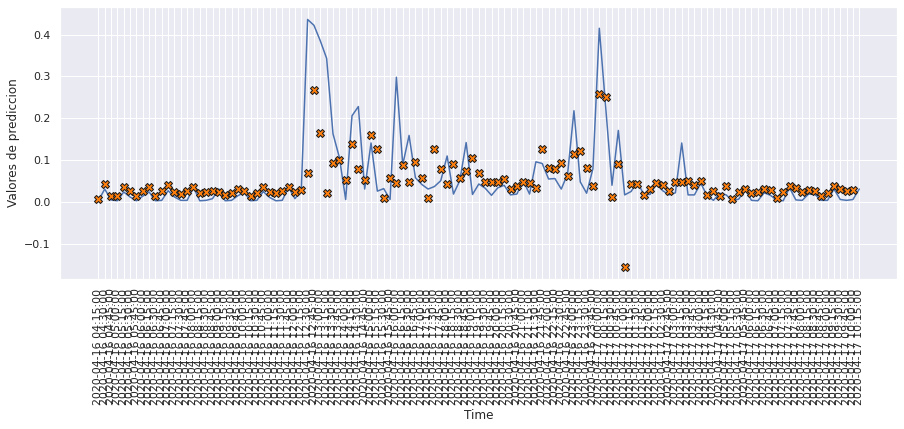

In [70]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict3, 120)

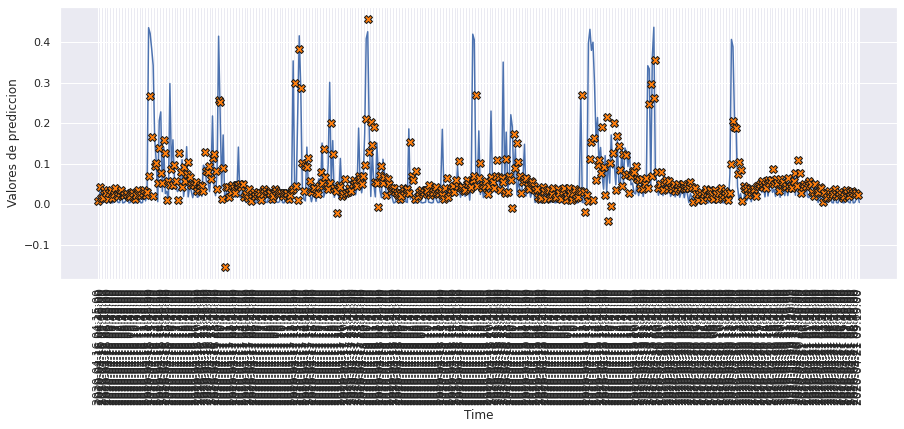

In [71]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict3, 500)

# MODELO 4: LSTM BIDIRECCIONAL

### Construimos el modelo

In [72]:
def build_model4():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, activation='tanh')),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [73]:
model4 = build_model4()
model4.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional (Bidirectiona  (None, 256)              133120    
 l)                                                              
                                                                 
 dense_3 (Dense)             (None, 1)                 257       
                                                                 
Total params: 133,377
Trainable params: 133,377
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [74]:
history4 = model4.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 6s 12ms/step - loss: 0.0050 - mae: 0.0414 - mse: 0.0050 - smape: 0.7597 - val_loss: 0.0040 - val_mae: 0.0343 - val_mse: 0.0040 - val_smape: 0.6793
Epoch 2/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0047 - mae: 0.0401 - mse: 0.0047 - smape: 0.7421 - val_loss: 0.0041 - val_mae: 0.0367 - val_mse: 0.0041 - val_smape: 0.7172
Epoch 3/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0047 - mae: 0.0400 - mse: 0.0047 - smape: 0.7398 - val_loss: 0.0040 - val_mae: 0.0314 - val_mse: 0.0040 - val_smape: 0.6126
Epoch 4/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0047 - mae: 0.0398 - mse: 0.0047 - smape: 0.7384 - val_loss: 0.0040 - val_mae: 0.0338 - val_mse: 0.0040 - val_smape: 0.6750
Epoch 5/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0047 - mae: 0.0399 - mse: 0.0047 - smape: 0.7415 - val_loss: 0.0040 - val_mae: 0.0307 - val_mse: 0.0040 - val_smap

354/354 [==============================] - 4s 10ms/step - loss: 0.0045 - mae: 0.0382 - mse: 0.0045 - smape: 0.7112 - val_loss: 0.0038 - val_mae: 0.0340 - val_mse: 0.0038 - val_smape: 0.6943
Epoch 82/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0045 - mae: 0.0381 - mse: 0.0045 - smape: 0.7115 - val_loss: 0.0038 - val_mae: 0.0319 - val_mse: 0.0038 - val_smape: 0.6501
Epoch 83/200
354/354 [==============================] - 4s 10ms/step - loss: 0.0045 - mae: 0.0381 - mse: 0.0045 - smape: 0.7111 - val_loss: 0.0038 - val_mae: 0.0332 - val_mse: 0.0038 - val_smape: 0.6764
Epoch 84/200
354/354 [==============================] - 4s 10ms/step - loss: 0.0045 - mae: 0.0382 - mse: 0.0045 - smape: 0.7119 - val_loss: 0.0038 - val_mae: 0.0321 - val_mse: 0.0038 - val_smape: 0.6521
Epoch 85/200
354/354 [==============================] - 4s 10ms/step - loss: 0.0045 - mae: 0.0381 - mse: 0.0045 - smape: 0.7098 - val_loss: 0.0038 - val_mae: 0.0317 - val_mse: 0.0038 - val_smape: 0.652

354/354 [==============================] - 4s 11ms/step - loss: 0.0044 - mae: 0.0376 - mse: 0.0044 - smape: 0.7041 - val_loss: 0.0039 - val_mae: 0.0337 - val_mse: 0.0039 - val_smape: 0.6849
Epoch 162/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0044 - mae: 0.0376 - mse: 0.0044 - smape: 0.7027 - val_loss: 0.0038 - val_mae: 0.0329 - val_mse: 0.0038 - val_smape: 0.6620
Epoch 163/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0044 - mae: 0.0376 - mse: 0.0044 - smape: 0.7024 - val_loss: 0.0038 - val_mae: 0.0324 - val_mse: 0.0038 - val_smape: 0.6561
Epoch 164/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0044 - mae: 0.0375 - mse: 0.0044 - smape: 0.7023 - val_loss: 0.0038 - val_mae: 0.0318 - val_mse: 0.0038 - val_smape: 0.6431
Epoch 165/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0044 - mae: 0.0376 - mse: 0.0044 - smape: 0.7039 - val_loss: 0.0039 - val_mae: 0.0326 - val_mse: 0.0039 - val_smape: 0

In [75]:
hist4 = pd.DataFrame(history4.history)
hist4['epoch'] = history4.epoch
hist4

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.004995,0.041379,0.004995,0.759714,0.004022,0.034325,0.004022,0.679337,0
1,0.004724,0.040097,0.004724,0.742098,0.004129,0.036715,0.004129,0.717231,1
2,0.004702,0.039964,0.004702,0.739752,0.004021,0.031425,0.004021,0.612612,2
3,0.004686,0.039837,0.004686,0.738425,0.004026,0.033814,0.004026,0.675044,3
4,0.004678,0.039931,0.004678,0.741538,0.004045,0.030669,0.004045,0.579843,4
...,...,...,...,...,...,...,...,...,...
186,0.004349,0.037341,0.004349,0.701427,0.003861,0.033084,0.003861,0.672024,186
187,0.004352,0.037356,0.004352,0.700589,0.003855,0.033374,0.003855,0.675516,187
188,0.004343,0.037353,0.004343,0.699728,0.003865,0.030711,0.003865,0.622691,188
189,0.004340,0.037294,0.004340,0.698787,0.003945,0.032300,0.003945,0.653494,189


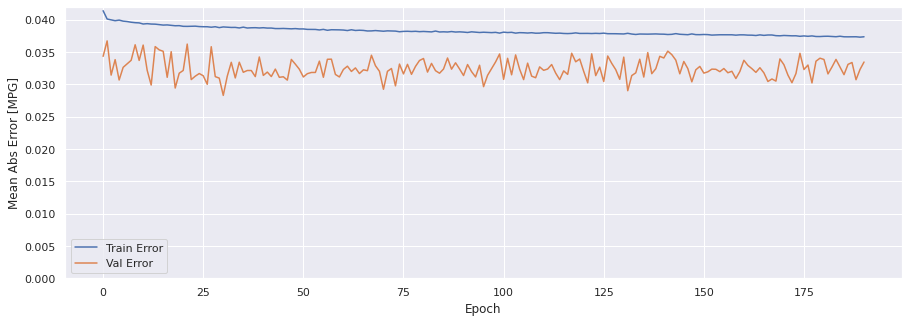

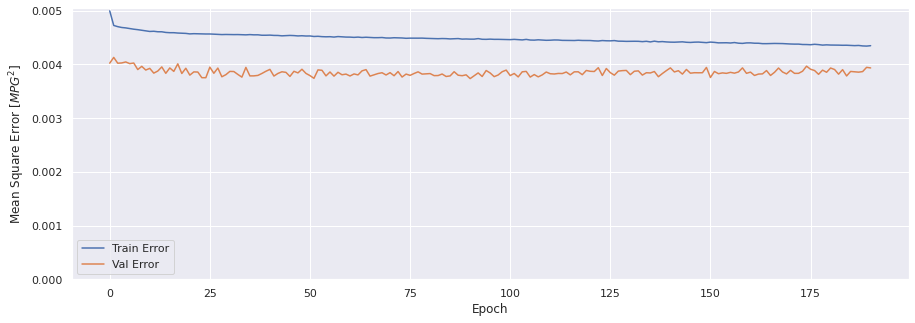

In [76]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history4)

### Evaluar predicciones

In [77]:
score_train4 = model4.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train4[0]}')
print(f'MAE:{score_train4[1]}')
print(f'MSE:{score_train4[2]}')
print(f'SMAPE:{score_train4[3]}')

1413/1413 [==============================] - 8s 6ms/step - loss: 0.0044 - mae: 0.0374 - mse: 0.0044 - smape: 0.7051
Loss:0.0043548401445150375
MAE:0.03741182014346123
MSE:0.0043548401445150375
SMAPE:0.7050663828849792


In [78]:
score_val4 = model4.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val4[0]}')
print(f'MAE:{score_val4[1]}')
print(f'MSE:{score_val4[2]}')
print(f'SMAPE:{score_val4[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0039 - mae: 0.0334 - mse: 0.0039 - smape: 0.6793
Loss:0.003933632280677557
MAE:0.03344821557402611
MSE:0.003933632280677557
SMAPE:0.6792516708374023


In [79]:
score_test4 = model4.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test4[0]}')
print(f'MAE:{score_test4[1]}')
print(f'MSE:{score_test4[2]}')
print(f'SMAPE:{score_test4[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0046 - mae: 0.0391 - mse: 0.0046 - smape: 0.7153
Loss:0.0046133557334542274
MAE:0.03908601030707359
MSE:0.0046133557334542274
SMAPE:0.71531742811203


### Comparativa de resultados

In [80]:
result = hist4.iloc[-1]
comparativa4 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test4[1], score_test4[2], score_test4[3], math.sqrt(score_test4[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa4.style.set_caption("Método de ventana de un paso - Bidireccional LSTM")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.037352,0.004348,0.701256,0.065936
VALIDACION,0.033448,0.003934,0.679997,0.062719
TEST,0.039086,0.004613,0.715317,0.067922


### Obtener predicciones

In [81]:
trainPredict4 = model4.predict(scaled_trainX)
testPredict4 = model4.predict(scaled_testX)

### Visualización de las predicciones

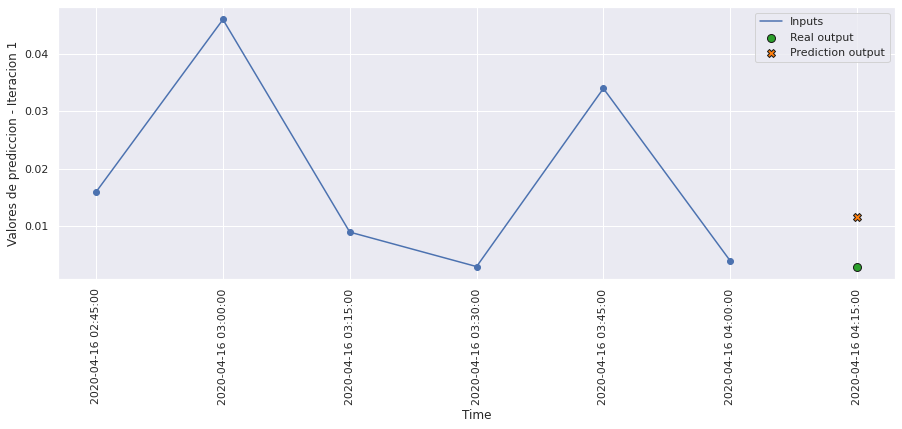

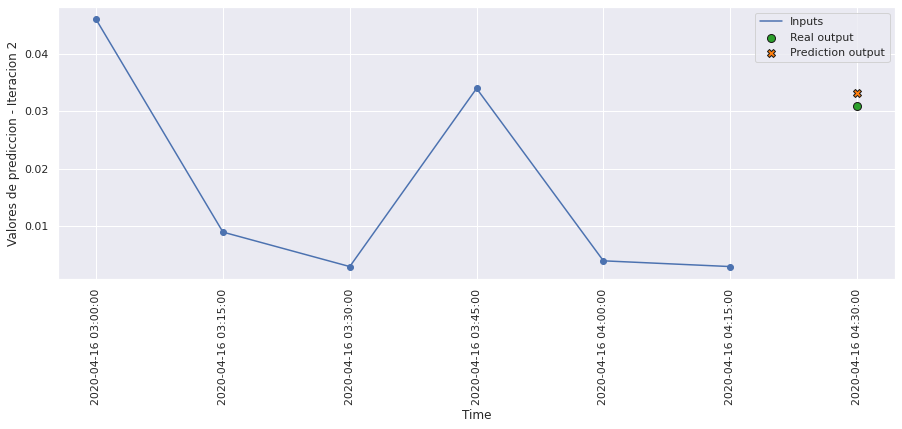

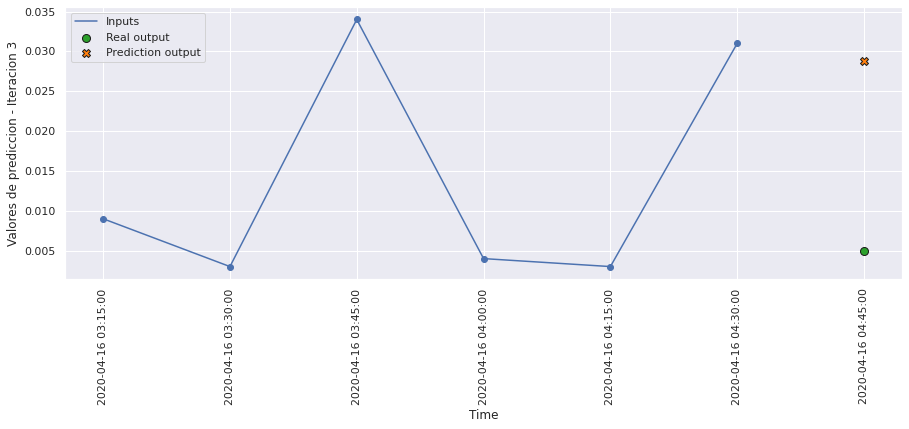

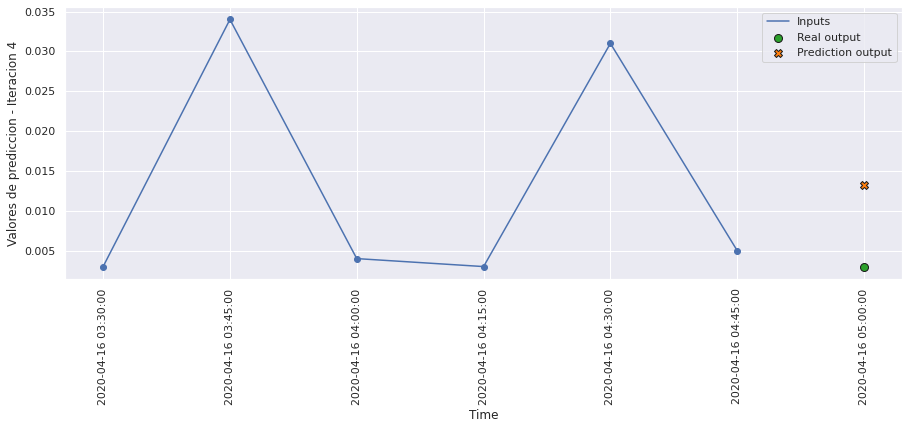

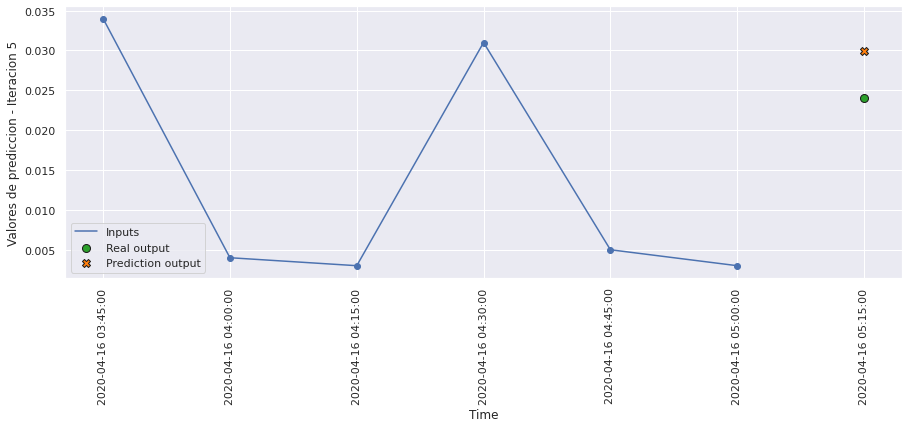

...

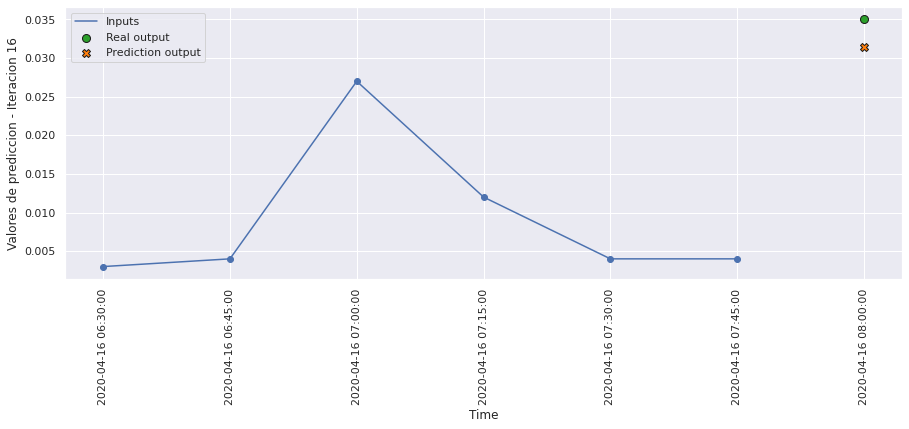

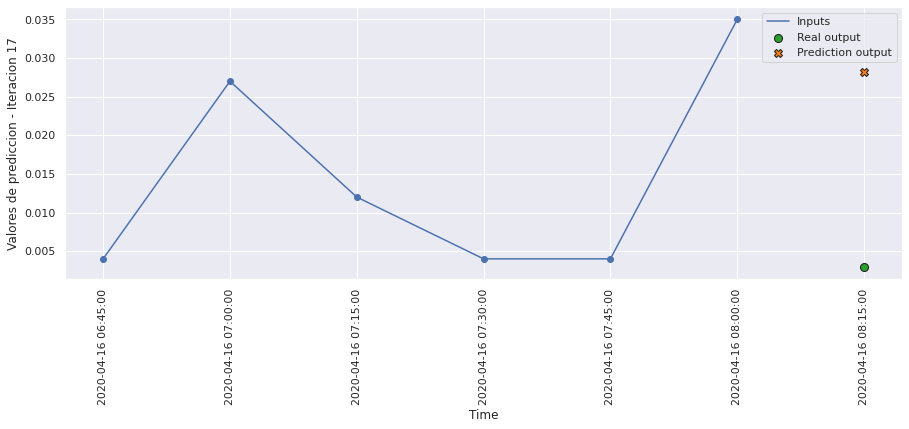

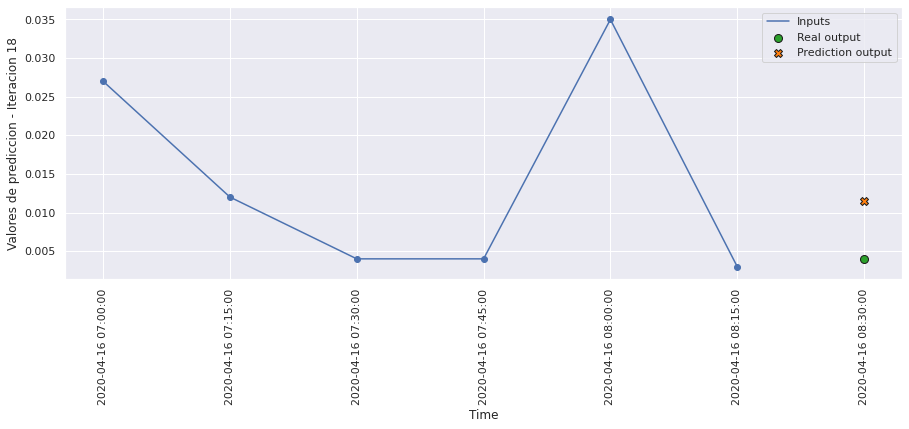

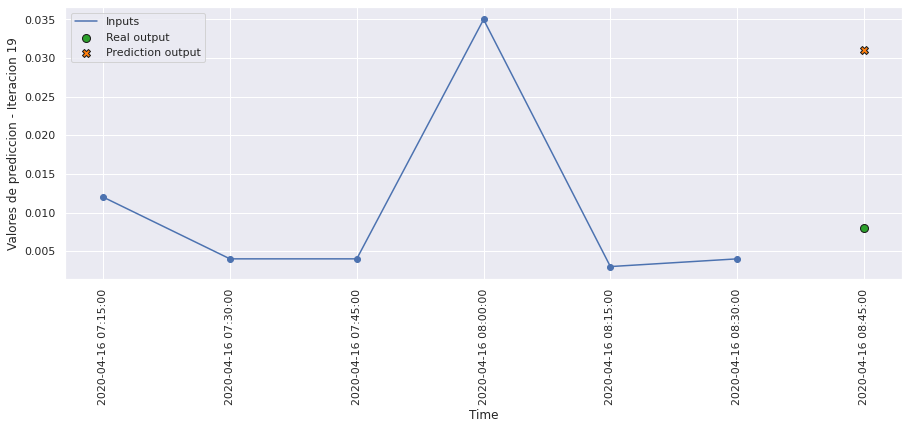

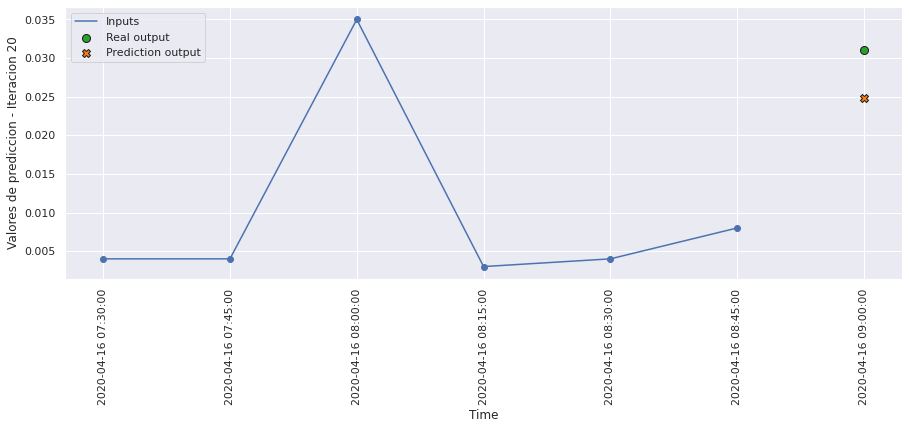

In [82]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict4, 20, 0)

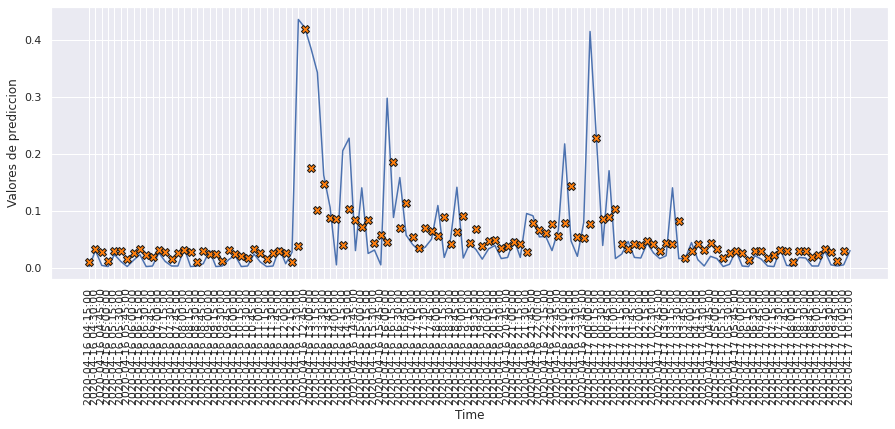

In [83]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict4, 120)

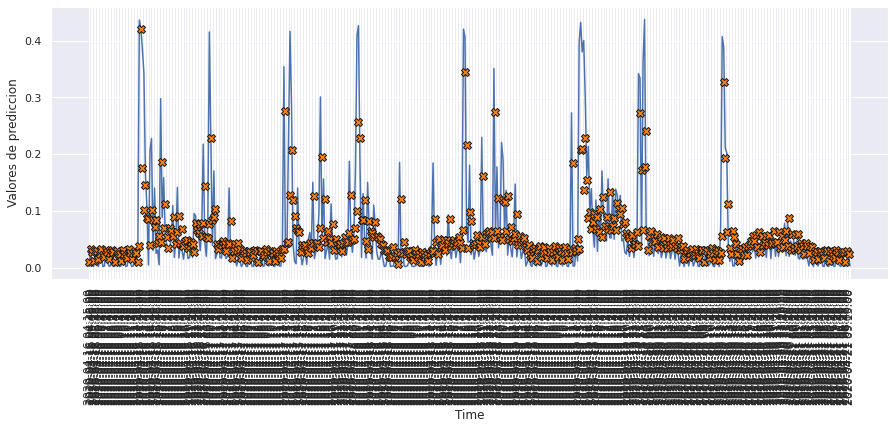

In [84]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict4, 500)

# MODELO 5: CONVOLUCIONAL 1D

### Construimos el modelo

In [85]:
def build_model5():
    model = tf.keras.Sequential([
        tf.keras.layers.TimeDistributed(tf.keras.layers.Conv1D(filters=64, kernel_size=1, activation='relu'), 
                                        input_shape=(None, n_entrada, n_features)),
        tf.keras.layers.TimeDistributed(tf.keras.layers.MaxPooling1D(pool_size=2)),
        tf.keras.layers.TimeDistributed(tf.keras.layers.Flatten()),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [86]:
model5 = build_model5()
model5.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, None, 6, 64)      128       
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, None, 3, 64)      0         
 tributed)                                                       
                                                                 
 time_distributed_2 (TimeDis  (None, None, 192)        0         
 tributed)                                                       
                                                                 
 dense_4 (Dense)             (None, None, 1)           193       
                                                                 
Total params: 321
Trainable params: 321
Non-trainable params: 0
________________________________________________________

### Entrenamiento del modelo

In [87]:
history5 = model5.fit(scaled_trainX_4D, data_trainY_3D, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX_4D, data_valY_3D), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 3s 7ms/step - loss: 0.0056 - mae: 0.0441 - mse: 0.0056 - smape: 0.7967 - val_loss: 0.0047 - val_mae: 0.0345 - val_mse: 0.0047 - val_smape: 0.6502
Epoch 2/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0052 - mae: 0.0421 - mse: 0.0052 - smape: 0.7564 - val_loss: 0.0047 - val_mae: 0.0347 - val_mse: 0.0047 - val_smape: 0.6597
Epoch 3/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0052 - mae: 0.0421 - mse: 0.0052 - smape: 0.7581 - val_loss: 0.0047 - val_mae: 0.0373 - val_mse: 0.0047 - val_smape: 0.6993
Epoch 4/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0052 - mae: 0.0420 - mse: 0.0052 - smape: 0.7565 - val_loss: 0.0047 - val_mae: 0.0341 - val_mse: 0.0047 - val_smape: 0.6444
Epoch 5/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0052 - mae: 0.0420 - mse: 0.0052 - smape: 0.7561 - val_loss: 0.0047 - val_mae: 0.0354 - val_mse: 0.0047 - val_smape: 0.

Epoch 82/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0051 - mae: 0.0415 - mse: 0.0051 - smape: 0.7463 - val_loss: 0.0047 - val_mae: 0.0334 - val_mse: 0.0047 - val_smape: 0.6282
Epoch 83/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0052 - mae: 0.0415 - mse: 0.0052 - smape: 0.7473 - val_loss: 0.0048 - val_mae: 0.0333 - val_mse: 0.0048 - val_smape: 0.6363
Epoch 84/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0051 - mae: 0.0415 - mse: 0.0051 - smape: 0.7460 - val_loss: 0.0047 - val_mae: 0.0335 - val_mse: 0.0047 - val_smape: 0.6287
Epoch 85/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0051 - mae: 0.0415 - mse: 0.0051 - smape: 0.7460 - val_loss: 0.0048 - val_mae: 0.0332 - val_mse: 0.0048 - val_smape: 0.6238
Epoch 86/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0051 - mae: 0.0414 - mse: 0.0051 - smape: 0.7465 - val_loss: 0.0047 - val_mae: 0.0336 - val_mse: 0.0047 - val_smap

354/354 [==============================] - 2s 7ms/step - loss: 0.0051 - mae: 0.0413 - mse: 0.0051 - smape: 0.7428 - val_loss: 0.0048 - val_mae: 0.0339 - val_mse: 0.0048 - val_smape: 0.6367
Epoch 163/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0051 - mae: 0.0414 - mse: 0.0051 - smape: 0.7452 - val_loss: 0.0048 - val_mae: 0.0344 - val_mse: 0.0048 - val_smape: 0.6357
Epoch 164/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0051 - mae: 0.0414 - mse: 0.0051 - smape: 0.7447 - val_loss: 0.0047 - val_mae: 0.0346 - val_mse: 0.0047 - val_smape: 0.6427
Epoch 165/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0051 - mae: 0.0413 - mse: 0.0051 - smape: 0.7447 - val_loss: 0.0047 - val_mae: 0.0347 - val_mse: 0.0047 - val_smape: 0.6433
Epoch 166/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0051 - mae: 0.0414 - mse: 0.0051 - smape: 0.7458 - val_loss: 0.0047 - val_mae: 0.0339 - val_mse: 0.0047 - val_smape: 0.6313

In [88]:
hist5 = pd.DataFrame(history5.history)
hist5['epoch'] = history5.epoch
hist5

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.005573,0.044062,0.005573,0.796683,0.004721,0.034498,0.004721,0.650219,0
1,0.005221,0.042063,0.005221,0.756378,0.004737,0.034694,0.004737,0.659729,1
2,0.005213,0.042052,0.005213,0.758145,0.004700,0.037321,0.004700,0.699296,2
3,0.005210,0.042020,0.005210,0.756544,0.004707,0.034110,0.004707,0.644365,3
4,0.005203,0.041953,0.005203,0.756090,0.004710,0.035434,0.004710,0.670294,4
...,...,...,...,...,...,...,...,...,...
195,0.005130,0.041346,0.005130,0.745236,0.004732,0.033901,0.004732,0.630745,195
196,0.005127,0.041234,0.005127,0.742350,0.004815,0.033100,0.004815,0.637886,196
197,0.005133,0.041367,0.005133,0.744761,0.004912,0.033152,0.004912,0.639708,197
198,0.005131,0.041307,0.005131,0.744033,0.004885,0.033291,0.004885,0.651661,198


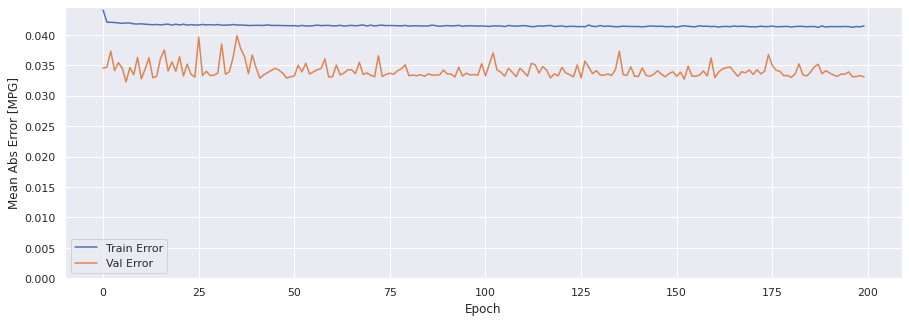

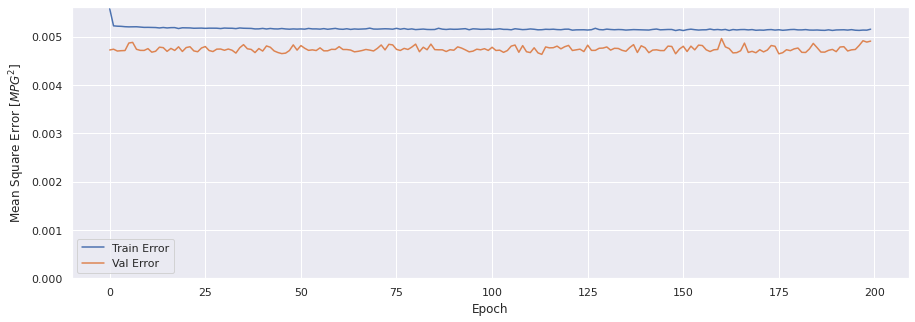

In [89]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history5)

### Evaluar predicciones

In [90]:
score_train5 = model5.evaluate(scaled_trainX_4D, data_trainY_3D, verbose=1)
print(f'Loss:{score_train5[0]}')
print(f'MAE:{score_train5[1]}')
print(f'MSE:{score_train5[2]}')
print(f'SMAPE:{score_train5[3]}')

1413/1413 [==============================] - 7s 5ms/step - loss: 0.0052 - mae: 0.0389 - mse: 0.0052 - smape: 0.7168
Loss:0.005216573365032673
MAE:0.03892408683896065
MSE:0.005216573365032673
SMAPE:0.7168259620666504


In [91]:
score_val5 = model5.evaluate(scaled_valX_4D, data_valY_3D, verbose=1)
print(f'Loss:{score_val5[0]}')
print(f'MAE:{score_val5[1]}')
print(f'MSE:{score_val5[2]}')
print(f'SMAPE:{score_val5[3]}')

303/303 [==============================] - 1s 5ms/step - loss: 0.0049 - mae: 0.0331 - mse: 0.0049 - smape: 0.6414
Loss:0.004904771223664284
MAE:0.033090896904468536
MSE:0.004904771223664284
SMAPE:0.6414329409599304


In [92]:
score_test5 = model5.evaluate(scaled_testX_4D, data_testY_3D, verbose=1)
print(f'Loss:{score_test5[0]}')
print(f'MAE:{score_test5[1]}')
print(f'MSE:{score_test5[2]}')
print(f'SMAPE:{score_test5[3]}')

303/303 [==============================] - 1s 5ms/step - loss: 0.0053 - mae: 0.0380 - mse: 0.0053 - smape: 0.6786
Loss:0.005286352708935738
MAE:0.03803274780511856
MSE:0.005286352708935738
SMAPE:0.6785984039306641


### Comparativa de resultados

In [93]:
result = hist5.iloc[-1]
comparativa5 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test5[1], score_test5[2], score_test5[3], math.sqrt(score_test5[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa5.style.set_caption("Método de ventana de un paso - Convolucional 1D")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.041483,0.005151,0.746133,0.071773
VALIDACION,0.033091,0.004905,0.642253,0.070034
TEST,0.038033,0.005286,0.678598,0.072707


### Obtener predicciones

In [94]:
trainPredict5 = model5.predict(scaled_trainX_4D)
testPredict5 = model5.predict(scaled_testX_4D)

### Visualización de las predicciones

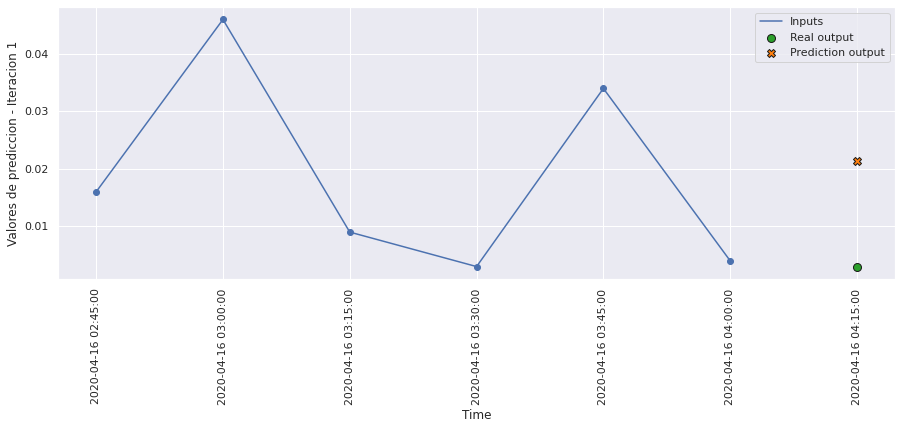

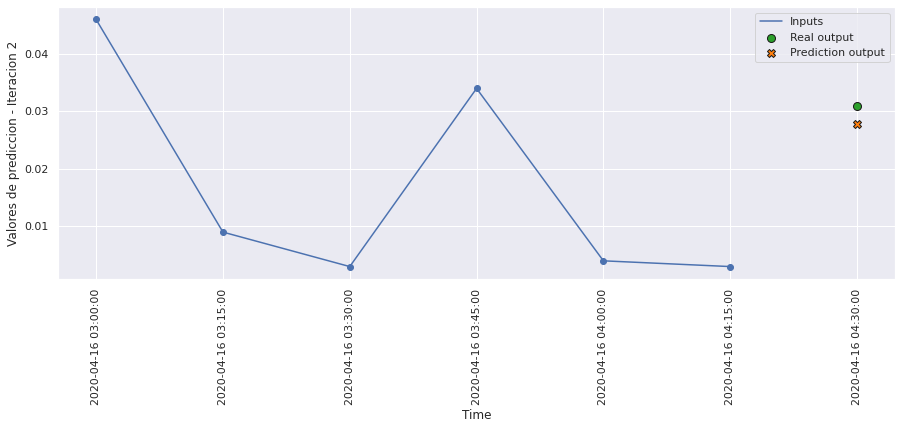

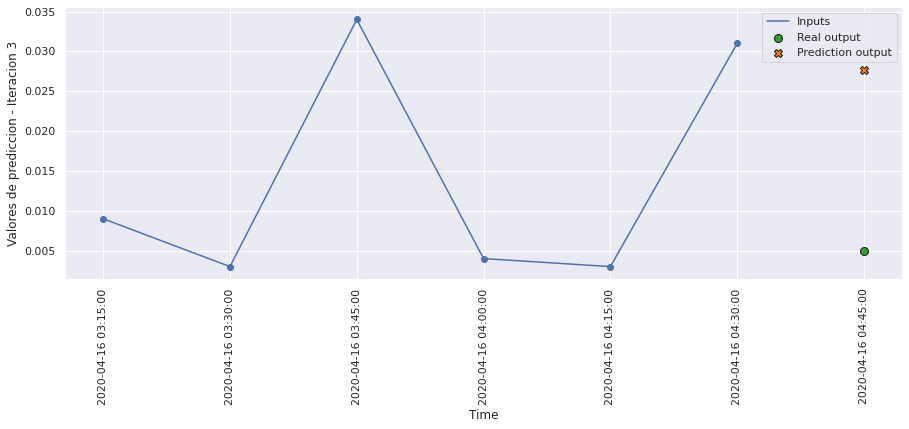

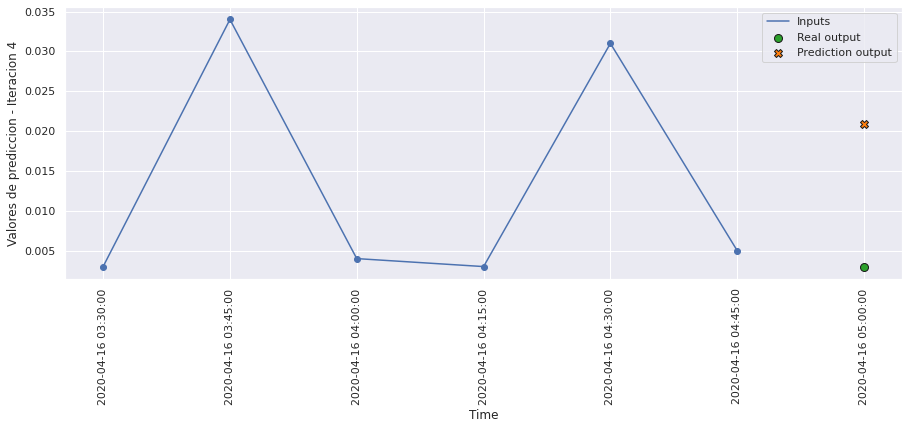

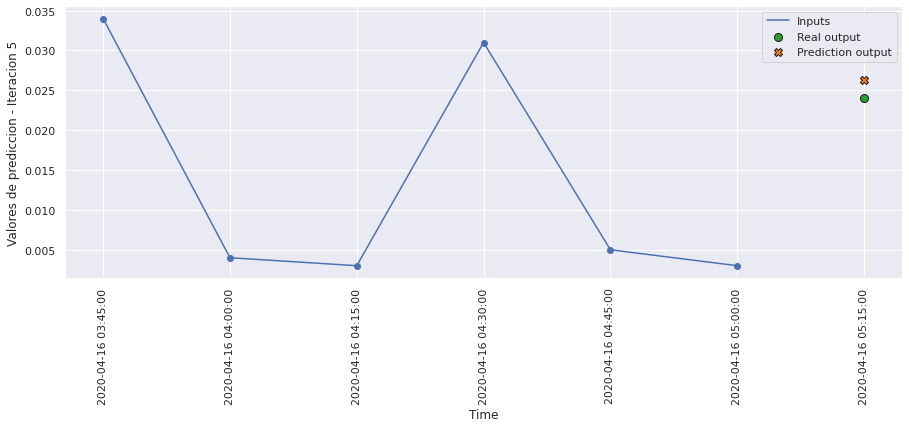

...

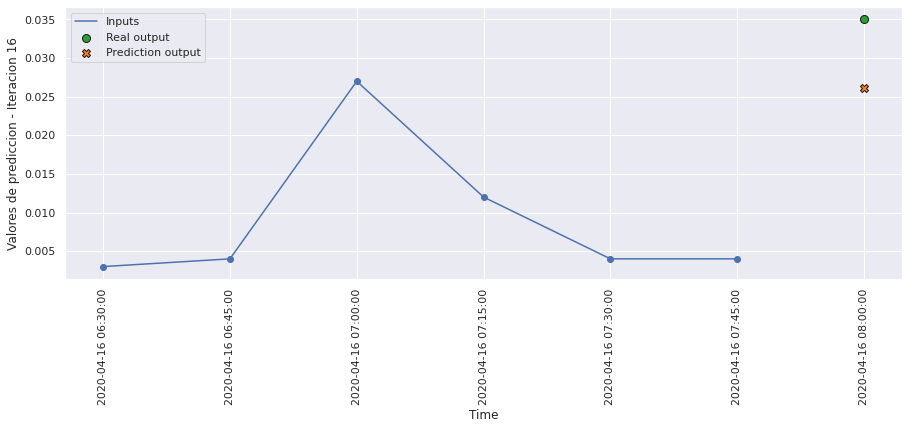

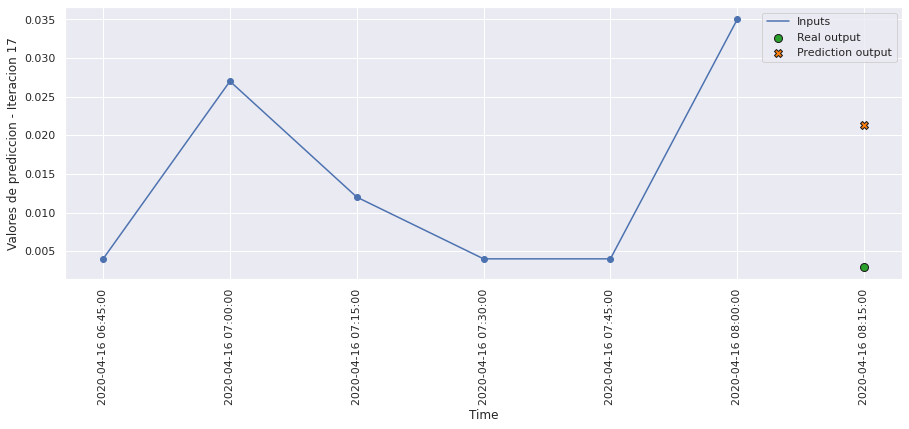

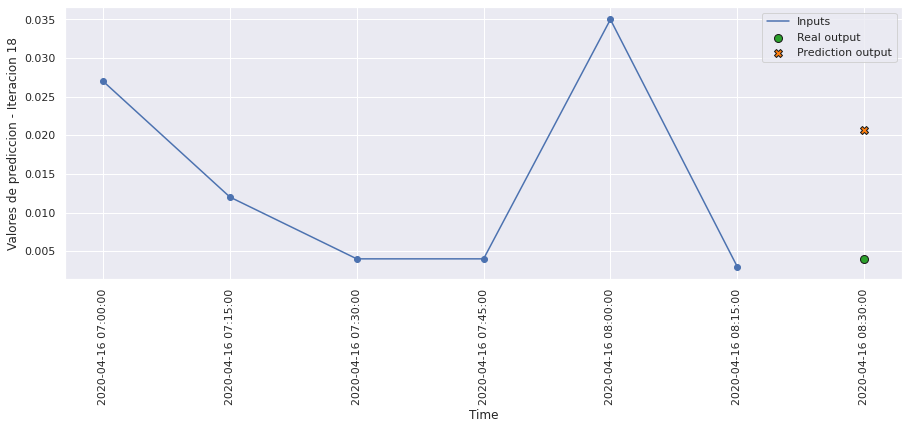

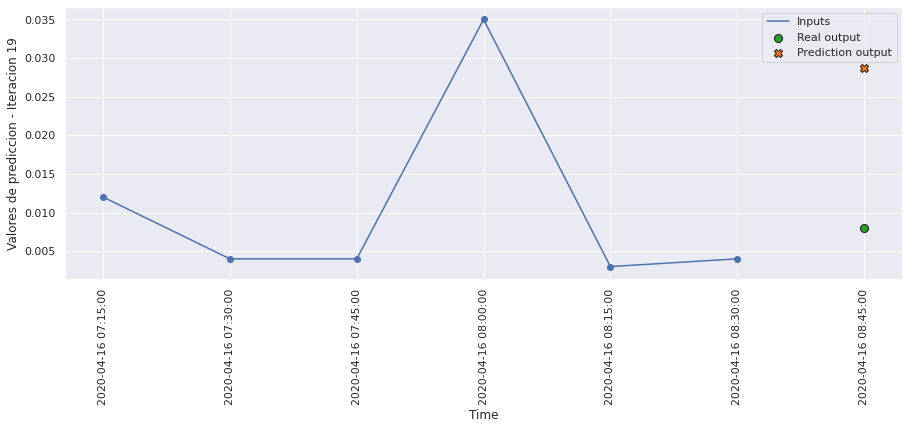

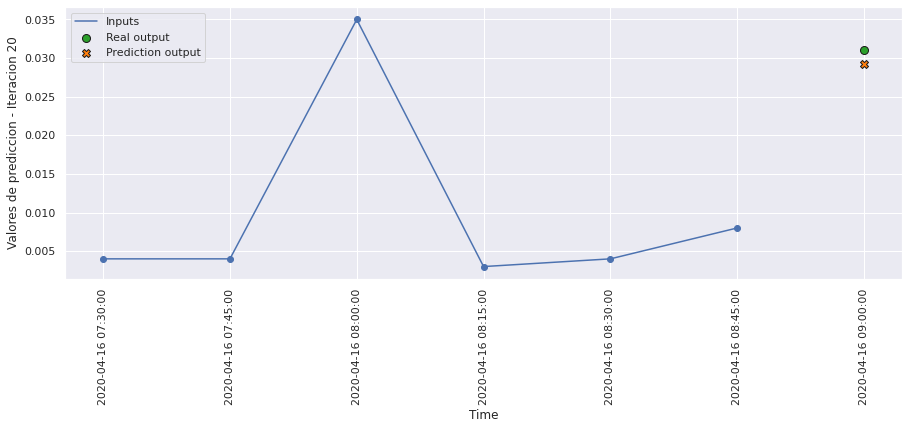

In [95]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, 
                        testPredict5.reshape(testPredict5.shape[0],n_predicciones), 20, 0)

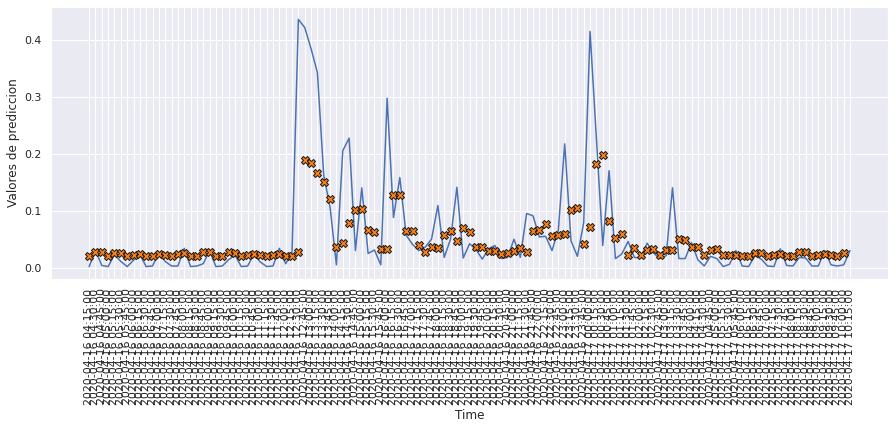

In [96]:
plot_window_predictions_values(int(test_df.iloc[0].name), 
                               testPredict5.reshape(testPredict5.shape[0],n_predicciones), 120)

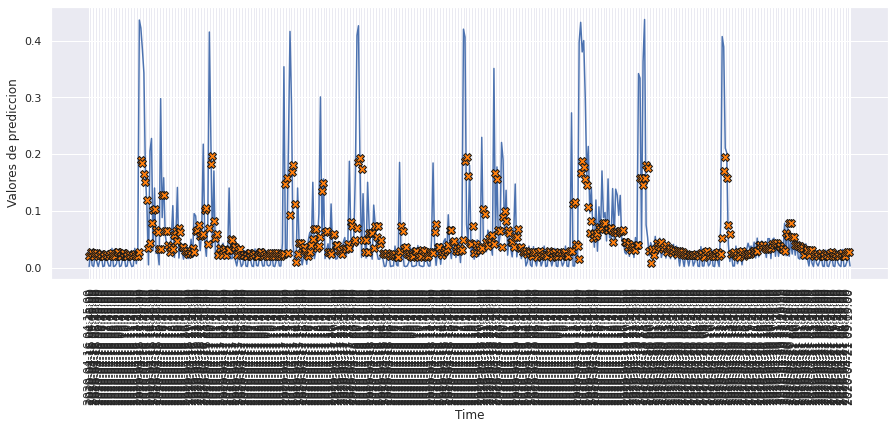

In [97]:
plot_window_predictions_values(int(test_df.iloc[0].name), 
                               testPredict5.reshape(testPredict5.shape[0],n_predicciones), 500)

# MODELO 6: CONVOLUCIONAL 1D CON LSTM 

### Construimos el modelo

In [98]:
def build_model6():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(None, n_entrada, n_features)),
        tf.keras.layers.TimeDistributed(tf.keras.layers.Conv1D(filters=64, kernel_size=1, activation='relu')), 
        tf.keras.layers.TimeDistributed(tf.keras.layers.MaxPooling1D(pool_size=2)),
        tf.keras.layers.TimeDistributed(tf.keras.layers.Flatten()),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [99]:
model6 = build_model6()
model6.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_3 (TimeDis  (None, None, 6, 64)      128       
 tributed)                                                       
                                                                 
 time_distributed_4 (TimeDis  (None, None, 3, 64)      0         
 tributed)                                                       
                                                                 
 time_distributed_5 (TimeDis  (None, None, 192)        0         
 tributed)                                                       
                                                                 
 lstm_7 (LSTM)               (None, None, 128)         164352    
                                                                 
 dense_5 (Dense)             (None, None, 1)           129       
                                                      

### Entrenamiento del modelo

In [100]:
history6 = model6.fit(scaled_trainX_4D, data_trainY_3D, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX_4D, data_valY_3D), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 5s 11ms/step - loss: 0.0053 - mae: 0.0428 - mse: 0.0053 - smape: 0.7706 - val_loss: 0.0046 - val_mae: 0.0387 - val_mse: 0.0046 - val_smape: 0.7328
Epoch 2/200
354/354 [==============================] - 4s 10ms/step - loss: 0.0051 - mae: 0.0419 - mse: 0.0051 - smape: 0.7563 - val_loss: 0.0043 - val_mae: 0.0320 - val_mse: 0.0043 - val_smape: 0.6226
Epoch 3/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0051 - mae: 0.0417 - mse: 0.0051 - smape: 0.7547 - val_loss: 0.0043 - val_mae: 0.0332 - val_mse: 0.0043 - val_smape: 0.6480
Epoch 4/200
354/354 [==============================] - 4s 10ms/step - loss: 0.0050 - mae: 0.0414 - mse: 0.0050 - smape: 0.7510 - val_loss: 0.0042 - val_mae: 0.0317 - val_mse: 0.0042 - val_smape: 0.6174
Epoch 5/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0050 - mae: 0.0414 - mse: 0.0050 - smape: 0.7505 - val_loss: 0.0043 - val_mae: 0.0322 - val_mse: 0.0043 - val_smape

354/354 [==============================] - 3s 10ms/step - loss: 0.0048 - mae: 0.0399 - mse: 0.0048 - smape: 0.7236 - val_loss: 0.0042 - val_mae: 0.0323 - val_mse: 0.0042 - val_smape: 0.6270
Epoch 82/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0048 - mae: 0.0399 - mse: 0.0048 - smape: 0.7237 - val_loss: 0.0042 - val_mae: 0.0323 - val_mse: 0.0042 - val_smape: 0.6270
Epoch 83/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0049 - mae: 0.0399 - mse: 0.0049 - smape: 0.7234 - val_loss: 0.0042 - val_mae: 0.0324 - val_mse: 0.0042 - val_smape: 0.6287
Epoch 84/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0048 - mae: 0.0399 - mse: 0.0048 - smape: 0.7257 - val_loss: 0.0043 - val_mae: 0.0321 - val_mse: 0.0043 - val_smape: 0.6268
Epoch 85/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0049 - mae: 0.0399 - mse: 0.0049 - smape: 0.7237 - val_loss: 0.0043 - val_mae: 0.0325 - val_mse: 0.0043 - val_smape: 0.628

354/354 [==============================] - 3s 10ms/step - loss: 0.0048 - mae: 0.0395 - mse: 0.0048 - smape: 0.7171 - val_loss: 0.0043 - val_mae: 0.0322 - val_mse: 0.0043 - val_smape: 0.6250
Epoch 162/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0048 - mae: 0.0397 - mse: 0.0048 - smape: 0.7197 - val_loss: 0.0042 - val_mae: 0.0324 - val_mse: 0.0042 - val_smape: 0.6658
Epoch 163/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0048 - mae: 0.0395 - mse: 0.0048 - smape: 0.7164 - val_loss: 0.0042 - val_mae: 0.0320 - val_mse: 0.0042 - val_smape: 0.6324
Epoch 164/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0048 - mae: 0.0396 - mse: 0.0048 - smape: 0.7199 - val_loss: 0.0043 - val_mae: 0.0322 - val_mse: 0.0043 - val_smape: 0.6398
Epoch 165/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0048 - mae: 0.0396 - mse: 0.0048 - smape: 0.7176 - val_loss: 0.0042 - val_mae: 0.0328 - val_mse: 0.0042 - val_smape: 0

In [101]:
hist6 = pd.DataFrame(history6.history)
hist6['epoch'] = history6.epoch
hist6

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.005271,0.042841,0.005271,0.770592,0.004551,0.038687,0.004551,0.732768,0
1,0.005085,0.041939,0.005085,0.756272,0.004328,0.032028,0.004328,0.622607,1
2,0.005057,0.041710,0.005057,0.754657,0.004265,0.033245,0.004265,0.648033,2
3,0.005023,0.041411,0.005023,0.751006,0.004246,0.031661,0.004246,0.617380,3
4,0.005025,0.041366,0.005025,0.750473,0.004252,0.032198,0.004252,0.621694,4
...,...,...,...,...,...,...,...,...,...
195,0.004800,0.039487,0.004800,0.716303,0.004229,0.032378,0.004229,0.631836,195
196,0.004801,0.039429,0.004801,0.715773,0.004203,0.032792,0.004203,0.642318,196
197,0.004799,0.039500,0.004799,0.716636,0.004213,0.032505,0.004213,0.652082,197
198,0.004797,0.039365,0.004797,0.714885,0.004232,0.032307,0.004232,0.627482,198


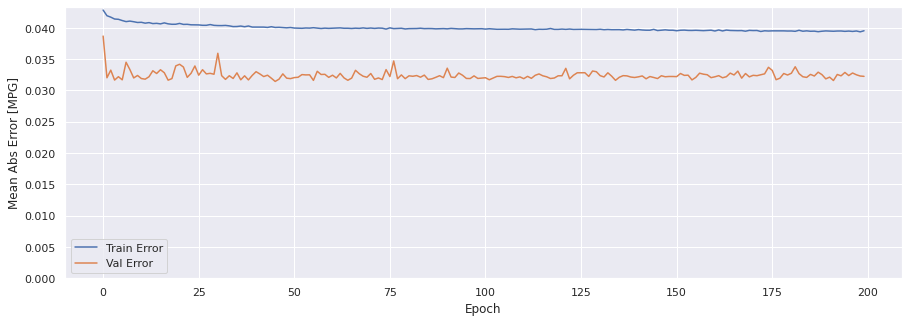

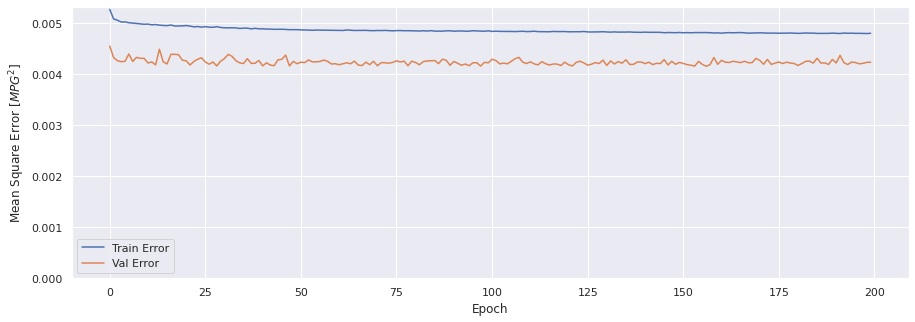

In [102]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history6)

### Evaluar predicciones

In [103]:
score_train6 = model6.evaluate(scaled_trainX_4D, data_trainY_3D, verbose=1)
print(f'Loss:{score_train6[0]}')
print(f'MAE:{score_train6[1]}')
print(f'MSE:{score_train6[2]}')
print(f'SMAPE:{score_train6[3]}')

1413/1413 [==============================] - 8s 6ms/step - loss: 0.0048 - mae: 0.0390 - mse: 0.0048 - smape: 0.7100
Loss:0.004777223337441683
MAE:0.03899526223540306
MSE:0.004777223337441683
SMAPE:0.7099527716636658


In [104]:
score_val6 = model6.evaluate(scaled_valX_4D, data_valY_3D, verbose=1)
print(f'Loss:{score_val6[0]}')
print(f'MAE:{score_val6[1]}')
print(f'MSE:{score_val6[2]}')
print(f'SMAPE:{score_val6[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0042 - mae: 0.0323 - mse: 0.0042 - smape: 0.6351
Loss:0.00423408392816782
MAE:0.032253701239824295
MSE:0.00423408392816782
SMAPE:0.6350760459899902


In [105]:
score_test6 = model6.evaluate(scaled_testX_4D, data_testY_3D, verbose=1)
print(f'Loss:{score_test6[0]}')
print(f'MAE:{score_test6[1]}')
print(f'MSE:{score_test6[2]}')
print(f'SMAPE:{score_test6[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0048 - mae: 0.0380 - mse: 0.0048 - smape: 0.6787
Loss:0.004801172763109207
MAE:0.038045626133680344
MSE:0.004801172763109207
SMAPE:0.6787090301513672


### Comparativa de resultados

In [106]:
result = hist6.iloc[-1]
comparativa6 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test6[1], score_test6[2], score_test6[3], math.sqrt(score_test6[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa6.style.set_caption("Método de ventana de un paso - Convolucional 1D con LSTM")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.039536,0.004802,0.717548,0.069296
VALIDACION,0.032254,0.004234,0.635917,0.065070
TEST,0.038046,0.004801,0.678709,0.069290


### Obtener predicciones

In [107]:
trainPredict6 = model6.predict(scaled_trainX_4D)
testPredict6 = model6.predict(scaled_testX_4D)

### Visualización de las predicciones

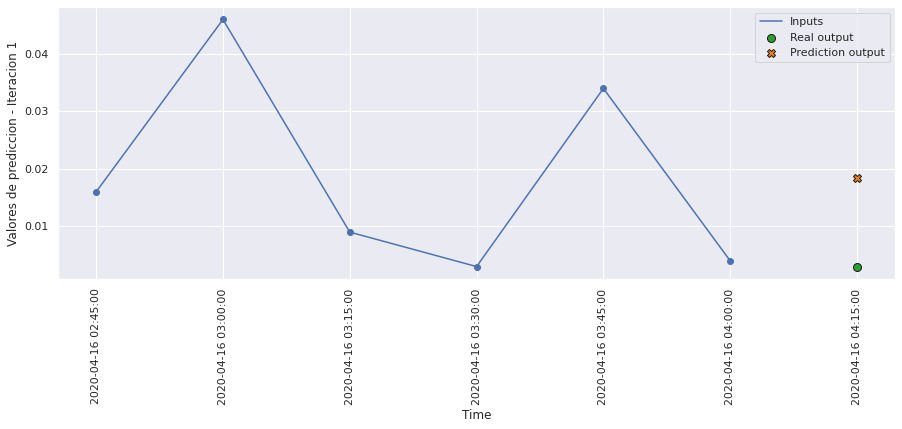

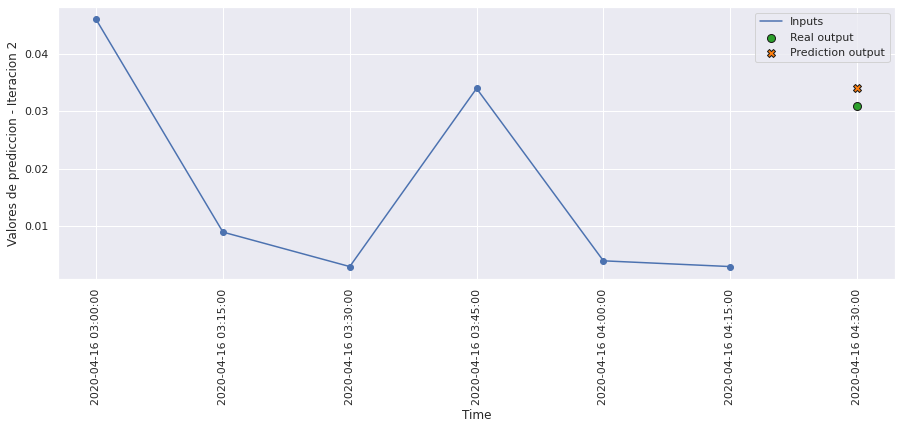

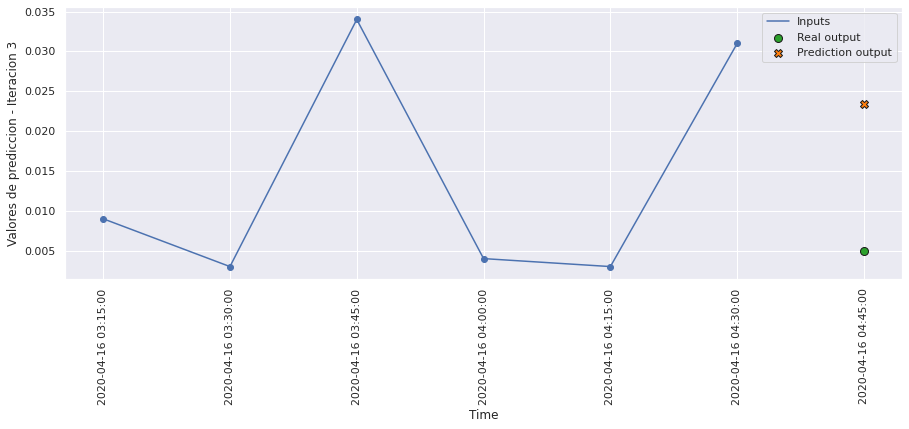

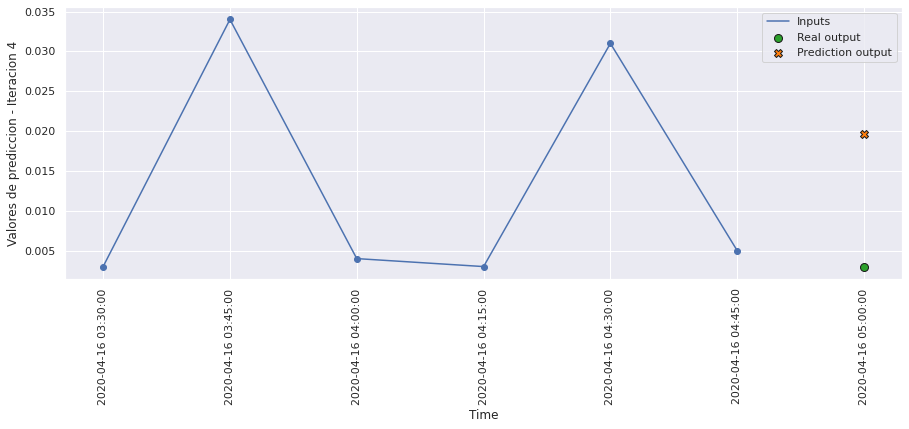

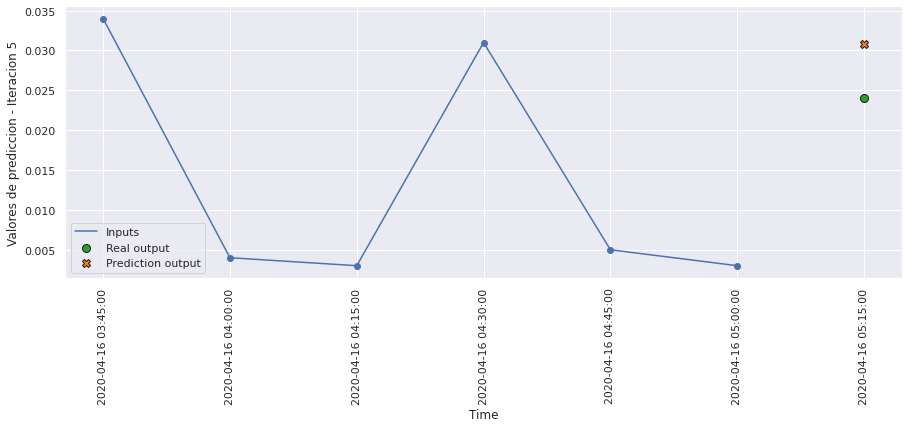

...

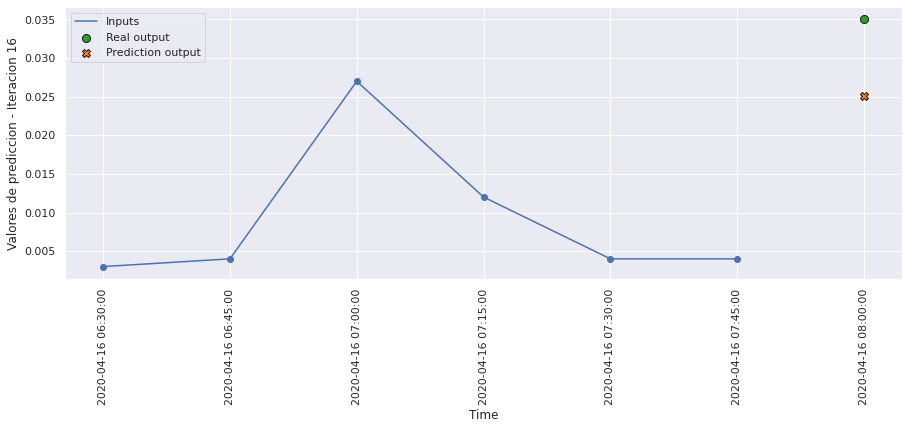

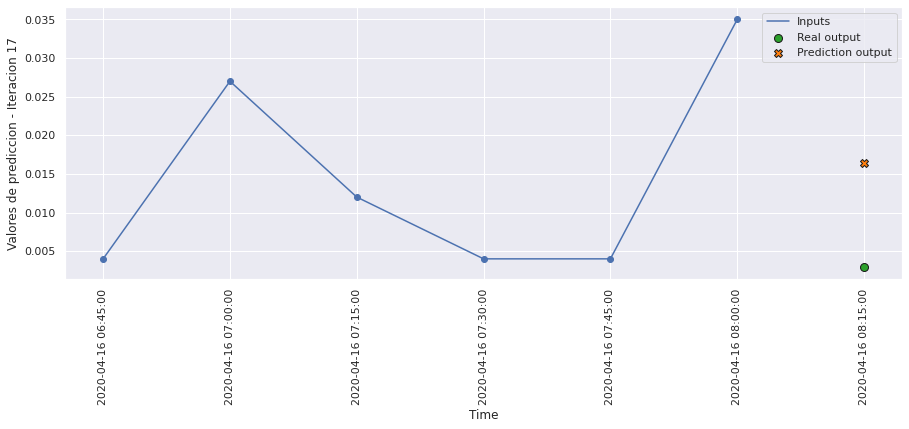

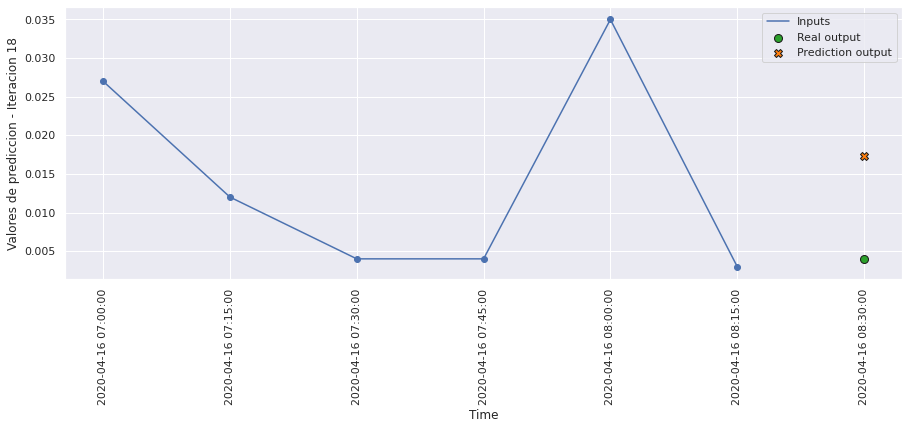

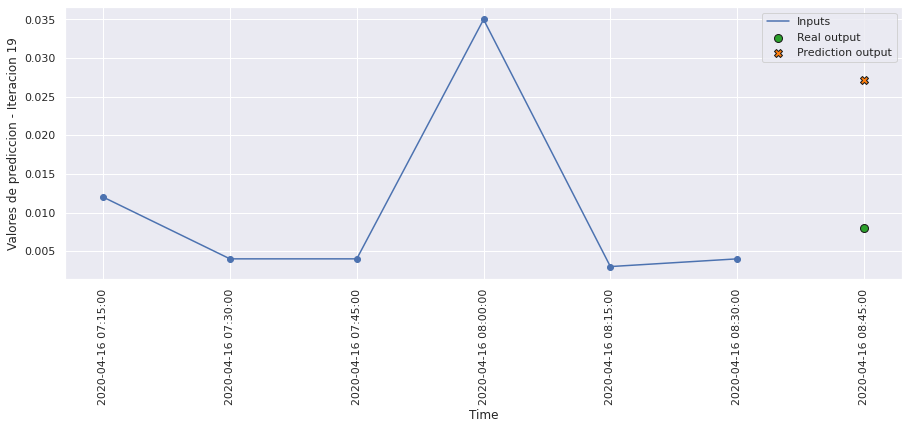

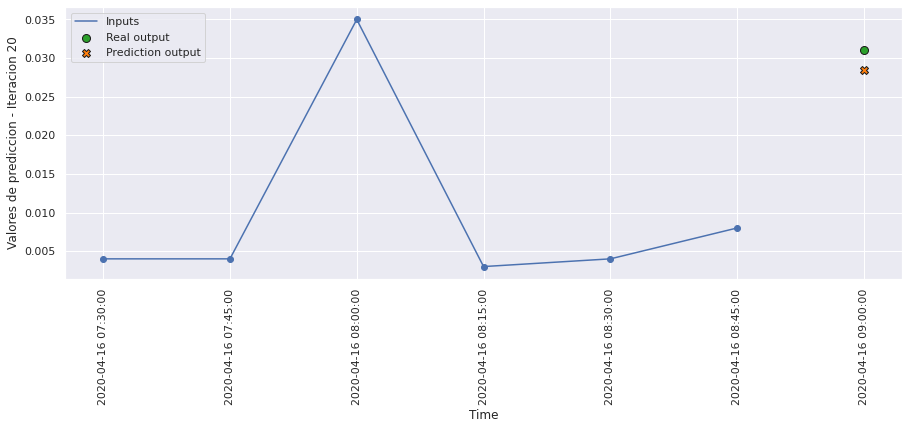

In [108]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, 
                        testPredict6.reshape(testPredict6.shape[0],n_predicciones), 20, 0)

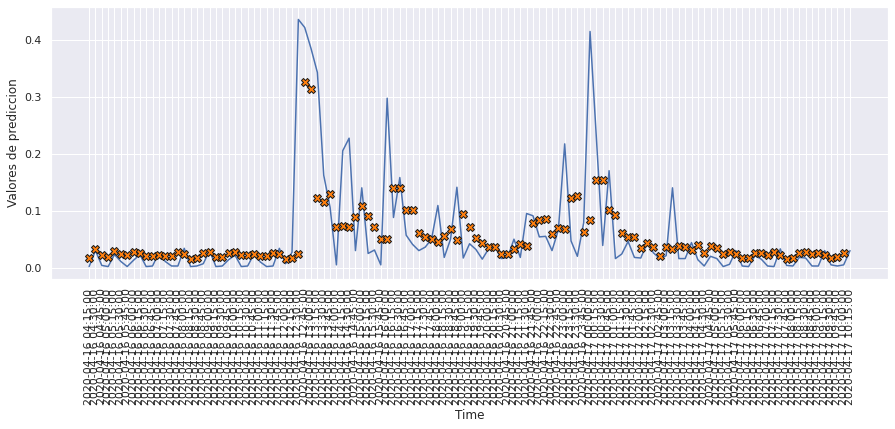

In [109]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict6.reshape(testPredict6.shape[0],n_predicciones), 120)

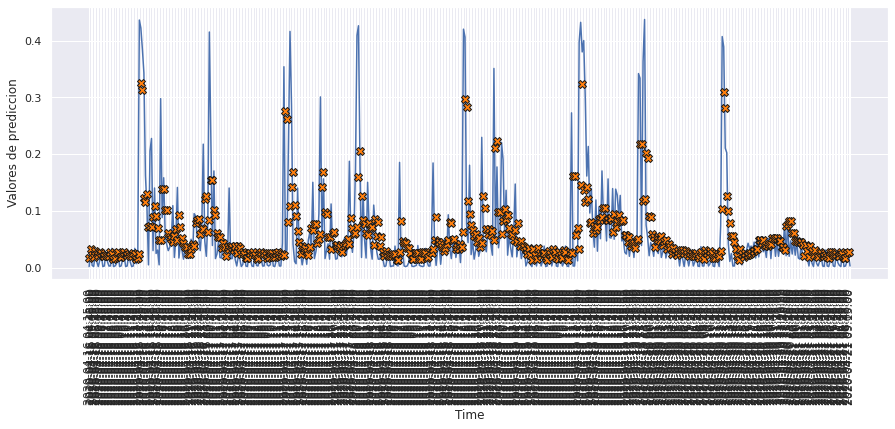

In [110]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict6.reshape(testPredict6.shape[0],n_predicciones), 500)

# MODELO 7: CONVLSTM1D

### Construimos el modelo

In [111]:
def build_model7():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(None, n_entrada, n_features)),
        tf.keras.layers.ConvLSTM1D(filters=64, kernel_size=1, activation='tanh'),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(n_predicciones),
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [112]:
model7 = build_model7()
model7.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm1d (ConvLSTM1D)    (None, 6, 64)             16896     
                                                                 
 flatten_2 (Flatten)         (None, 384)               0         
                                                                 
 dense_6 (Dense)             (None, 1)                 385       
                                                                 
Total params: 17,281
Trainable params: 17,281
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [113]:
history7 = model7.fit(scaled_trainX_4D, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX_4D, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 10s 22ms/step - loss: 0.0052 - mae: 0.0421 - mse: 0.0052 - smape: 0.7747 - val_loss: 0.0041 - val_mae: 0.0326 - val_mse: 0.0041 - val_smape: 0.6445
Epoch 2/200
354/354 [==============================] - 7s 21ms/step - loss: 0.0048 - mae: 0.0400 - mse: 0.0048 - smape: 0.7395 - val_loss: 0.0042 - val_mae: 0.0340 - val_mse: 0.0042 - val_smape: 0.6732
Epoch 3/200
354/354 [==============================] - 7s 21ms/step - loss: 0.0047 - mae: 0.0400 - mse: 0.0047 - smape: 0.7392 - val_loss: 0.0041 - val_mae: 0.0334 - val_mse: 0.0041 - val_smape: 0.6620
Epoch 4/200
354/354 [==============================] - 7s 21ms/step - loss: 0.0047 - mae: 0.0399 - mse: 0.0047 - smape: 0.7386 - val_loss: 0.0042 - val_mae: 0.0359 - val_mse: 0.0042 - val_smape: 0.7063
Epoch 5/200
354/354 [==============================] - 7s 21ms/step - loss: 0.0047 - mae: 0.0399 - mse: 0.0047 - smape: 0.7385 - val_loss: 0.0041 - val_mae: 0.0317 - val_mse: 0.0041 - val_sma

354/354 [==============================] - 8s 21ms/step - loss: 0.0046 - mae: 0.0393 - mse: 0.0046 - smape: 0.7334 - val_loss: 0.0040 - val_mae: 0.0326 - val_mse: 0.0040 - val_smape: 0.6564
Epoch 82/200
354/354 [==============================] - 7s 21ms/step - loss: 0.0046 - mae: 0.0391 - mse: 0.0046 - smape: 0.7310 - val_loss: 0.0041 - val_mae: 0.0362 - val_mse: 0.0041 - val_smape: 0.7224
Epoch 83/200
354/354 [==============================] - 7s 21ms/step - loss: 0.0046 - mae: 0.0392 - mse: 0.0046 - smape: 0.7318 - val_loss: 0.0040 - val_mae: 0.0340 - val_mse: 0.0040 - val_smape: 0.6828
Epoch 84/200
354/354 [==============================] - 8s 22ms/step - loss: 0.0046 - mae: 0.0392 - mse: 0.0046 - smape: 0.7325 - val_loss: 0.0040 - val_mae: 0.0328 - val_mse: 0.0040 - val_smape: 0.6580
Epoch 85/200
354/354 [==============================] - 8s 22ms/step - loss: 0.0046 - mae: 0.0391 - mse: 0.0046 - smape: 0.7320 - val_loss: 0.0041 - val_mae: 0.0325 - val_mse: 0.0041 - val_smape: 0.650

354/354 [==============================] - 7s 21ms/step - loss: 0.0046 - mae: 0.0389 - mse: 0.0046 - smape: 0.7256 - val_loss: 0.0041 - val_mae: 0.0325 - val_mse: 0.0041 - val_smape: 0.6532
Epoch 162/200
354/354 [==============================] - 7s 21ms/step - loss: 0.0046 - mae: 0.0389 - mse: 0.0046 - smape: 0.7253 - val_loss: 0.0040 - val_mae: 0.0326 - val_mse: 0.0040 - val_smape: 0.6550
Epoch 163/200
354/354 [==============================] - 7s 21ms/step - loss: 0.0046 - mae: 0.0389 - mse: 0.0046 - smape: 0.7257 - val_loss: 0.0040 - val_mae: 0.0336 - val_mse: 0.0040 - val_smape: 0.6760
Epoch 164/200
354/354 [==============================] - 7s 21ms/step - loss: 0.0046 - mae: 0.0388 - mse: 0.0046 - smape: 0.7249 - val_loss: 0.0041 - val_mae: 0.0339 - val_mse: 0.0041 - val_smape: 0.6819
Epoch 165/200
354/354 [==============================] - 7s 21ms/step - loss: 0.0046 - mae: 0.0389 - mse: 0.0046 - smape: 0.7258 - val_loss: 0.0041 - val_mae: 0.0342 - val_mse: 0.0041 - val_smape: 0

In [114]:
hist7 = pd.DataFrame(history7.history)
hist7['epoch'] = history7.epoch
hist7

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.005238,0.042118,0.005238,0.774694,0.004138,0.032610,0.004138,0.644526,0
1,0.004751,0.040017,0.004751,0.739460,0.004160,0.034011,0.004160,0.673244,1
2,0.004750,0.039995,0.004750,0.739155,0.004139,0.033393,0.004139,0.661995,2
3,0.004746,0.039950,0.004746,0.738641,0.004155,0.035902,0.004155,0.706322,3
4,0.004737,0.039935,0.004737,0.738496,0.004101,0.031675,0.004101,0.626288,4
...,...,...,...,...,...,...,...,...,...
181,0.004597,0.038851,0.004597,0.725949,0.004052,0.034585,0.004052,0.693306,181
182,0.004600,0.038852,0.004600,0.724546,0.004071,0.032901,0.004071,0.661007,182
183,0.004599,0.038829,0.004599,0.725615,0.004079,0.036964,0.004079,0.738860,183
184,0.004600,0.038839,0.004600,0.725060,0.004036,0.035196,0.004036,0.707053,184


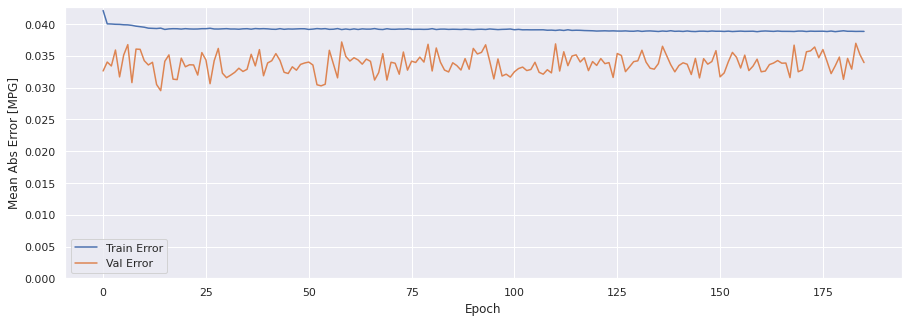

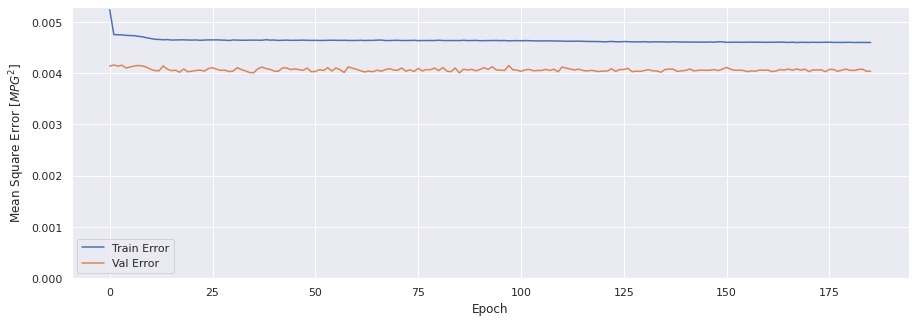

In [115]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history7)

### Evaluar predicciones

In [116]:
score_train7 = model7.evaluate(scaled_trainX_4D, data_trainY, verbose=1)
print(f'Loss:{score_train7[0]}')
print(f'MAE:{score_train7[1]}')
print(f'MSE:{score_train7[2]}')
print(f'SMAPE:{score_train7[3]}')

1413/1413 [==============================] - 9s 6ms/step - loss: 0.0046 - mae: 0.0386 - mse: 0.0046 - smape: 0.7210
Loss:0.004589364863932133
MAE:0.03857491537928581
MSE:0.004589364863932133
SMAPE:0.7209798097610474


In [117]:
score_val7 = model7.evaluate(scaled_valX_4D, data_valY, verbose=1)
print(f'Loss:{score_val7[0]}')
print(f'MAE:{score_val7[1]}')
print(f'MSE:{score_val7[2]}')
print(f'SMAPE:{score_val7[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0040 - mae: 0.0339 - mse: 0.0040 - smape: 0.6826
Loss:0.004038634710013866
MAE:0.033927708864212036
MSE:0.004038634710013866
SMAPE:0.6825559735298157


In [118]:
score_test7 = model7.evaluate(scaled_testX_4D, data_testY, verbose=1)
print(f'Loss:{score_test7[0]}')
print(f'MAE:{score_test7[1]}')
print(f'MSE:{score_test7[2]}')
print(f'SMAPE:{score_test7[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0047 - mae: 0.0391 - mse: 0.0047 - smape: 0.7118
Loss:0.0046514105051755905
MAE:0.03913760185241699
MSE:0.0046514105051755905
SMAPE:0.7117700576782227


### Comparativa de resultados

In [119]:
result = hist7.iloc[-1]
comparativa7 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test7[1], score_test7[2], score_test7[3], math.sqrt(score_test7[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa7.style.set_caption("Método de ventana de un paso - CONVLSTM 1D")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.038831,0.004599,0.724093,0.067815
VALIDACION,0.033928,0.004039,0.683423,0.063550
TEST,0.039138,0.004651,0.711770,0.068201


### Obtener predicciones

In [120]:
trainPredict7 = model7.predict(scaled_trainX_4D)
testPredict7 = model7.predict(scaled_testX_4D)

### Visualización de las predicciones

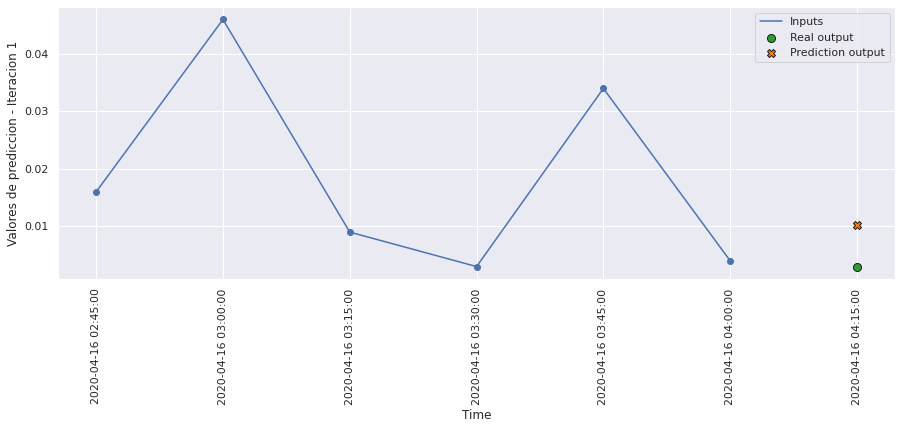

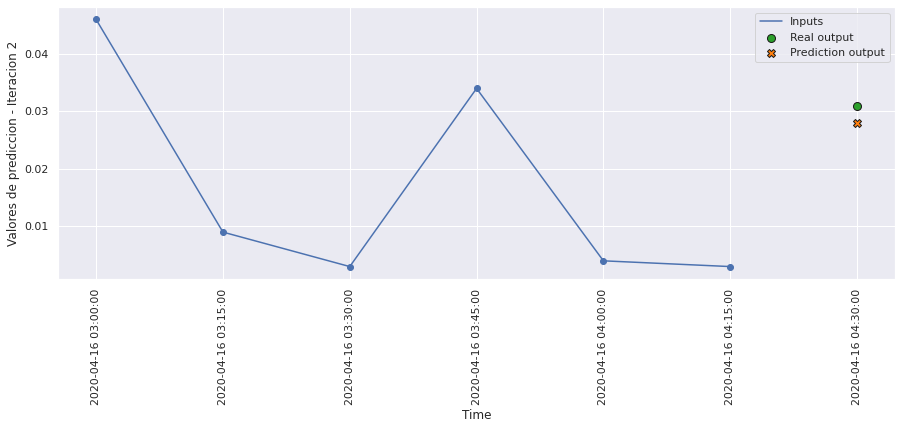

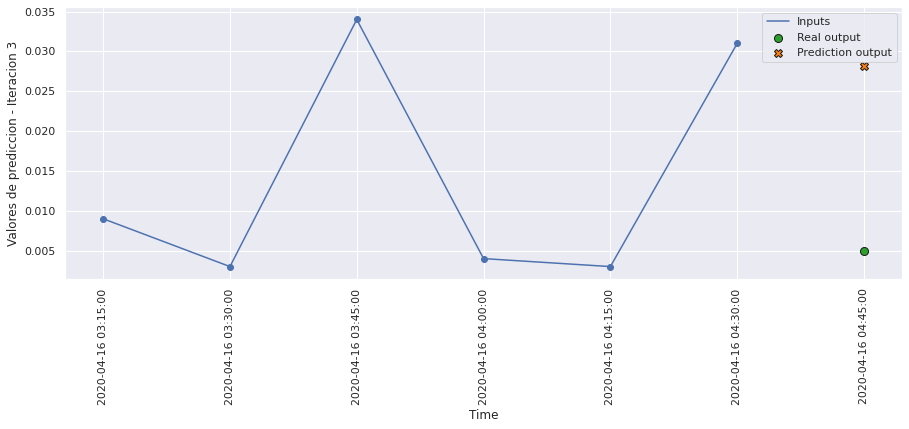

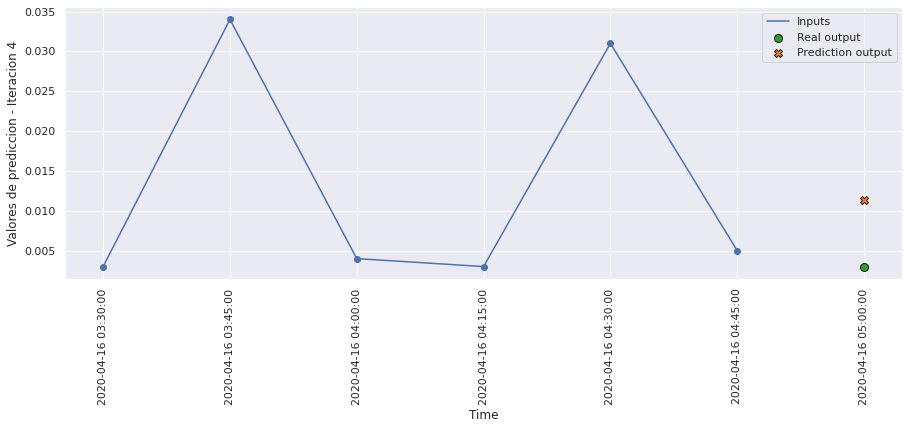

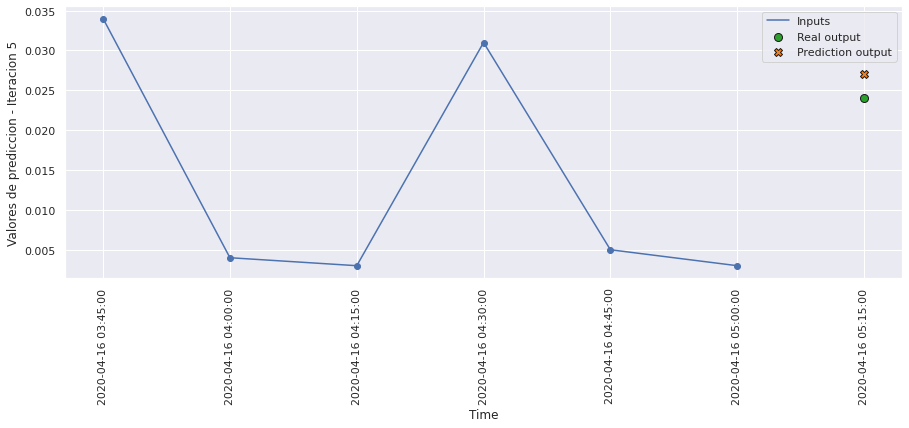

...

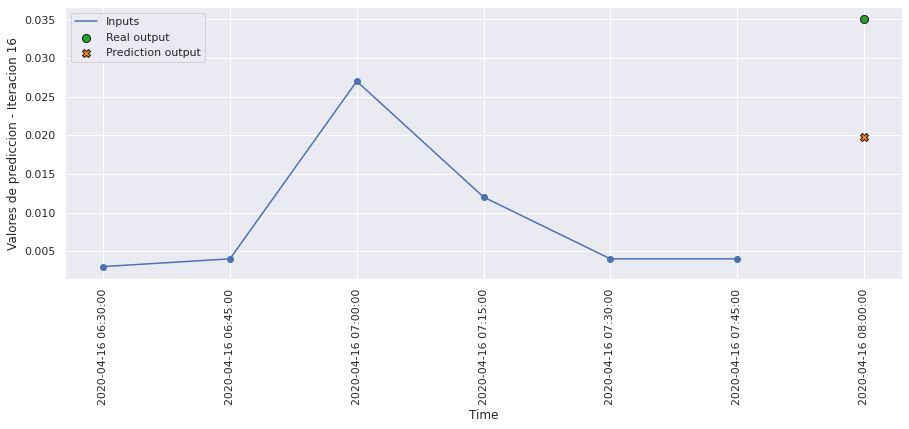

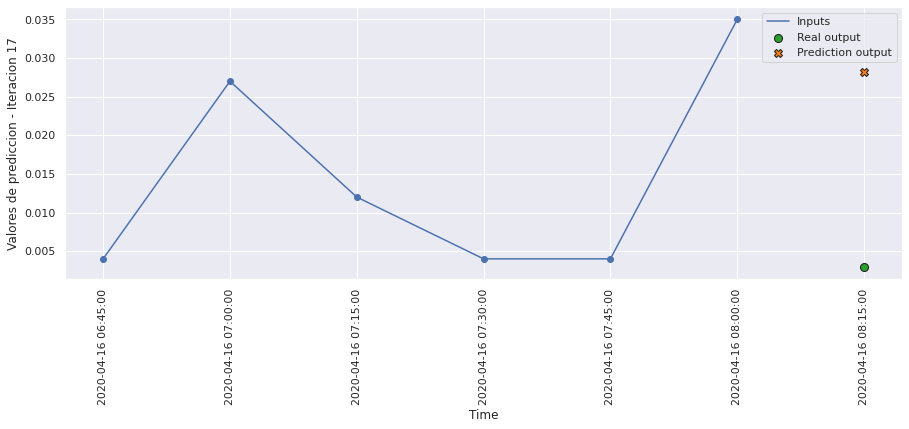

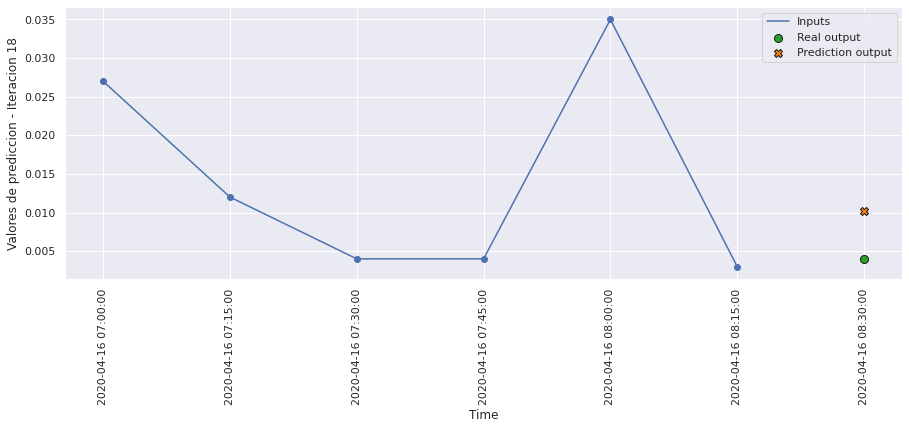

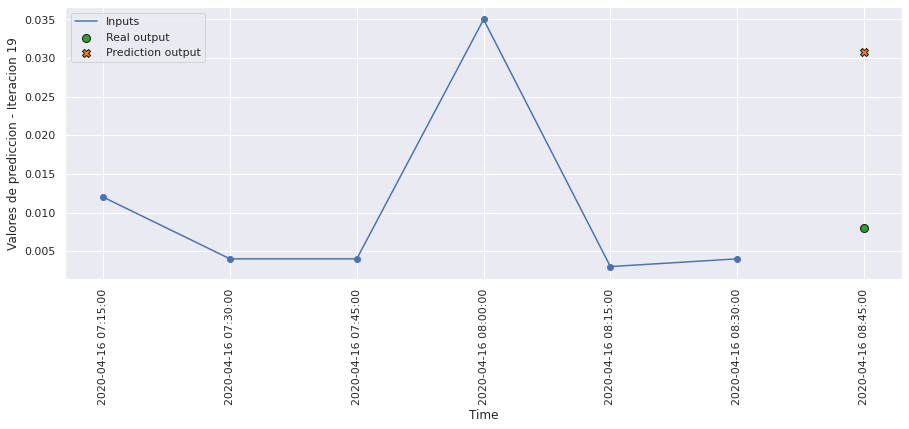

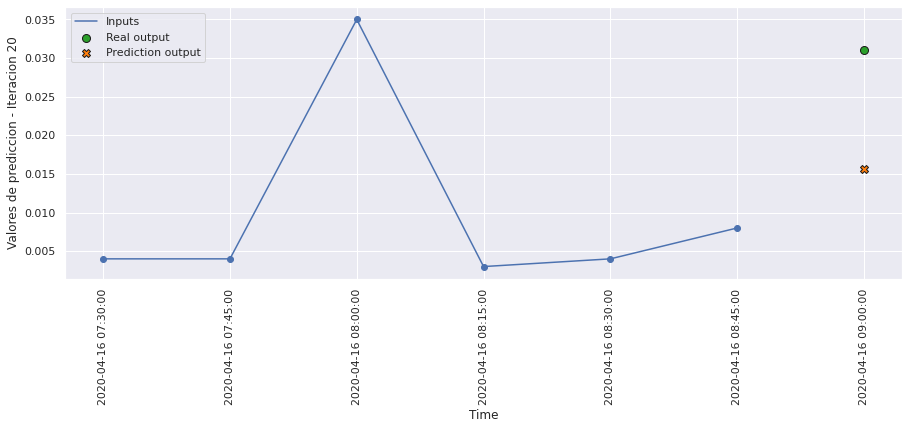

In [121]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict7, 20, 0)

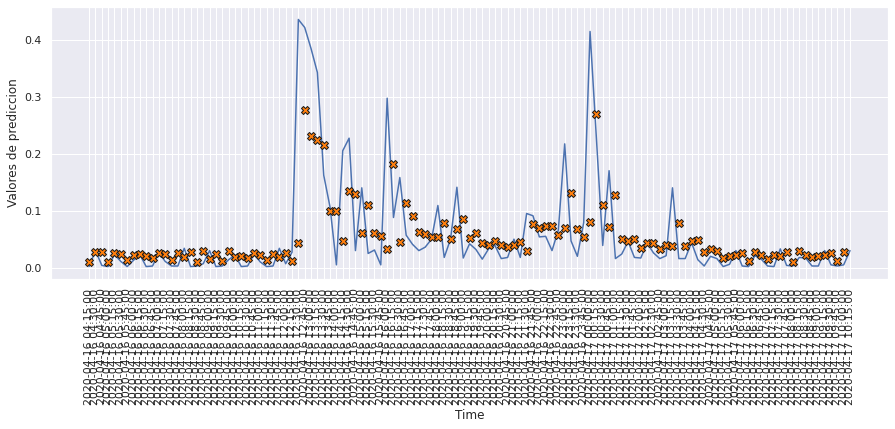

In [122]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict7, 120)

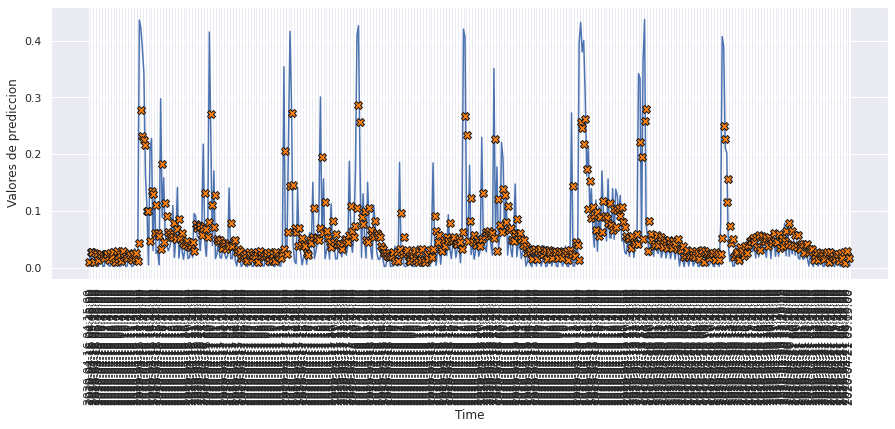

In [123]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict7, 500)

# MODELO 8: CONVLSTM2D

### Construimos el modelo

In [124]:
def build_model8():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(1, 1, n_entrada, n_features)),
        tf.keras.layers.ConvLSTM2D(filters=64, kernel_size=(1,1), activation='relu'),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(n_predicciones),
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [125]:
model8 = build_model8()
model8.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 1, 6, 64)          16896     
                                                                 
 flatten_3 (Flatten)         (None, 384)               0         
                                                                 
 dense_7 (Dense)             (None, 1)                 385       
                                                                 
Total params: 17,281
Trainable params: 17,281
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [126]:
history8 = model8.fit(scaled_trainX_5D, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX_5D, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 9s 21ms/step - loss: 0.0056 - mae: 0.0435 - mse: 0.0056 - smape: 0.7990 - val_loss: 0.0043 - val_mae: 0.0342 - val_mse: 0.0043 - val_smape: 0.6737
Epoch 2/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0048 - mae: 0.0400 - mse: 0.0048 - smape: 0.7407 - val_loss: 0.0041 - val_mae: 0.0331 - val_mse: 0.0041 - val_smape: 0.6557
Epoch 3/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0047 - mae: 0.0397 - mse: 0.0047 - smape: 0.7364 - val_loss: 0.0041 - val_mae: 0.0339 - val_mse: 0.0041 - val_smape: 0.6755
Epoch 4/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0047 - mae: 0.0396 - mse: 0.0047 - smape: 0.7364 - val_loss: 0.0041 - val_mae: 0.0352 - val_mse: 0.0041 - val_smape: 0.6988
Epoch 5/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0047 - mae: 0.0394 - mse: 0.0047 - smape: 0.7339 - val_loss: 0.0041 - val_mae: 0.0340 - val_mse: 0.0041 - val_smap

354/354 [==============================] - 7s 20ms/step - loss: 0.0046 - mae: 0.0388 - mse: 0.0046 - smape: 0.7250 - val_loss: 0.0040 - val_mae: 0.0331 - val_mse: 0.0040 - val_smape: 0.6687
Epoch 82/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0046 - mae: 0.0389 - mse: 0.0046 - smape: 0.7257 - val_loss: 0.0041 - val_mae: 0.0323 - val_mse: 0.0041 - val_smape: 0.6495
Epoch 83/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0046 - mae: 0.0389 - mse: 0.0046 - smape: 0.7258 - val_loss: 0.0041 - val_mae: 0.0317 - val_mse: 0.0041 - val_smape: 0.6370
Epoch 84/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0046 - mae: 0.0388 - mse: 0.0046 - smape: 0.7257 - val_loss: 0.0040 - val_mae: 0.0345 - val_mse: 0.0040 - val_smape: 0.6914
Epoch 85/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0046 - mae: 0.0388 - mse: 0.0046 - smape: 0.7238 - val_loss: 0.0041 - val_mae: 0.0347 - val_mse: 0.0041 - val_smape: 0.698

354/354 [==============================] - 7s 20ms/step - loss: 0.0046 - mae: 0.0387 - mse: 0.0046 - smape: 0.7233 - val_loss: 0.0040 - val_mae: 0.0340 - val_mse: 0.0040 - val_smape: 0.6819
Epoch 162/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0046 - mae: 0.0387 - mse: 0.0046 - smape: 0.7217 - val_loss: 0.0040 - val_mae: 0.0362 - val_mse: 0.0040 - val_smape: 0.7247
Epoch 163/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0046 - mae: 0.0388 - mse: 0.0046 - smape: 0.7243 - val_loss: 0.0040 - val_mae: 0.0327 - val_mse: 0.0040 - val_smape: 0.6584
Epoch 164/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0046 - mae: 0.0387 - mse: 0.0046 - smape: 0.7228 - val_loss: 0.0041 - val_mae: 0.0307 - val_mse: 0.0041 - val_smape: 0.6127
Epoch 165/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0046 - mae: 0.0387 - mse: 0.0046 - smape: 0.7230 - val_loss: 0.0040 - val_mae: 0.0344 - val_mse: 0.0040 - val_smape: 0

In [127]:
hist8 = pd.DataFrame(history8.history)
hist8['epoch'] = history8.epoch
hist8

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.005575,0.043503,0.005575,0.799007,0.004253,0.034188,0.004253,0.673707,0
1,0.004751,0.040012,0.004751,0.740713,0.004128,0.033120,0.004128,0.655657,1
2,0.004717,0.039690,0.004717,0.736361,0.004084,0.033947,0.004084,0.675533,2
3,0.004692,0.039595,0.004692,0.736354,0.004091,0.035203,0.004091,0.698836,3
4,0.004671,0.039419,0.004671,0.733944,0.004076,0.034025,0.004076,0.678995,4
...,...,...,...,...,...,...,...,...,...
195,0.004576,0.038670,0.004576,0.723199,0.004092,0.032398,0.004092,0.650442,195
196,0.004572,0.038683,0.004572,0.722603,0.004014,0.031319,0.004014,0.625217,196
197,0.004580,0.038704,0.004580,0.722361,0.004053,0.032487,0.004053,0.656240,197
198,0.004582,0.038677,0.004582,0.722578,0.004043,0.034735,0.004043,0.695502,198


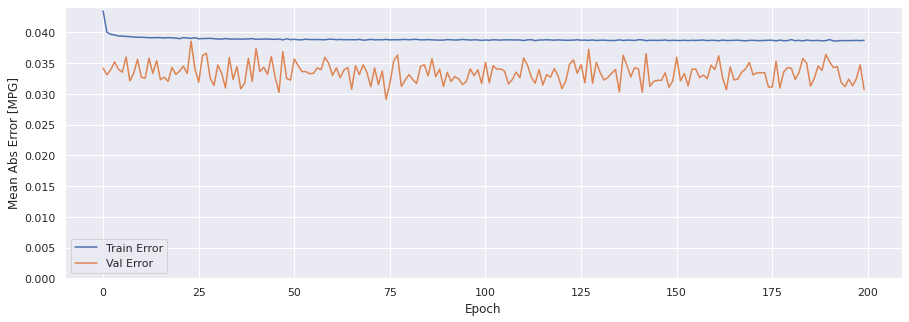

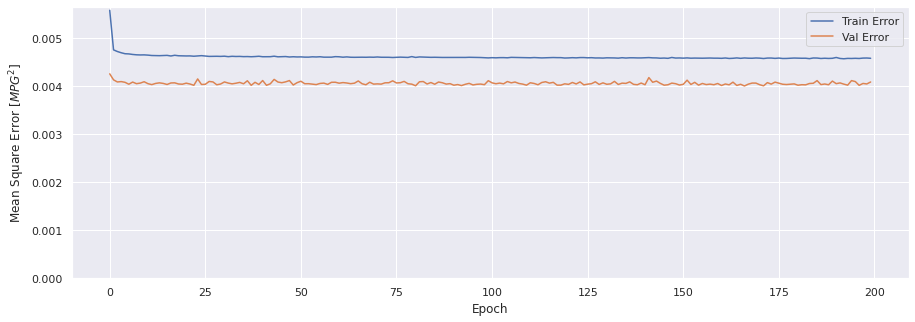

In [128]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history8)

### Evaluar predicciones

In [129]:
score_train8 = model8.evaluate(scaled_trainX_5D, data_trainY, verbose=1)
print(f'Loss:{score_train8[0]}')
print(f'MAE:{score_train8[1]}')
print(f'MSE:{score_train8[2]}')
print(f'SMAPE:{score_train8[3]}')

1413/1413 [==============================] - 8s 6ms/step - loss: 0.0046 - mae: 0.0369 - mse: 0.0046 - smape: 0.6988
Loss:0.004601273685693741
MAE:0.036930184811353683
MSE:0.004601273685693741
SMAPE:0.6988207697868347


In [130]:
score_val8 = model8.evaluate(scaled_valX_5D, data_valY, verbose=1)
print(f'Loss:{score_val8[0]}')
print(f'MAE:{score_val8[1]}')
print(f'MSE:{score_val8[2]}')
print(f'SMAPE:{score_val8[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0041 - mae: 0.0307 - mse: 0.0041 - smape: 0.6196
Loss:0.00408336753025651
MAE:0.030733920633792877
MSE:0.00408336753025651
SMAPE:0.61955326795578


In [131]:
score_test8 = model8.evaluate(scaled_testX_5D, data_testY, verbose=1)
print(f'Loss:{score_test8[0]}')
print(f'MAE:{score_test8[1]}')
print(f'MSE:{score_test8[2]}')
print(f'SMAPE:{score_test8[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0047 - mae: 0.0360 - mse: 0.0047 - smape: 0.6531
Loss:0.004677848424762487
MAE:0.036049094051122665
MSE:0.004677848424762487
SMAPE:0.6530859470367432


### Comparativa de resultados

In [132]:
result = hist8.iloc[-1]
comparativa8 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test8[1], score_test8[2], score_test8[3], math.sqrt(score_test8[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa8.style.set_caption("Método de ventana de un paso - CONVLSTM 2D")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.038713,0.004576,0.722887,0.067649
VALIDACION,0.030734,0.004083,0.620499,0.063901
TEST,0.036049,0.004678,0.653086,0.068395


### Obtener predicciones

In [133]:
trainPredict8 = model8.predict(scaled_trainX_5D)
testPredict8 = model8.predict(scaled_testX_5D)

### Visualización de las predicciones

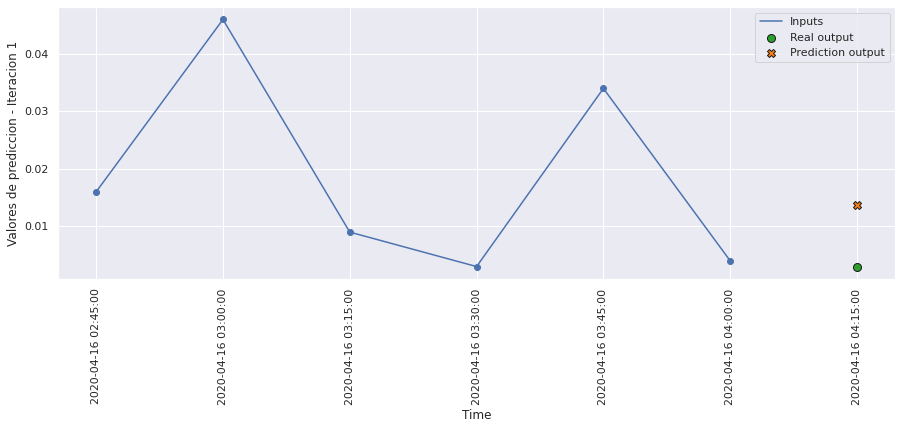

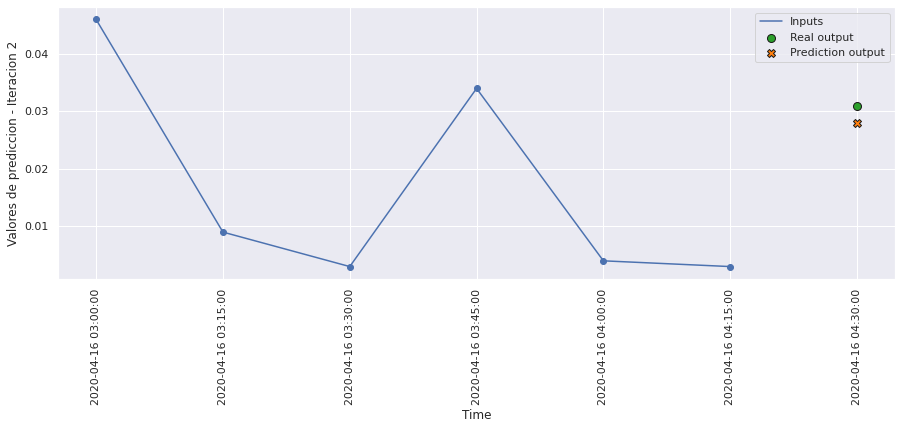

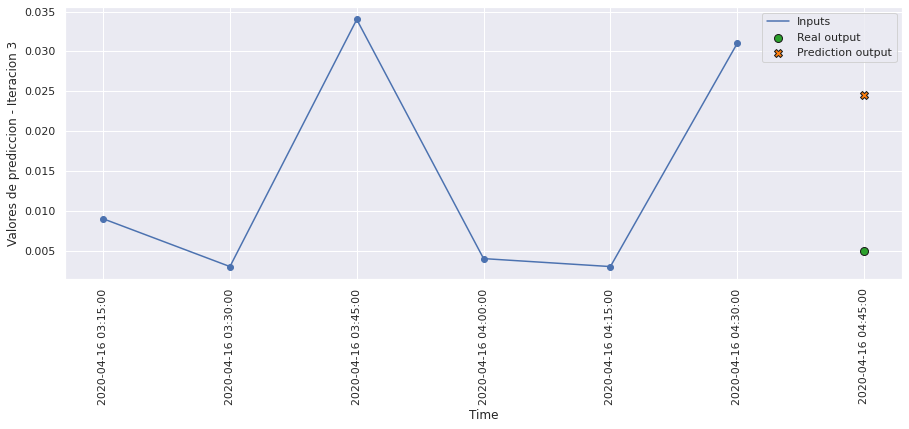

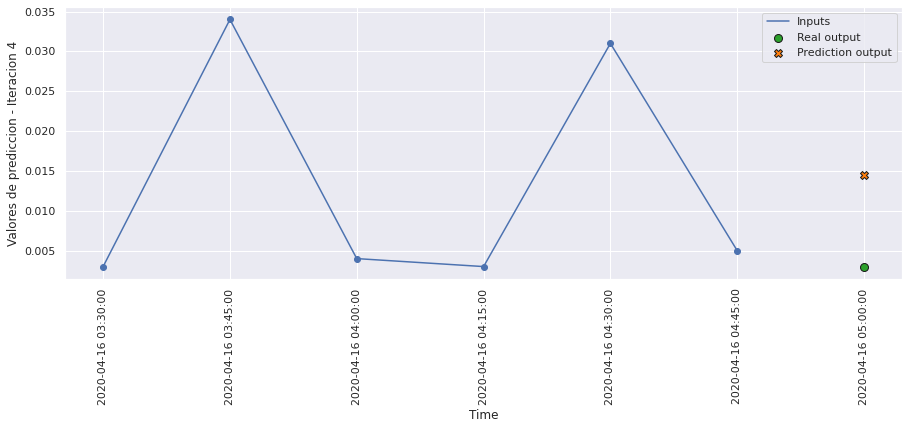

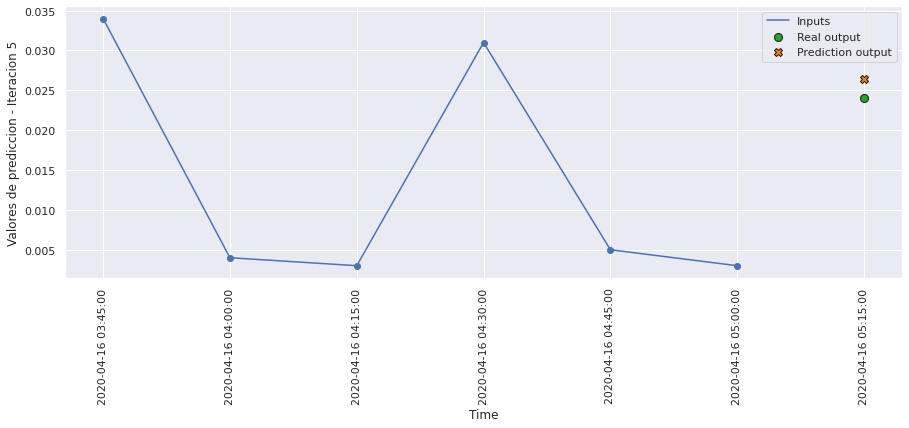

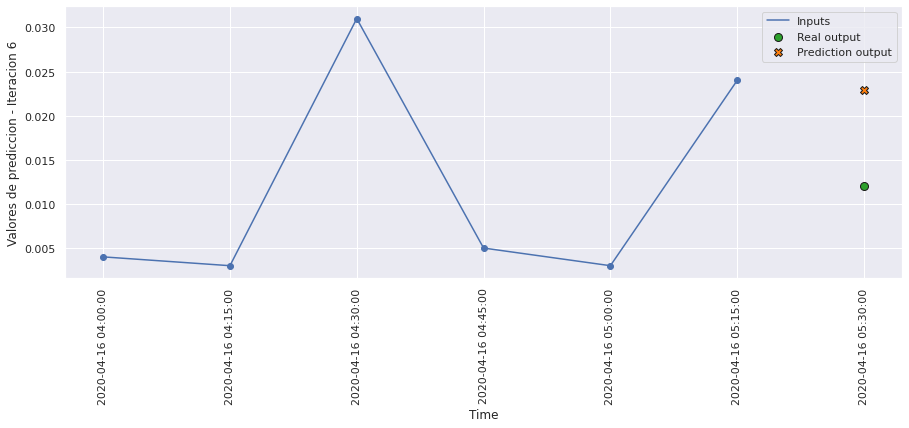

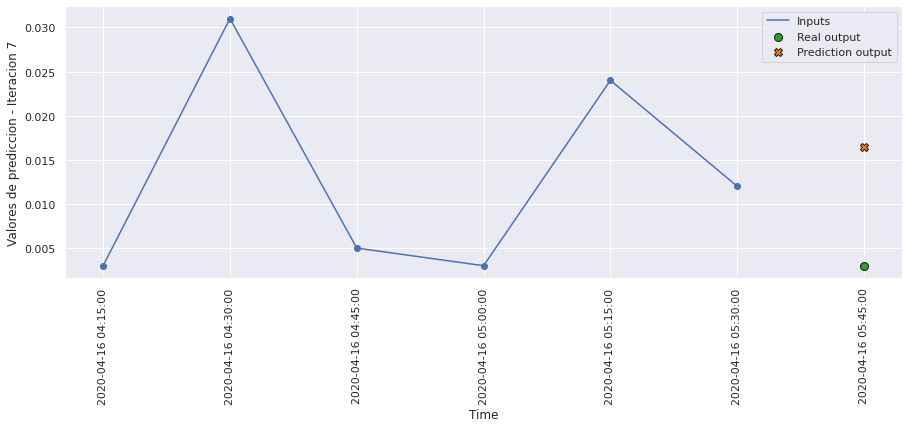

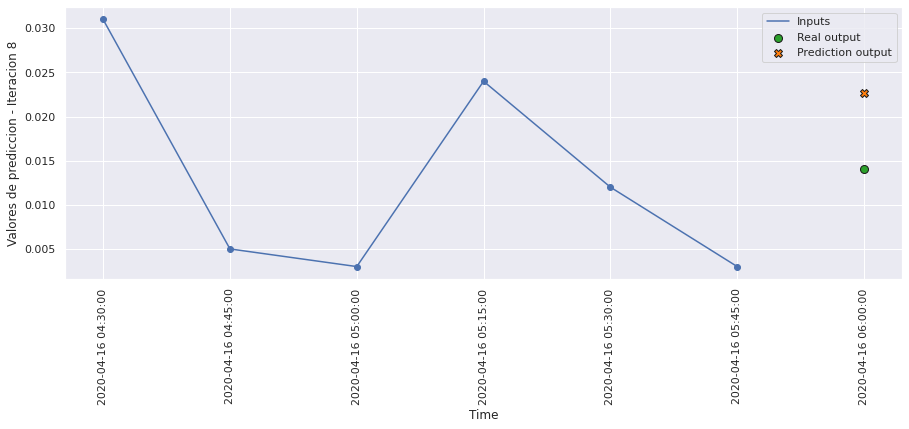

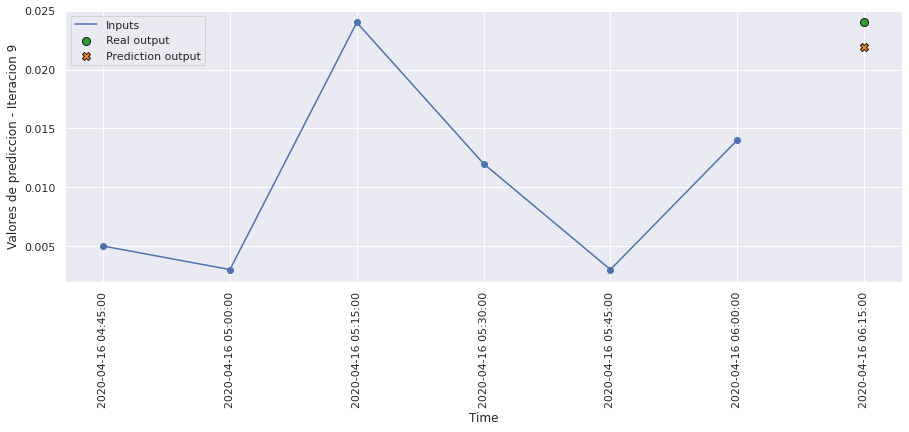

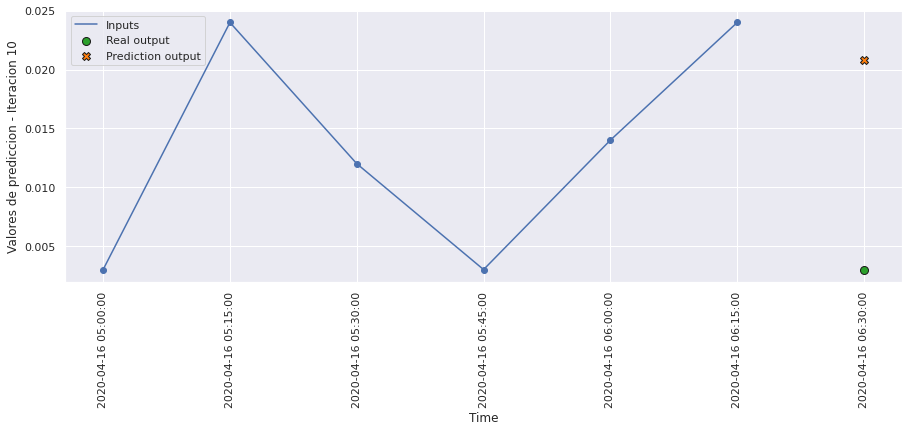

In [134]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict8, 10, 0)

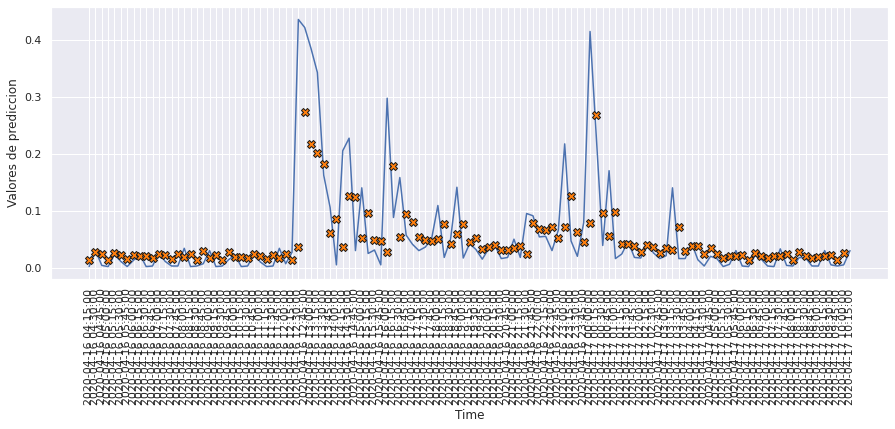

In [135]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict8, 120)

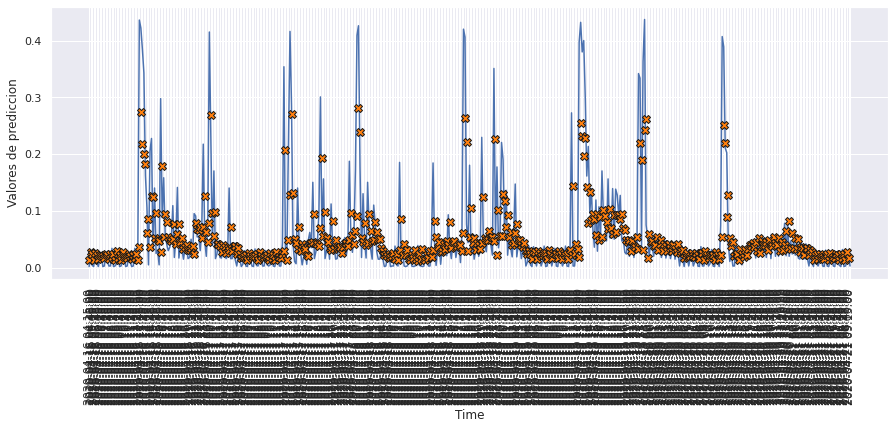

In [136]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict8, 500)

# MODELO 9: LSTM ENCODE DECODE

### Construimos el modelo

In [137]:
def build_model9():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.RepeatVector(n_predicciones),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(100)),
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(1))
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [138]:
model9 = build_model9()
model9.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 128)               66560     
                                                                 
 repeat_vector (RepeatVector  (None, 1, 128)           0         
 )                                                               
                                                                 
 lstm_9 (LSTM)               (None, 1, 128)            131584    
                                                                 
 time_distributed_6 (TimeDis  (None, 1, 100)           12900     
 tributed)                                                       
                                                                 
 time_distributed_7 (TimeDis  (None, 1, 1)             101       
 tributed)                                                       
                                                      

### Entrenamiento del modelo

In [139]:
history9 = model9.fit(scaled_trainX, data_trainY_3D_2, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY_3D_2), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 14ms/step - loss: 0.0050 - mae: 0.0414 - mse: 0.0050 - smape: 0.7614 - val_loss: 0.0041 - val_mae: 0.0356 - val_mse: 0.0041 - val_smape: 0.7002
Epoch 2/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0048 - mae: 0.0404 - mse: 0.0048 - smape: 0.7447 - val_loss: 0.0043 - val_mae: 0.0385 - val_mse: 0.0043 - val_smape: 0.7522
Epoch 3/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0048 - mae: 0.0404 - mse: 0.0048 - smape: 0.7461 - val_loss: 0.0041 - val_mae: 0.0323 - val_mse: 0.0041 - val_smape: 0.6417
Epoch 4/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0047 - mae: 0.0401 - mse: 0.0047 - smape: 0.7431 - val_loss: 0.0039 - val_mae: 0.0293 - val_mse: 0.0039 - val_smape: 0.5460
Epoch 5/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0047 - mae: 0.0399 - mse: 0.0047 - smape: 0.7440 - val_loss: 0.0041 - val_mae: 0.0307 - val_mse: 0.0041 - val_smap

354/354 [==============================] - 4s 11ms/step - loss: 0.0045 - mae: 0.0380 - mse: 0.0045 - smape: 0.7118 - val_loss: 0.0038 - val_mae: 0.0281 - val_mse: 0.0038 - val_smape: 0.5707
Epoch 82/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0045 - mae: 0.0379 - mse: 0.0045 - smape: 0.7104 - val_loss: 0.0038 - val_mae: 0.0326 - val_mse: 0.0038 - val_smape: 0.6700
Epoch 83/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0045 - mae: 0.0380 - mse: 0.0045 - smape: 0.7103 - val_loss: 0.0038 - val_mae: 0.0343 - val_mse: 0.0038 - val_smape: 0.6984
Epoch 84/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0045 - mae: 0.0379 - mse: 0.0045 - smape: 0.7103 - val_loss: 0.0038 - val_mae: 0.0345 - val_mse: 0.0038 - val_smape: 0.7035
Epoch 85/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0044 - mae: 0.0380 - mse: 0.0044 - smape: 0.7104 - val_loss: 0.0038 - val_mae: 0.0335 - val_mse: 0.0038 - val_smape: 0.686

In [140]:
hist9 = pd.DataFrame(history9.history)
hist9['epoch'] = history9.epoch
hist9

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.004951,0.041419,0.004951,0.761410,0.004138,0.035608,0.004138,0.700243,0
1,0.004777,0.040355,0.004777,0.744733,0.004319,0.038530,0.004319,0.752214,1
2,0.004773,0.040384,0.004773,0.746050,0.004062,0.032327,0.004062,0.641742,2
3,0.004714,0.040111,0.004714,0.743078,0.003935,0.029284,0.003935,0.546050,3
4,0.004672,0.039926,0.004672,0.744031,0.004061,0.030725,0.004061,0.612200,4
...,...,...,...,...,...,...,...,...,...
150,0.004219,0.036772,0.004219,0.694365,0.003978,0.034044,0.003978,0.690556,150
151,0.004220,0.036805,0.004220,0.694876,0.003904,0.031874,0.003904,0.644812,151
152,0.004201,0.036748,0.004201,0.694739,0.003867,0.032330,0.003867,0.659485,152
153,0.004196,0.036732,0.004196,0.695271,0.003973,0.032956,0.003973,0.669170,153


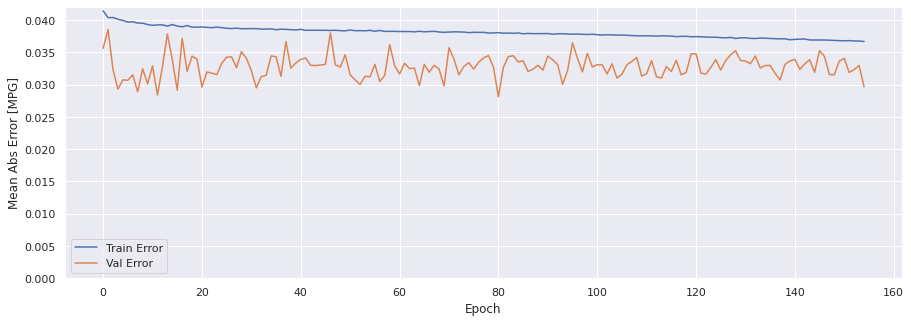

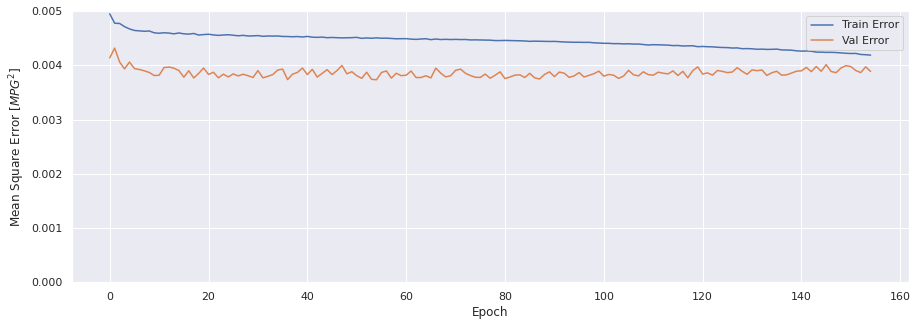

In [141]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history9)

### Evaluar predicciones

In [142]:
score_train9 = model9.evaluate(scaled_trainX, data_trainY_3D_2, verbose=1)
print(f'Loss:{score_train9[0]}')
print(f'MAE:{score_train9[1]}')
print(f'MSE:{score_train9[2]}')
print(f'SMAPE:{score_train9[3]}')

1413/1413 [==============================] - 8s 6ms/step - loss: 0.0042 - mae: 0.0350 - mse: 0.0042 - smape: 0.6547
Loss:0.004150161519646645
MAE:0.034988850355148315
MSE:0.004150161519646645
SMAPE:0.6546564698219299


In [143]:
score_val9 = model9.evaluate(scaled_valX, data_valY_3D_2, verbose=1)
print(f'Loss:{score_val9[0]}')
print(f'MAE:{score_val9[1]}')
print(f'MSE:{score_val9[2]}')
print(f'SMAPE:{score_val9[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0039 - mae: 0.0297 - mse: 0.0039 - smape: 0.5900
Loss:0.0038875723257660866
MAE:0.029663246124982834
MSE:0.0038875723257660866
SMAPE:0.5899792909622192


In [144]:
score_test9 = model9.evaluate(scaled_testX, data_testY_3D_2, verbose=1)
print(f'Loss:{score_test9[0]}')
print(f'MAE:{score_test9[1]}')
print(f'MSE:{score_test9[2]}')
print(f'SMAPE:{score_test9[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0047 - mae: 0.0360 - mse: 0.0047 - smape: 0.6368
Loss:0.004664577078074217
MAE:0.035990241914987564
MSE:0.004664577078074217
SMAPE:0.6367935538291931


### Comparativa de resultados

In [145]:
result = hist9.iloc[-1]
comparativa9 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test9[1], score_test9[2], score_test9[3], math.sqrt(score_test9[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa9.style.set_caption("Método de ventana de un paso - LSTM ENCODE DECODE")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.036670,0.004189,0.694944,0.064722
VALIDACION,0.029663,0.003888,0.590683,0.062350
TEST,0.035990,0.004665,0.636794,0.068298


### Obtener predicciones

In [146]:
trainPredict9 = model9.predict(scaled_trainX)
testPredict9 = model9.predict(scaled_testX)

### Visualización de las predicciones

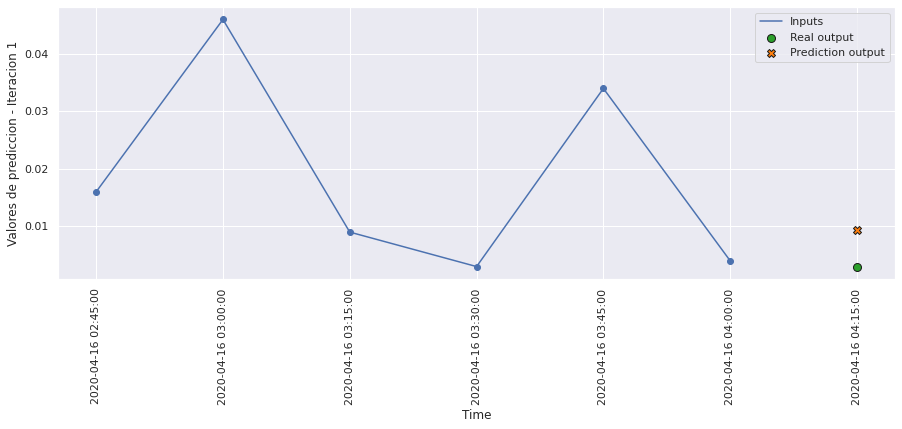

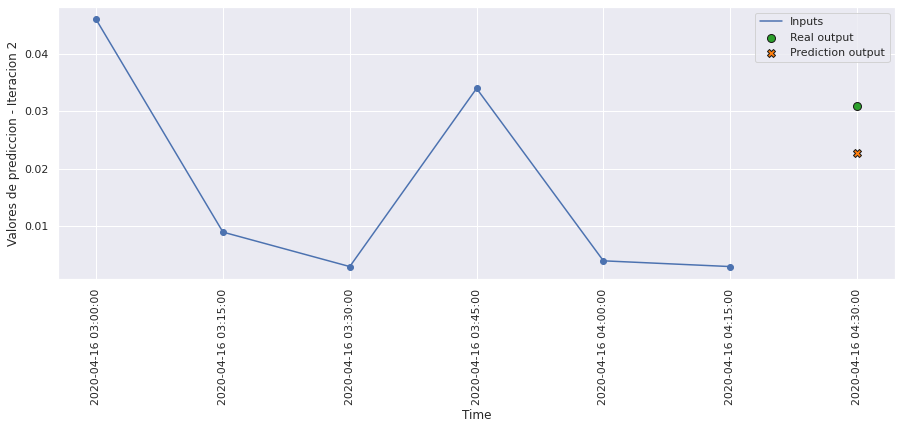

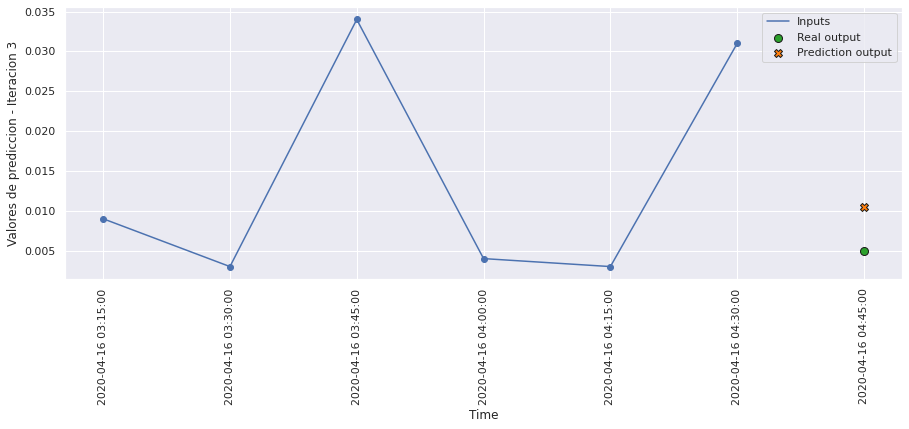

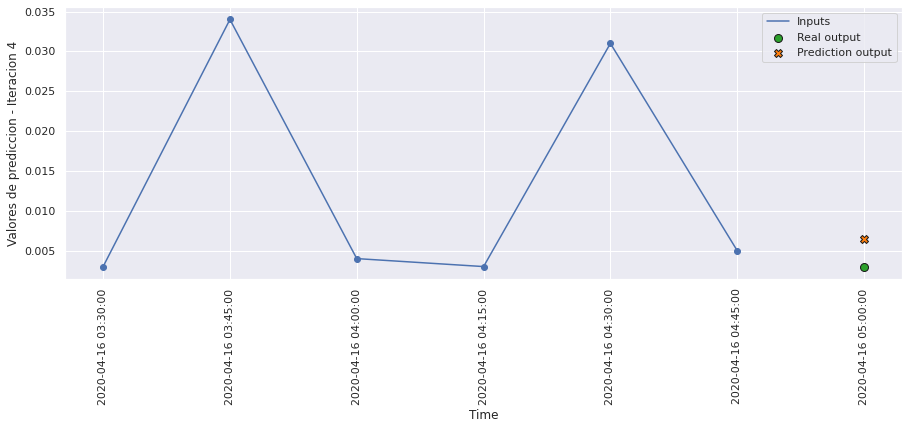

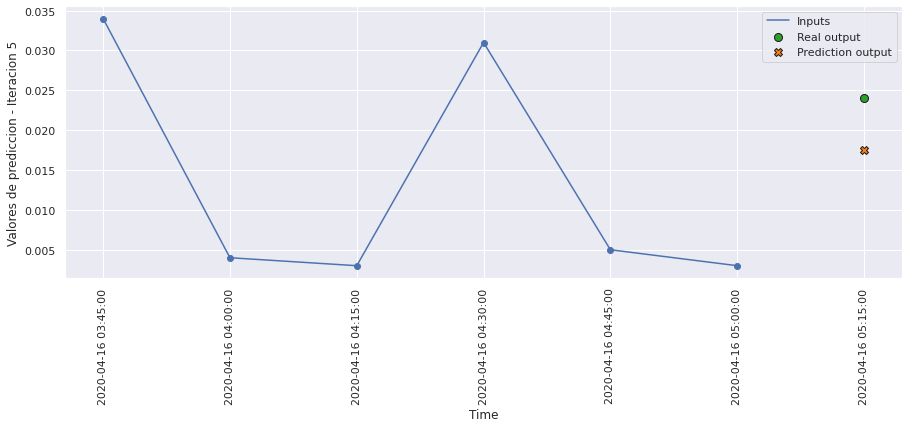

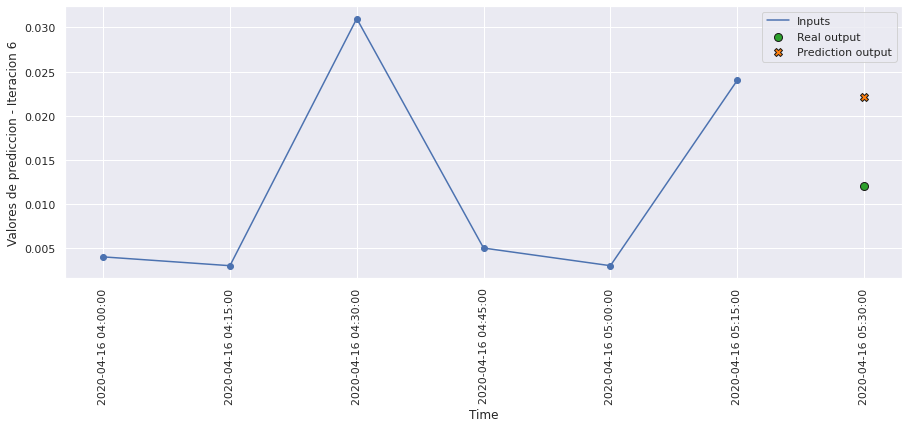

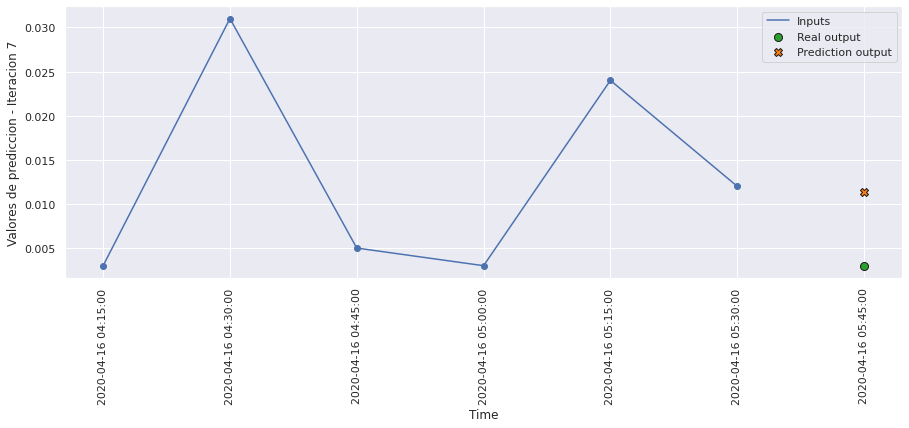

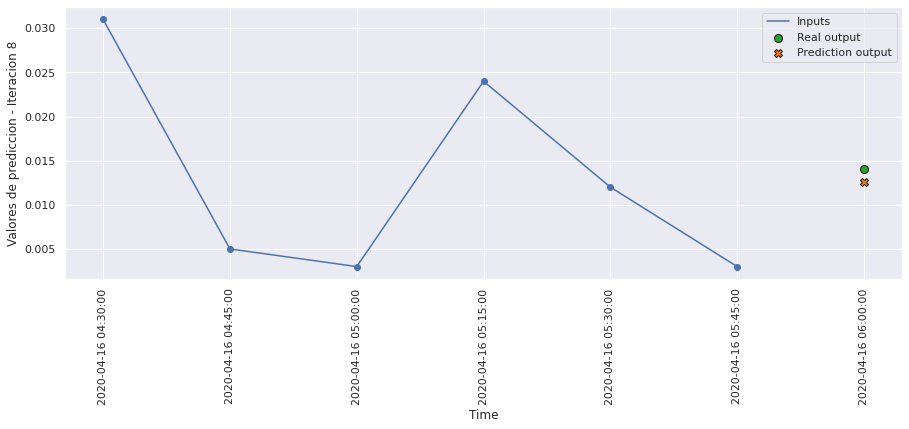

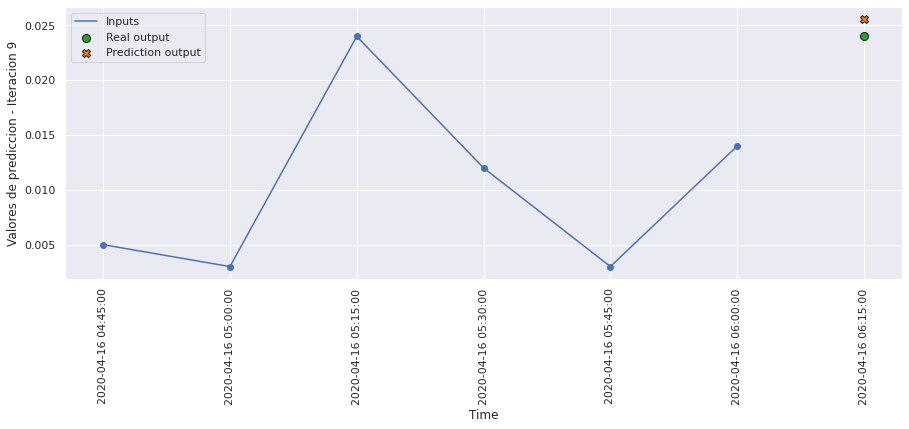

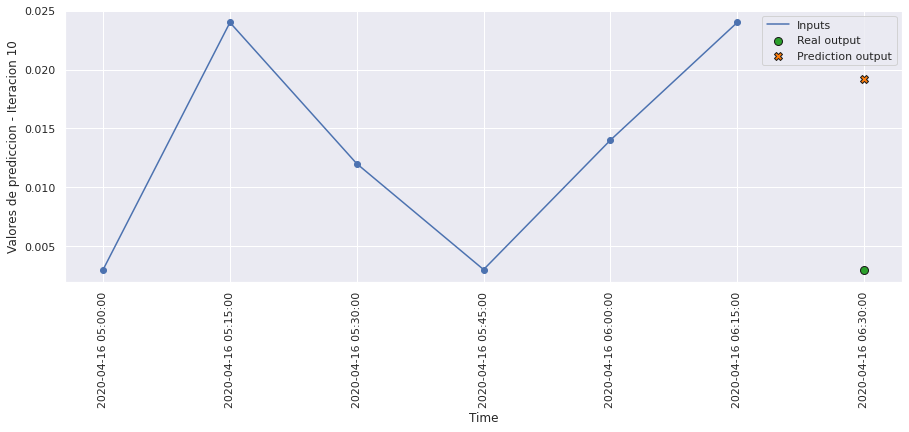

In [147]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, 
                        testPredict9.reshape(testPredict9.shape[0],n_predicciones), 10, 0)

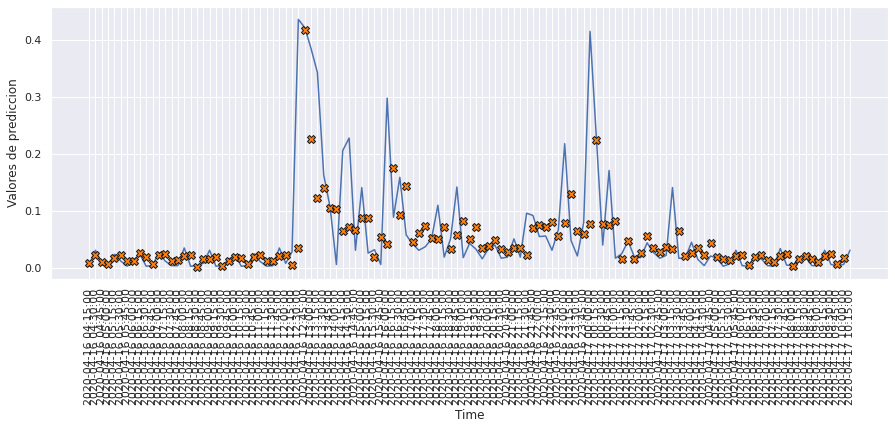

In [148]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions_values(int(test_df.iloc[0].name), 
                        testPredict9.reshape(testPredict9.shape[0],n_predicciones), 120)

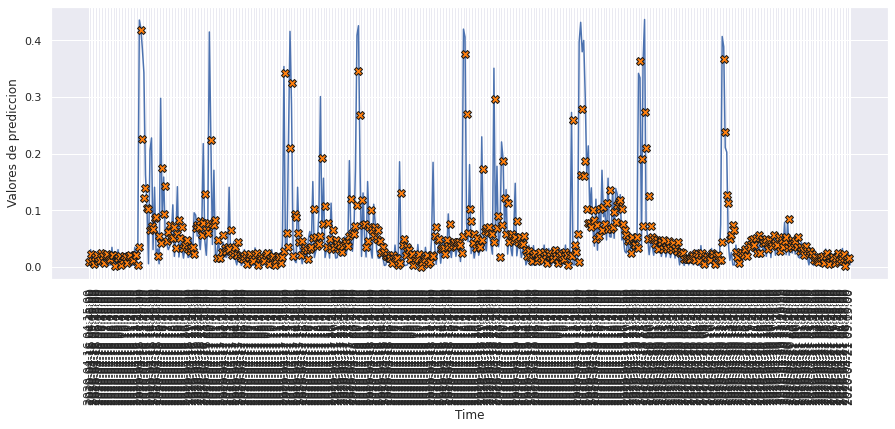

In [149]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions_values(int(test_df.iloc[0].name), 
                        testPredict9.reshape(testPredict9.shape[0],n_predicciones), 500)

# MODELO 10: GRU UNA CAPA

### Construimos el modelo

In [150]:
def build_model10():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.GRU(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [151]:
model10 = build_model10()
model10.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 128)               50304     
                                                                 
 dense_10 (Dense)            (None, 1)                 129       
                                                                 
Total params: 50,433
Trainable params: 50,433
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [152]:
history10 = model10.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 4s 9ms/step - loss: 0.0049 - mae: 0.0409 - mse: 0.0049 - smape: 0.7534 - val_loss: 0.0041 - val_mae: 0.0330 - val_mse: 0.0041 - val_smape: 0.6547
Epoch 2/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0048 - mae: 0.0403 - mse: 0.0048 - smape: 0.7451 - val_loss: 0.0041 - val_mae: 0.0328 - val_mse: 0.0041 - val_smape: 0.6474
Epoch 3/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0047 - mae: 0.0400 - mse: 0.0047 - smape: 0.7403 - val_loss: 0.0041 - val_mae: 0.0308 - val_mse: 0.0041 - val_smape: 0.6089
Epoch 4/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0047 - mae: 0.0398 - mse: 0.0047 - smape: 0.7385 - val_loss: 0.0040 - val_mae: 0.0310 - val_mse: 0.0040 - val_smape: 0.6169
Epoch 5/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0046 - mae: 0.0396 - mse: 0.0046 - smape: 0.7364 - val_loss: 0.0040 - val_mae: 0.0358 - val_mse: 0.0040 - val_smape: 0.

Epoch 82/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0045 - mae: 0.0382 - mse: 0.0045 - smape: 0.7115 - val_loss: 0.0039 - val_mae: 0.0338 - val_mse: 0.0039 - val_smape: 0.6872
Epoch 83/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0045 - mae: 0.0382 - mse: 0.0045 - smape: 0.7112 - val_loss: 0.0038 - val_mae: 0.0312 - val_mse: 0.0038 - val_smape: 0.6283
Epoch 84/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0045 - mae: 0.0382 - mse: 0.0045 - smape: 0.7127 - val_loss: 0.0038 - val_mae: 0.0299 - val_mse: 0.0038 - val_smape: 0.5979
Epoch 85/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0045 - mae: 0.0381 - mse: 0.0045 - smape: 0.7106 - val_loss: 0.0038 - val_mae: 0.0335 - val_mse: 0.0038 - val_smape: 0.6810
Epoch 86/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0045 - mae: 0.0381 - mse: 0.0045 - smape: 0.7099 - val_loss: 0.0038 - val_mae: 0.0356 - val_mse: 0.0038 - val_smap

354/354 [==============================] - 3s 8ms/step - loss: 0.0044 - mae: 0.0376 - mse: 0.0044 - smape: 0.7036 - val_loss: 0.0039 - val_mae: 0.0335 - val_mse: 0.0039 - val_smape: 0.6802
Epoch 163/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0044 - mae: 0.0376 - mse: 0.0044 - smape: 0.7040 - val_loss: 0.0040 - val_mae: 0.0341 - val_mse: 0.0040 - val_smape: 0.6903
Epoch 164/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0044 - mae: 0.0377 - mse: 0.0044 - smape: 0.7049 - val_loss: 0.0039 - val_mae: 0.0322 - val_mse: 0.0039 - val_smape: 0.6530
Epoch 165/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0044 - mae: 0.0376 - mse: 0.0044 - smape: 0.7047 - val_loss: 0.0039 - val_mae: 0.0306 - val_mse: 0.0039 - val_smape: 0.6177
Epoch 166/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0044 - mae: 0.0376 - mse: 0.0044 - smape: 0.7051 - val_loss: 0.0039 - val_mae: 0.0326 - val_mse: 0.0039 - val_smape: 0.6582

In [153]:
hist10 = pd.DataFrame(history10.history)
hist10['epoch'] = history10.epoch
hist10

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.004868,0.040896,0.004868,0.753355,0.004128,0.033015,0.004128,0.654741,0
1,0.004772,0.040330,0.004772,0.745113,0.004135,0.032764,0.004135,0.647394,1
2,0.004723,0.039999,0.004723,0.740270,0.004070,0.030804,0.004070,0.608900,2
3,0.004677,0.039754,0.004677,0.738493,0.003967,0.031048,0.003967,0.616891,3
4,0.004648,0.039620,0.004648,0.736427,0.003998,0.035849,0.003998,0.712636,4
...,...,...,...,...,...,...,...,...,...
195,0.004295,0.037112,0.004295,0.697158,0.003885,0.033359,0.003885,0.675436,195
196,0.004297,0.037156,0.004297,0.697052,0.003958,0.031109,0.003958,0.625284,196
197,0.004287,0.037082,0.004287,0.696777,0.003943,0.034325,0.003943,0.693147,197
198,0.004281,0.037081,0.004281,0.696605,0.003923,0.033351,0.003923,0.672098,198


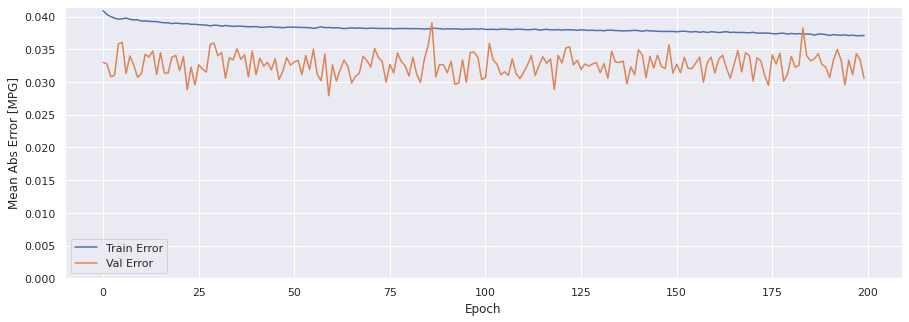

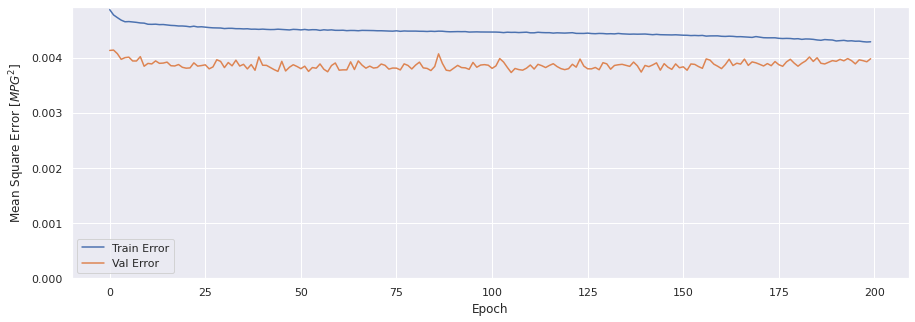

In [154]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history10)

### Evaluar predicciones

In [155]:
score_train10 = model10.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train10[0]}')
print(f'MAE:{score_train10[1]}')
print(f'MSE:{score_train10[2]}')
print(f'SMAPE:{score_train10[3]}')

1413/1413 [==============================] - 6s 5ms/step - loss: 0.0043 - mae: 0.0357 - mse: 0.0043 - smape: 0.6736
Loss:0.004253080580383539
MAE:0.03569459542632103
MSE:0.004253080580383539
SMAPE:0.6735879778862


In [156]:
score_val10 = model10.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val10[0]}')
print(f'MAE:{score_val10[1]}')
print(f'MSE:{score_val10[2]}')
print(f'SMAPE:{score_val10[3]}')

303/303 [==============================] - 1s 5ms/step - loss: 0.0040 - mae: 0.0305 - mse: 0.0040 - smape: 0.6115
Loss:0.0039778961800038815
MAE:0.030545832589268684
MSE:0.0039778961800038815
SMAPE:0.6114678382873535


In [157]:
score_test10 = model10.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test10[0]}')
print(f'MAE:{score_test10[1]}')
print(f'MSE:{score_test10[2]}')
print(f'SMAPE:{score_test10[3]}')

303/303 [==============================] - 1s 4ms/step - loss: 0.0047 - mae: 0.0365 - mse: 0.0047 - smape: 0.6499
Loss:0.004715038929134607
MAE:0.036476559937000275
MSE:0.004715038929134607
SMAPE:0.6498534083366394


### Comparativa de resultados

In [158]:
result = hist10.iloc[-1]
comparativa10 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test10[1], score_test10[2], score_test10[3], math.sqrt(score_test10[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa10.style.set_caption("Método de ventana de un paso - GRU una capa")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.037118,0.004285,0.697209,0.065461
VALIDACION,0.030546,0.003978,0.612292,0.063071
TEST,0.036477,0.004715,0.649853,0.068666


### Obtener predicciones

In [159]:
trainPredict10 = model10.predict(scaled_trainX)
testPredict10 = model10.predict(scaled_testX)

### Visualización de las predicciones

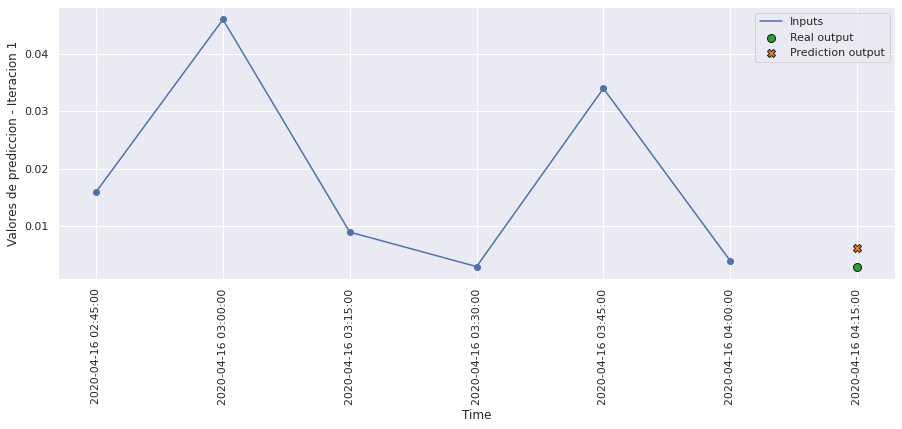

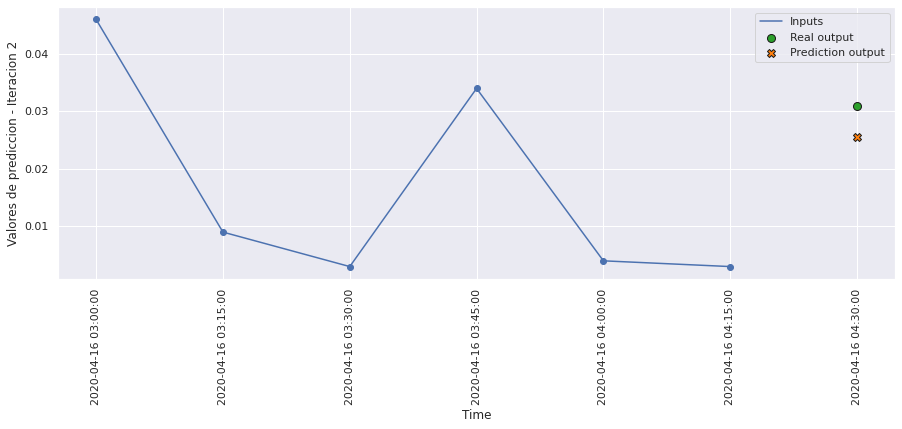

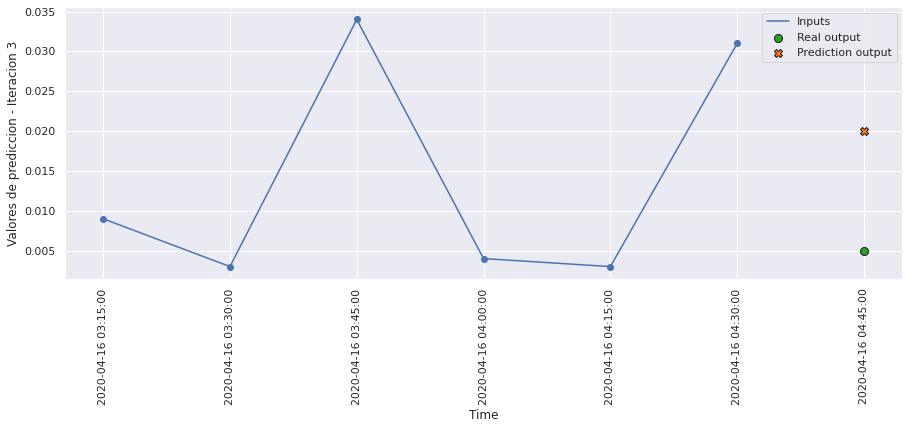

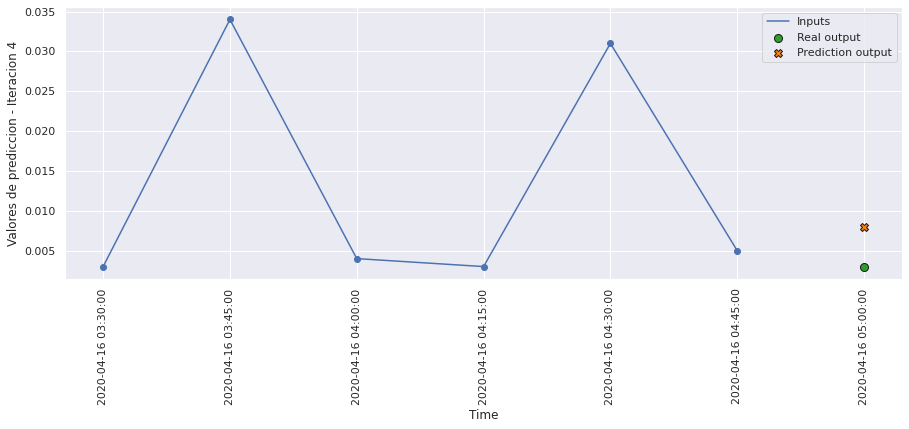

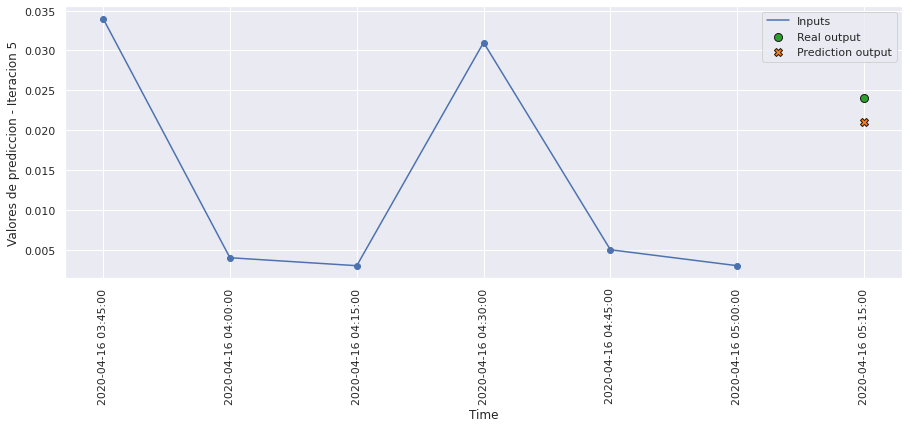

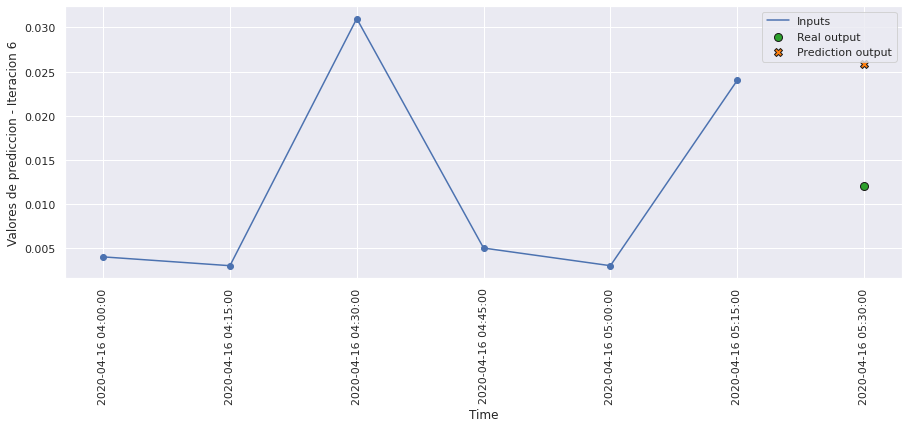

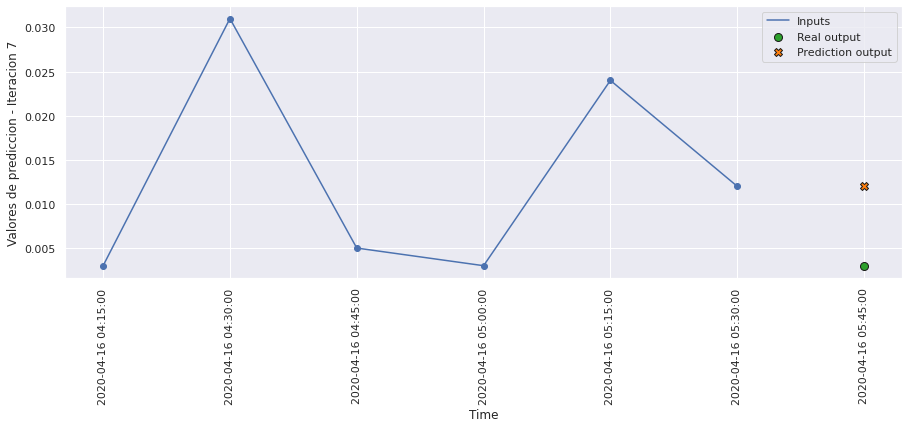

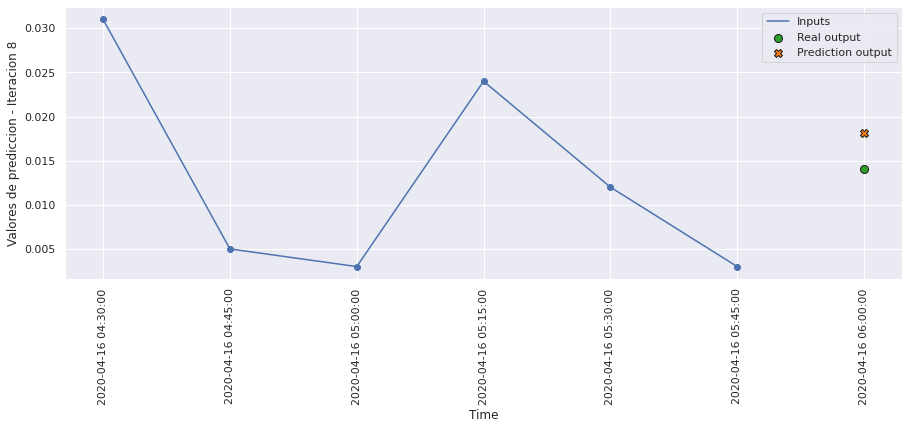

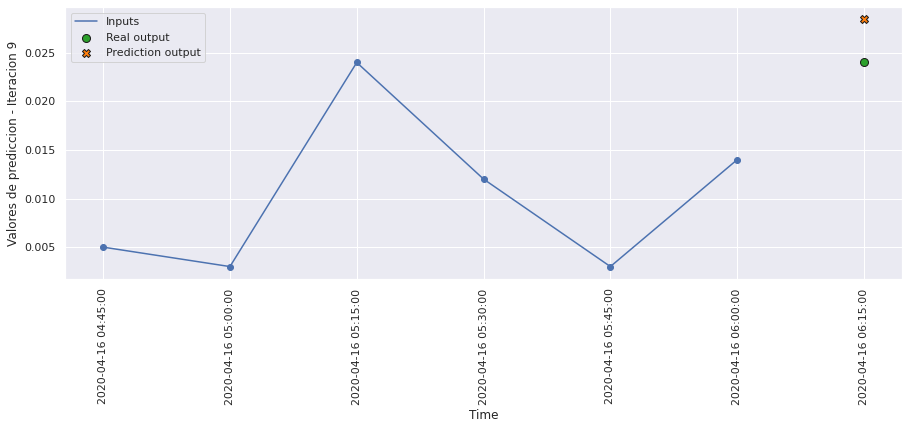

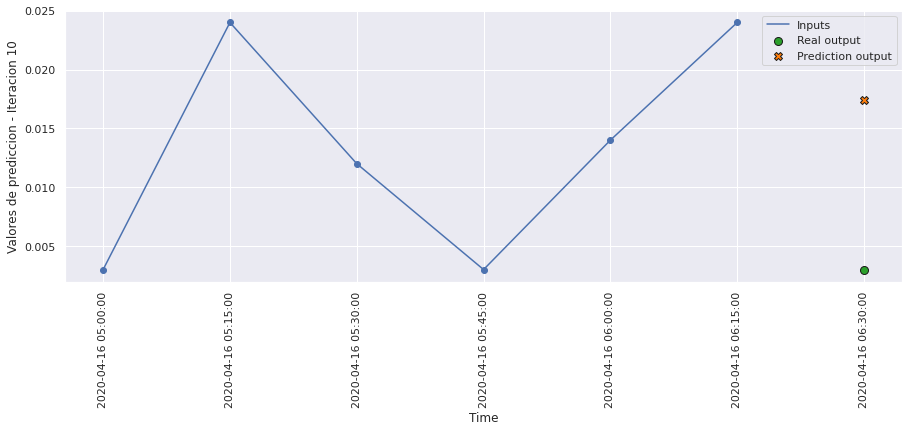

In [160]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict10, 10, 0)

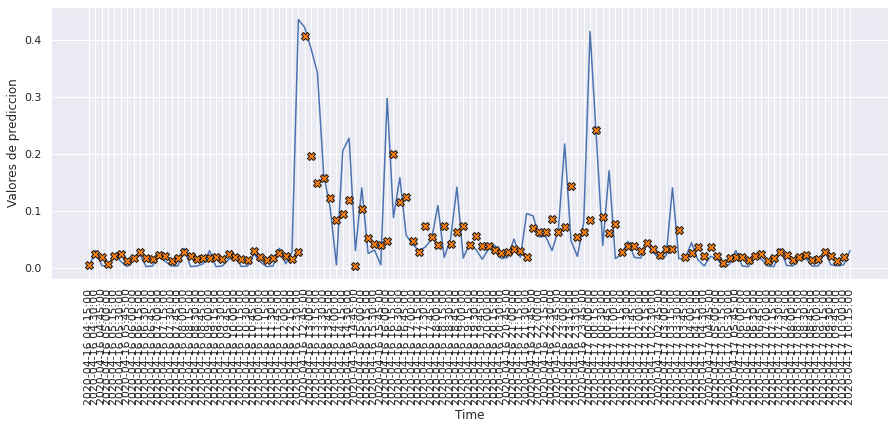

In [161]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict10, 120)

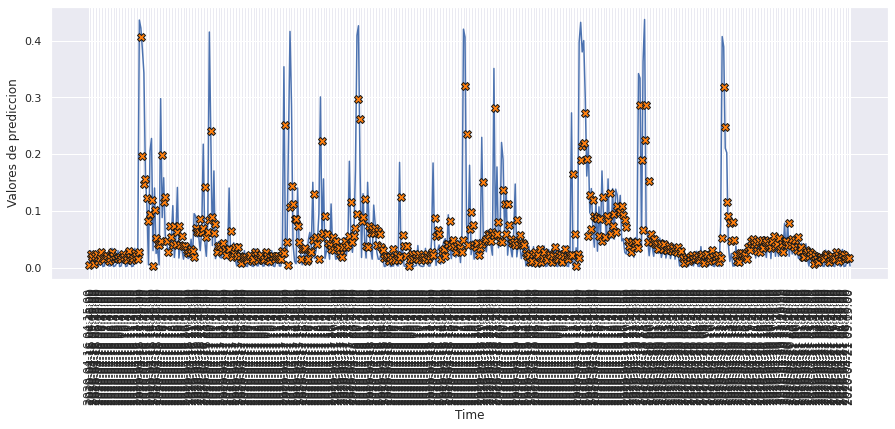

In [162]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict10, 500)

# MODELO 11: GRU DOS CAPAS

### Construimos el modelo

In [163]:
def build_model11():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.GRU(128, activation='tanh', return_sequences=True),
        tf.keras.layers.GRU(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [164]:
model11 = build_model11()
model11.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_1 (GRU)                 (None, 6, 128)            50304     
                                                                 
 gru_2 (GRU)                 (None, 128)               99072     
                                                                 
 dense_11 (Dense)            (None, 1)                 129       
                                                                 
Total params: 149,505
Trainable params: 149,505
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [165]:
history11 = model11.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 6s 13ms/step - loss: 0.0049 - mae: 0.0409 - mse: 0.0049 - smape: 0.7553 - val_loss: 0.0042 - val_mae: 0.0342 - val_mse: 0.0042 - val_smape: 0.6767
Epoch 2/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0048 - mae: 0.0404 - mse: 0.0048 - smape: 0.7464 - val_loss: 0.0042 - val_mae: 0.0375 - val_mse: 0.0042 - val_smape: 0.7369
Epoch 3/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0047 - mae: 0.0402 - mse: 0.0047 - smape: 0.7449 - val_loss: 0.0042 - val_mae: 0.0374 - val_mse: 0.0042 - val_smape: 0.7356
Epoch 4/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0047 - mae: 0.0399 - mse: 0.0047 - smape: 0.7412 - val_loss: 0.0041 - val_mae: 0.0358 - val_mse: 0.0041 - val_smape: 0.7145
Epoch 5/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0047 - mae: 0.0397 - mse: 0.0047 - smape: 0.7388 - val_loss: 0.0040 - val_mae: 0.0362 - val_mse: 0.0040 - val_smap

354/354 [==============================] - 4s 11ms/step - loss: 0.0044 - mae: 0.0376 - mse: 0.0044 - smape: 0.7074 - val_loss: 0.0038 - val_mae: 0.0318 - val_mse: 0.0038 - val_smape: 0.6486
Epoch 82/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0044 - mae: 0.0375 - mse: 0.0044 - smape: 0.7056 - val_loss: 0.0039 - val_mae: 0.0325 - val_mse: 0.0039 - val_smape: 0.6656
Epoch 83/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0044 - mae: 0.0376 - mse: 0.0044 - smape: 0.7075 - val_loss: 0.0039 - val_mae: 0.0327 - val_mse: 0.0039 - val_smape: 0.6730
Epoch 84/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0044 - mae: 0.0374 - mse: 0.0044 - smape: 0.7056 - val_loss: 0.0039 - val_mae: 0.0341 - val_mse: 0.0039 - val_smape: 0.6858
Epoch 85/200
354/354 [==============================] - 4s 11ms/step - loss: 0.0044 - mae: 0.0375 - mse: 0.0044 - smape: 0.7042 - val_loss: 0.0039 - val_mae: 0.0333 - val_mse: 0.0039 - val_smape: 0.685

In [166]:
hist11 = pd.DataFrame(history11.history)
hist11['epoch'] = history11.epoch
hist11

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.004874,0.040916,0.004874,0.755318,0.004189,0.034206,0.004189,0.676726,0
1,0.004769,0.040381,0.004769,0.746362,0.004165,0.037478,0.004165,0.736912,1
2,0.004748,0.040210,0.004748,0.744932,0.004241,0.037382,0.004241,0.735595,2
3,0.004700,0.039881,0.004700,0.741156,0.004123,0.035817,0.004123,0.714533,3
4,0.004672,0.039662,0.004672,0.738834,0.004016,0.036153,0.004016,0.719876,4
...,...,...,...,...,...,...,...,...,...
155,0.003371,0.032900,0.003371,0.672531,0.004594,0.031344,0.004594,0.609814,155
156,0.003338,0.032594,0.003338,0.667967,0.004651,0.034103,0.004651,0.668270,156
157,0.003325,0.032623,0.003325,0.668883,0.004600,0.034720,0.004600,0.690194,157
158,0.003308,0.032561,0.003308,0.671728,0.004720,0.037237,0.004720,0.737572,158


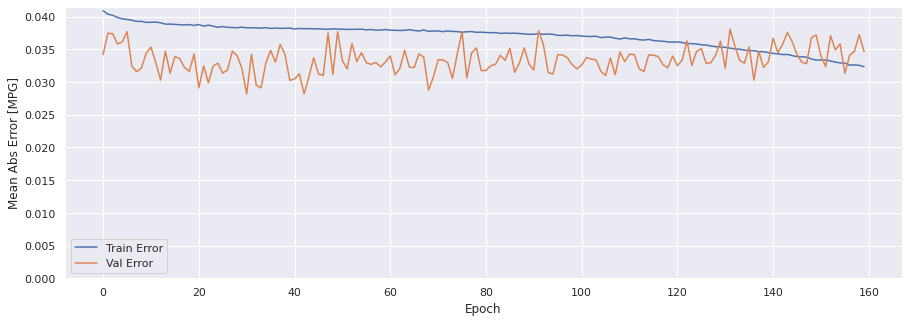

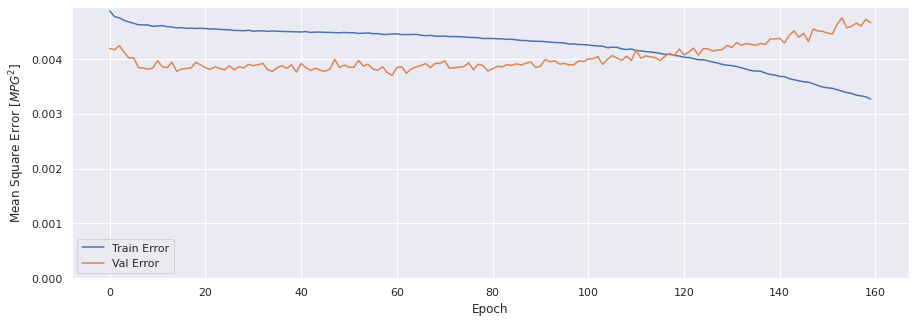

In [167]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history11)

### Evaluar predicciones

In [168]:
score_train11 = model11.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train11[0]}')
print(f'MAE:{score_train11[1]}')
print(f'MSE:{score_train11[2]}')
print(f'SMAPE:{score_train11[3]}')

1413/1413 [==============================] - 8s 6ms/step - loss: 0.0032 - mae: 0.0314 - mse: 0.0032 - smape: 0.6556
Loss:0.003173146629706025
MAE:0.03136758133769035
MSE:0.003173146629706025
SMAPE:0.6556248068809509


In [169]:
score_val11 = model11.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val11[0]}')
print(f'MAE:{score_val11[1]}')
print(f'MSE:{score_val11[2]}')
print(f'SMAPE:{score_val11[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0047 - mae: 0.0347 - mse: 0.0047 - smape: 0.6884
Loss:0.0046578883193433285
MAE:0.034676335752010345
MSE:0.0046578883193433285
SMAPE:0.688438892364502


In [170]:
score_test11 = model11.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test11[0]}')
print(f'MAE:{score_test11[1]}')
print(f'MSE:{score_test11[2]}')
print(f'SMAPE:{score_test11[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0056 - mae: 0.0408 - mse: 0.0056 - smape: 0.7261
Loss:0.005582354497164488
MAE:0.0408213846385479
MSE:0.005582354497164488
SMAPE:0.7261170744895935


### Comparativa de resultados

In [171]:
result = hist11.iloc[-1]
comparativa11 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test11[1], score_test11[2], score_test11[3], math.sqrt(score_test11[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa11.style.set_caption("Método de ventana de un paso - GRU dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.032349,0.003268,0.668866,0.057167
VALIDACION,0.034676,0.004658,0.689288,0.068249
TEST,0.040821,0.005582,0.726117,0.074715


### Obtener predicciones

In [172]:
trainPredict11 = model11.predict(scaled_trainX)
testPredict11 = model11.predict(scaled_testX)

### Visualización de las predicciones

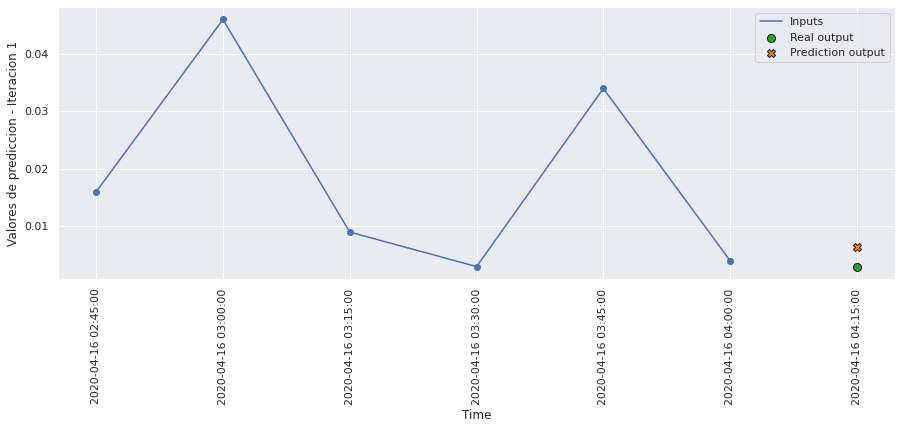

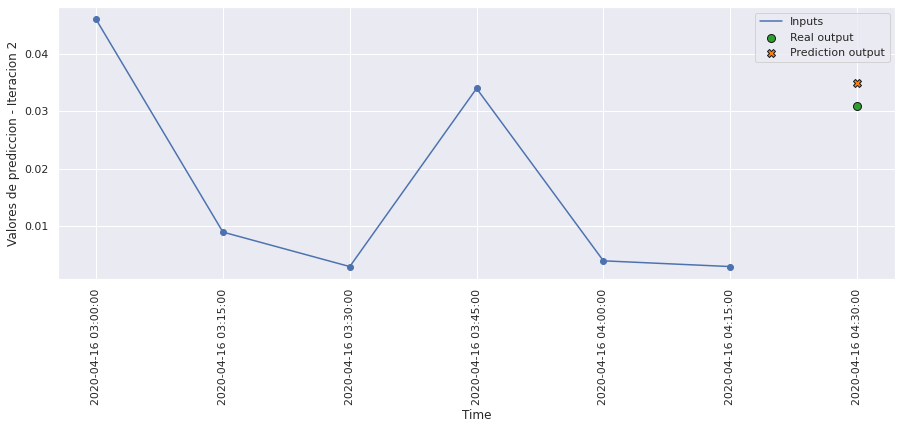

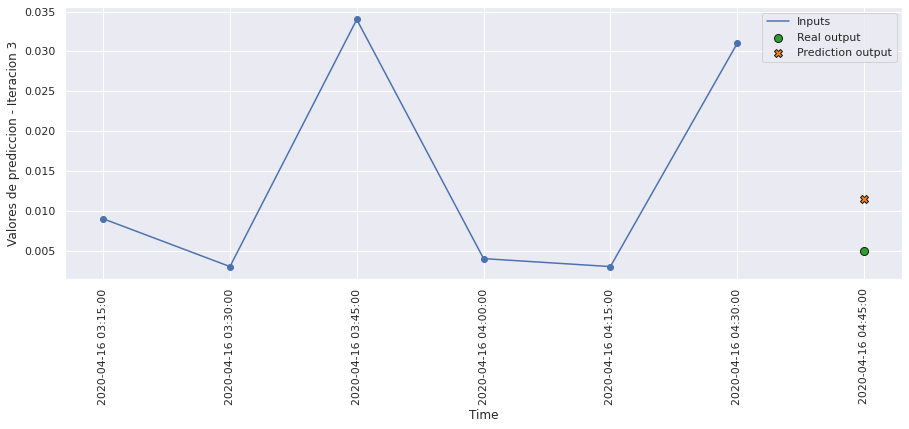

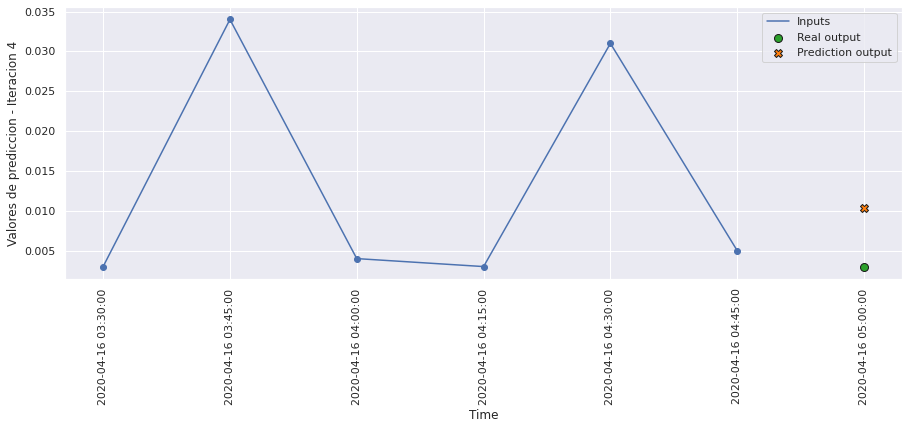

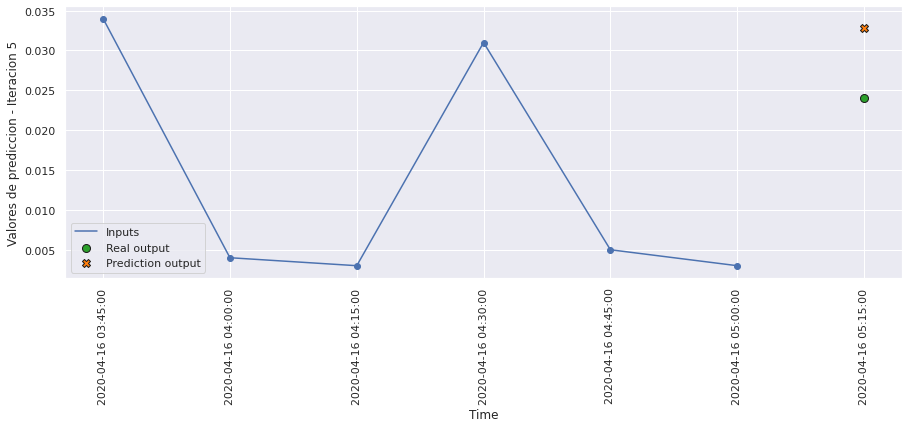

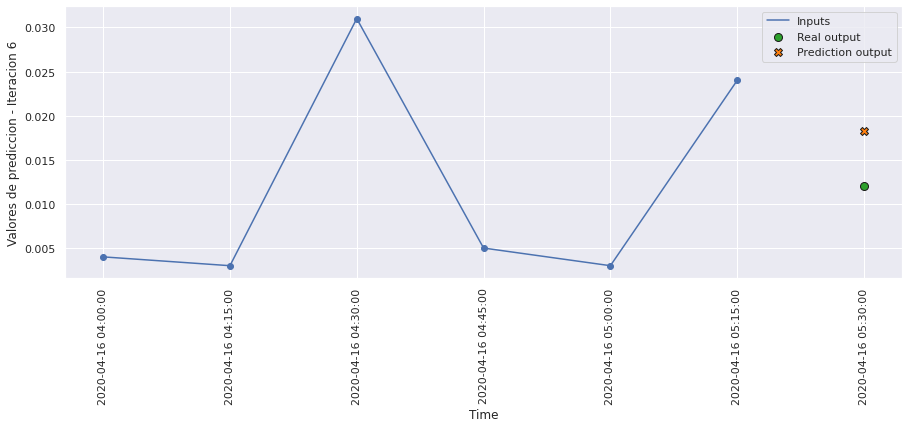

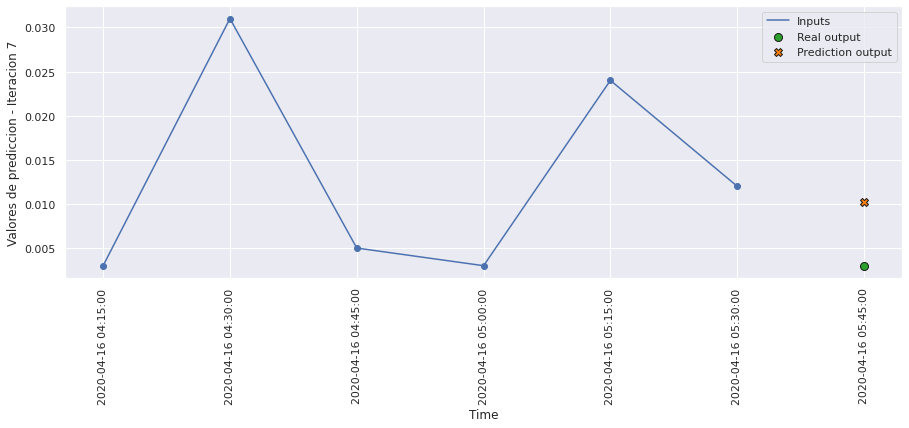

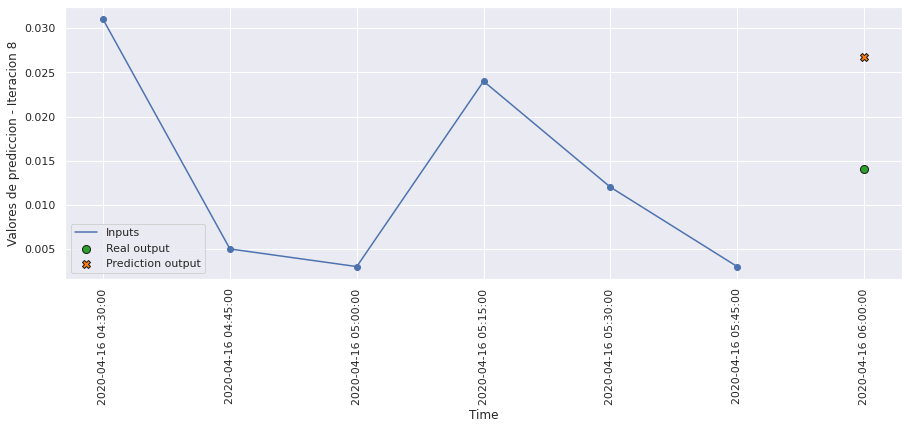

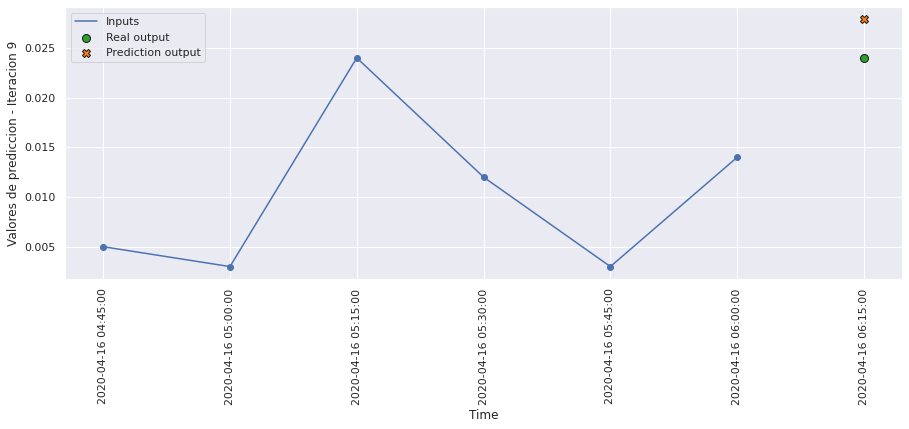

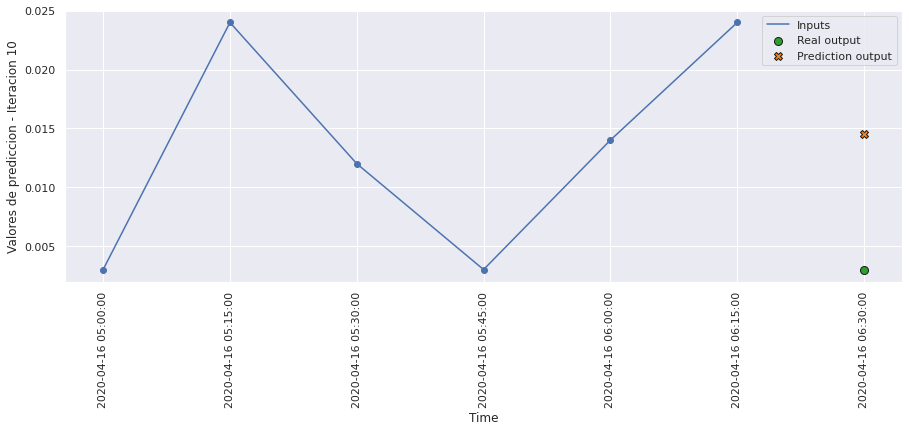

In [173]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict11, 10, 0)

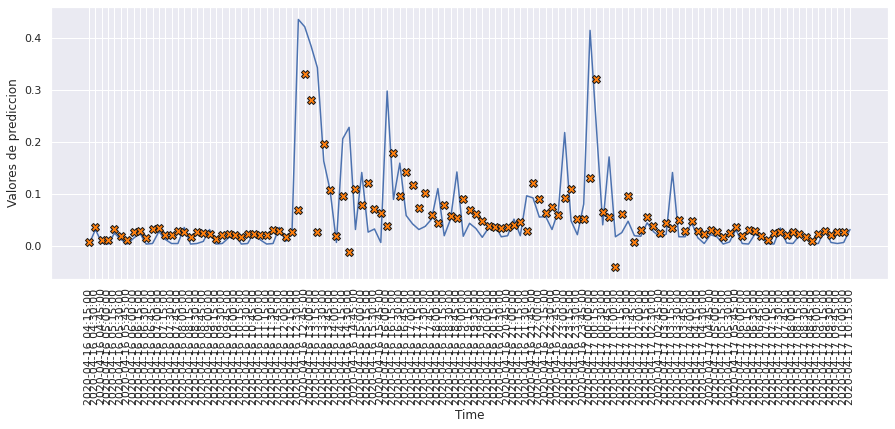

In [174]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict11, 120)

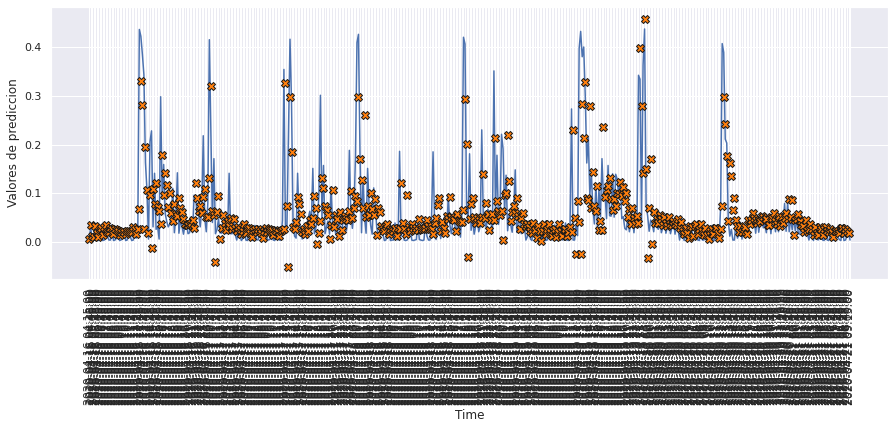

In [175]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict11, 500)

# MODELO 12: LSTM UNRESTRICTED UNA CAPA

### Construimos el modelo

In [176]:
def build_model12():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [177]:
model12 = build_model12()
model12.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, 6, 128)            66560     
                                                                 
 flatten_4 (Flatten)         (None, 768)               0         
                                                                 
 dense_12 (Dense)            (None, 1)                 769       
                                                                 
Total params: 67,329
Trainable params: 67,329
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [178]:
history12 = model12.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 4s 9ms/step - loss: 0.0052 - mae: 0.0419 - mse: 0.0052 - smape: nan - val_loss: 0.0042 - val_mae: 0.0313 - val_mse: 0.0042 - val_smape: 0.6199
Epoch 2/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0047 - mae: 0.0399 - mse: 0.0047 - smape: 0.7391 - val_loss: 0.0041 - val_mae: 0.0308 - val_mse: 0.0041 - val_smape: 0.6044
Epoch 3/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0047 - mae: 0.0398 - mse: 0.0047 - smape: 0.7383 - val_loss: 0.0040 - val_mae: 0.0333 - val_mse: 0.0040 - val_smape: 0.6684
Epoch 4/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0047 - mae: 0.0398 - mse: 0.0047 - smape: 0.7385 - val_loss: 0.0040 - val_mae: 0.0354 - val_mse: 0.0040 - val_smape: 0.6985
Epoch 5/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0047 - mae: 0.0397 - mse: 0.0047 - smape: 0.7386 - val_loss: 0.0040 - val_mae: 0.0351 - val_mse: 0.0040 - val_smape: 0.701

Epoch 42/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0045 - mae: 0.0387 - mse: 0.0045 - smape: 0.7238 - val_loss: 0.0038 - val_mae: 0.0330 - val_mse: 0.0038 - val_smape: 0.6727
Epoch 43/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0045 - mae: 0.0387 - mse: 0.0045 - smape: 0.7241 - val_loss: 0.0039 - val_mae: 0.0333 - val_mse: 0.0039 - val_smape: 0.6756
Epoch 44/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0045 - mae: 0.0387 - mse: 0.0045 - smape: 0.7252 - val_loss: 0.0039 - val_mae: 0.0357 - val_mse: 0.0039 - val_smape: 0.7221
Epoch 45/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0046 - mae: 0.0389 - mse: 0.0046 - smape: 0.7261 - val_loss: 0.0038 - val_mae: 0.0321 - val_mse: 0.0038 - val_smape: 0.6595
Epoch 46/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0045 - mae: 0.0387 - mse: 0.0045 - smape: 0.7247 - val_loss: 0.0038 - val_mae: 0.0318 - val_mse: 0.0038 - val_smap

354/354 [==============================] - 3s 8ms/step - loss: 0.0045 - mae: 0.0381 - mse: 0.0045 - smape: 0.7105 - val_loss: 0.0038 - val_mae: 0.0333 - val_mse: 0.0038 - val_smape: 0.6797
Epoch 123/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0045 - mae: 0.0380 - mse: 0.0045 - smape: 0.7089 - val_loss: 0.0039 - val_mae: 0.0320 - val_mse: 0.0039 - val_smape: 0.6476
Epoch 124/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0045 - mae: 0.0381 - mse: 0.0045 - smape: 0.7105 - val_loss: 0.0038 - val_mae: 0.0338 - val_mse: 0.0038 - val_smape: 0.6855
Epoch 125/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0045 - mae: 0.0381 - mse: 0.0045 - smape: 0.7097 - val_loss: 0.0038 - val_mae: 0.0302 - val_mse: 0.0038 - val_smape: 0.6062
Epoch 126/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0045 - mae: 0.0381 - mse: 0.0045 - smape: 0.7097 - val_loss: 0.0038 - val_mae: 0.0307 - val_mse: 0.0038 - val_smape: 0.6199

In [179]:
hist12 = pd.DataFrame(history12.history)
hist12['epoch'] = history12.epoch
hist12

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.005150,0.041857,0.005150,NaN,0.004161,0.031293,0.004161,0.619926,0
1,0.004729,0.039925,0.004729,0.739089,0.004099,0.030826,0.004099,0.604357,1
2,0.004690,0.039811,0.004690,0.738290,0.004026,0.033328,0.004026,0.668398,2
3,0.004661,0.039781,0.004661,0.738546,0.004029,0.035380,0.004029,0.698485,3
4,0.004655,0.039731,0.004655,0.738608,0.003953,0.035074,0.003953,0.701858,4
...,...,...,...,...,...,...,...,...,...
195,0.004415,0.037775,0.004415,0.706836,0.003815,0.032391,0.003815,0.663454,195
196,0.004416,0.037783,0.004416,0.706612,0.003812,0.032031,0.003812,0.657216,196
197,0.004416,0.037812,0.004416,0.706505,0.003831,0.031838,0.003831,0.646934,197
198,0.004415,0.037703,0.004415,0.705214,0.003803,0.032096,0.003803,0.648362,198


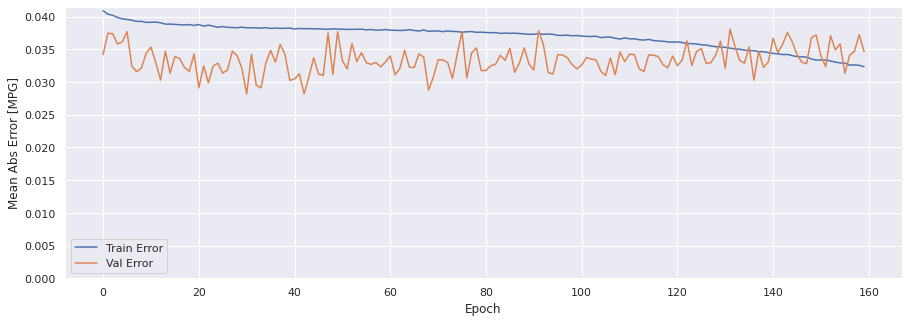

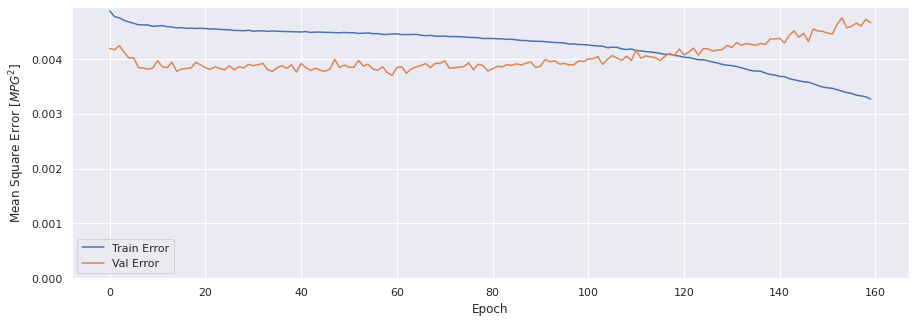

In [180]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history11)

### Evaluar predicciones

In [181]:
score_train12 = model12.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train12[0]}')
print(f'MAE:{score_train12[1]}')
print(f'MSE:{score_train12[2]}')
print(f'SMAPE:{score_train12[3]}')

1413/1413 [==============================] - 7s 5ms/step - loss: 0.0044 - mae: 0.0391 - mse: 0.0044 - smape: 0.7291
Loss:0.004401812329888344
MAE:0.039104025810956955
MSE:0.004401812329888344
SMAPE:0.7291111946105957


In [182]:
score_val12 = model12.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val12[0]}')
print(f'MAE:{score_val12[1]}')
print(f'MSE:{score_val12[2]}')
print(f'SMAPE:{score_val12[3]}')

303/303 [==============================] - 1s 5ms/step - loss: 0.0038 - mae: 0.0342 - mse: 0.0038 - smape: 0.6962
Loss:0.003800494596362114
MAE:0.03415470942854881
MSE:0.003800494596362114
SMAPE:0.6962399482727051


In [183]:
score_test12 = model12.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test12[0]}')
print(f'MAE:{score_test12[1]}')
print(f'MSE:{score_test12[2]}')
print(f'SMAPE:{score_test12[3]}')

303/303 [==============================] - 1s 5ms/step - loss: 0.0045 - mae: 0.0402 - mse: 0.0045 - smape: 0.7358
Loss:0.004535611718893051
MAE:0.040239956229925156
MSE:0.004535611718893051
SMAPE:0.7357881665229797


### Comparativa de resultados

In [184]:
result = hist12.iloc[-1]
comparativa12 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test12[1], score_test12[2], score_test12[3], math.sqrt(score_test12[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa12.style.set_caption("Método de ventana de un paso - LSTM UNRESTRICTED una capa")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.037691,0.004415,0.705672,0.066442
VALIDACION,0.034155,0.003800,0.696951,0.061648
TEST,0.040240,0.004536,0.735788,0.067347


### Obtener predicciones

In [185]:
trainPredict12 = model12.predict(scaled_trainX)
testPredict12 = model12.predict(scaled_testX)

### Visualización de las predicciones

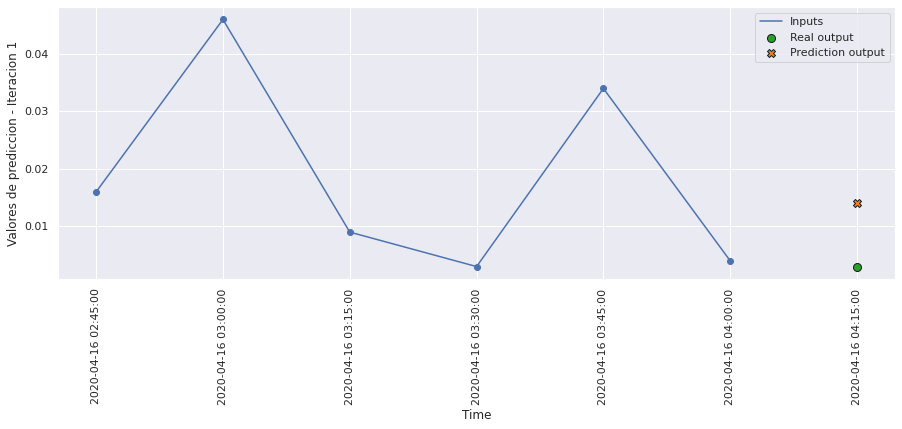

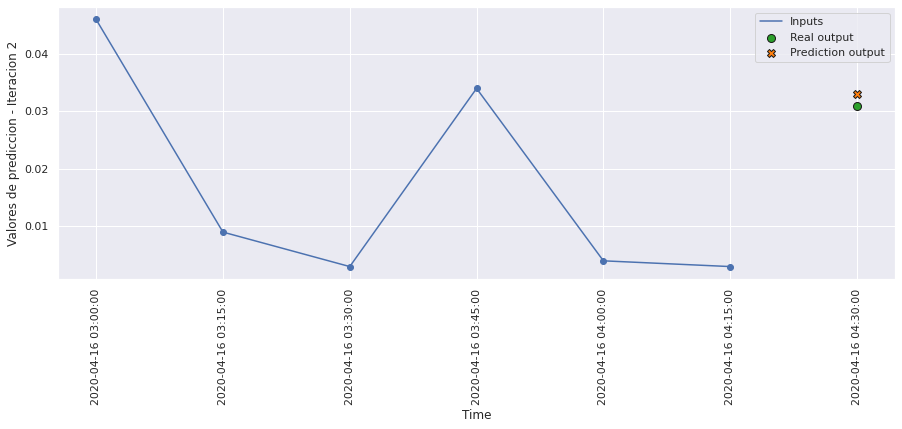

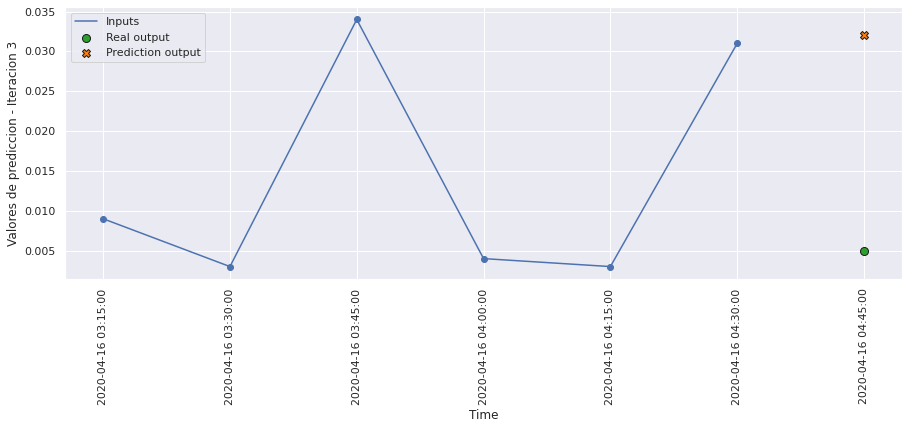

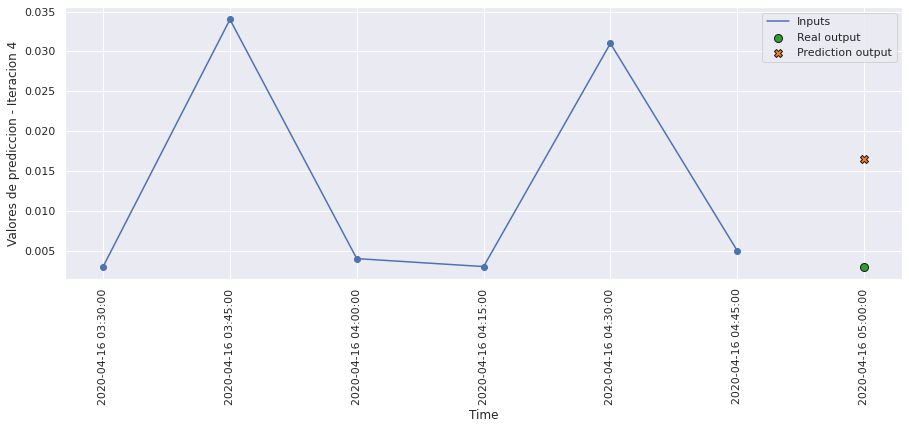

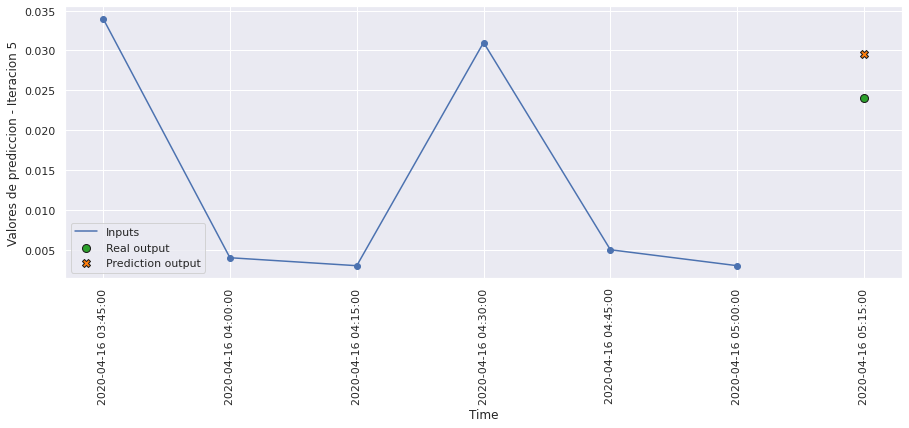

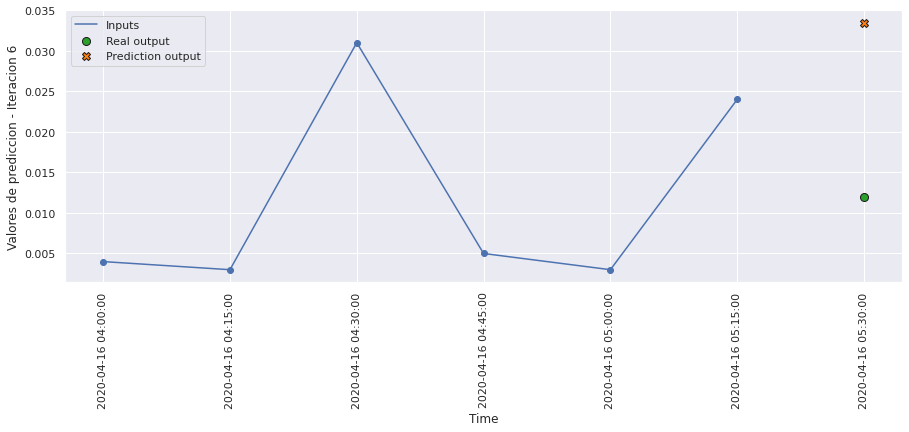

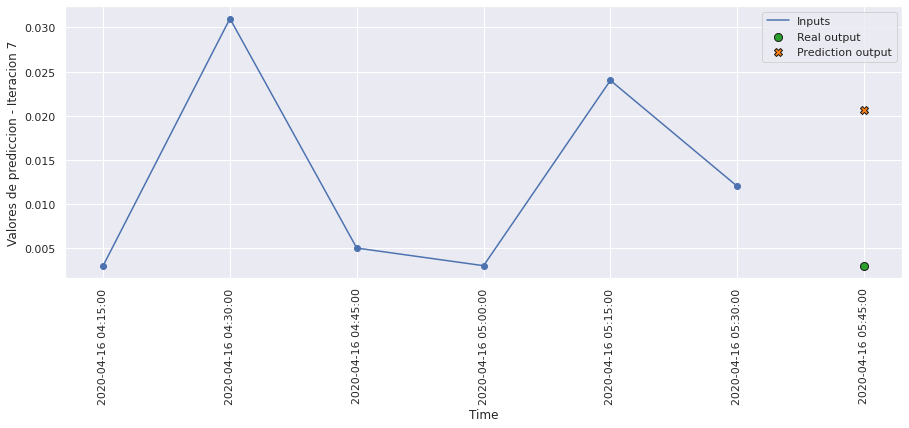

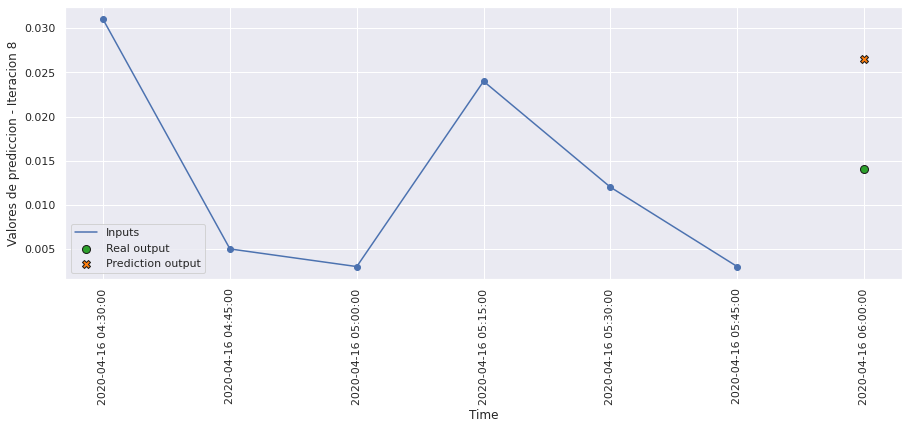

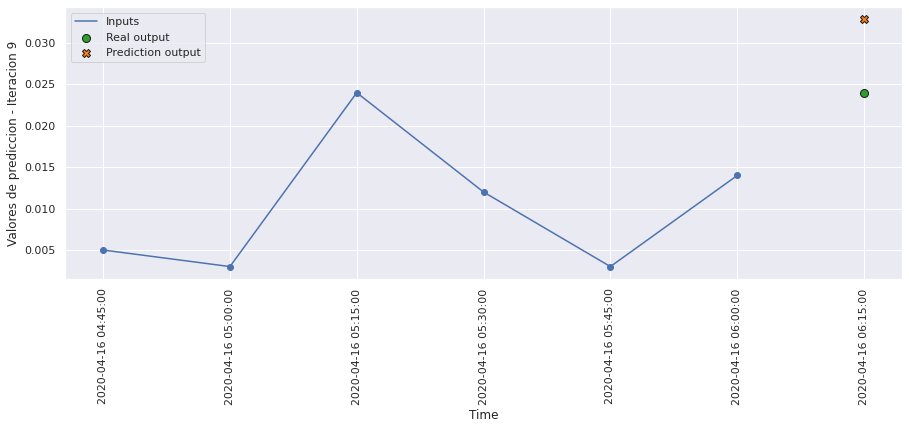

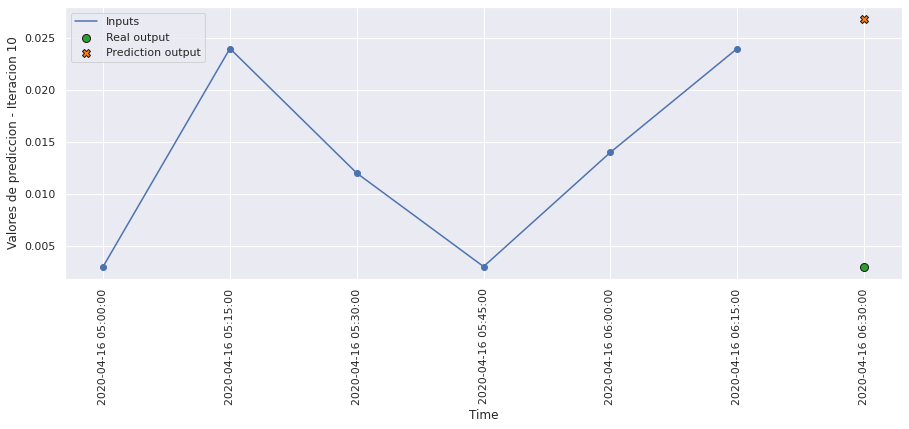

In [186]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict12, 10, 0)

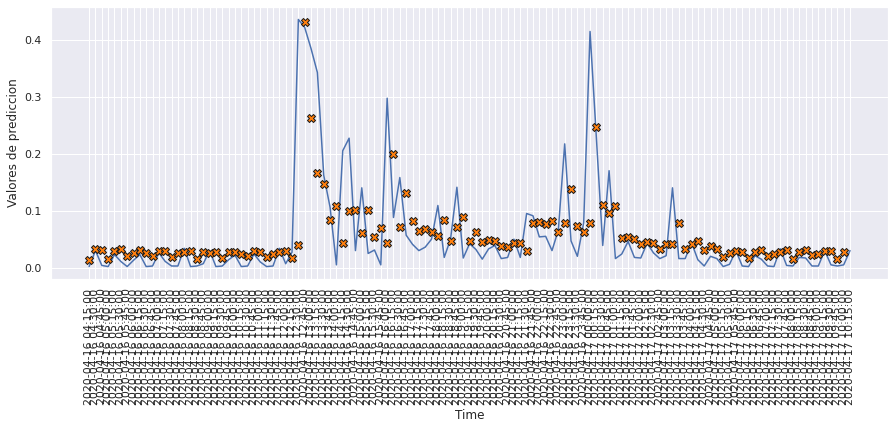

In [187]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict12, 120)

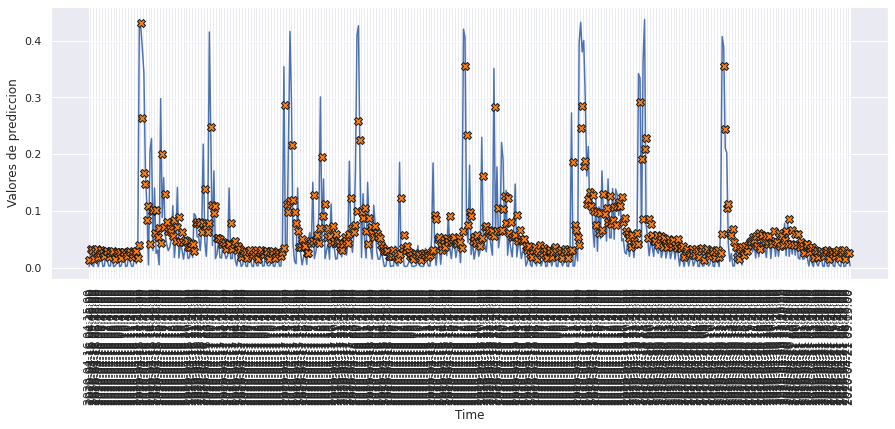

In [188]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict12, 500)

# MODELO 13: LSTM UNRESTRICTED DOS CAPAS

### Construimos el modelo

In [189]:
def build_model13():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [190]:
model13 = build_model13()
model13.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_11 (LSTM)              (None, 6, 128)            66560     
                                                                 
 lstm_12 (LSTM)              (None, 6, 128)            131584    
                                                                 
 flatten_5 (Flatten)         (None, 768)               0         
                                                                 
 dense_13 (Dense)            (None, 1)                 769       
                                                                 
Total params: 198,913
Trainable params: 198,913
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [191]:
history13 = model13.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 13ms/step - loss: 0.0052 - mae: 0.0420 - mse: 0.0052 - smape: 0.7675 - val_loss: 0.0042 - val_mae: 0.0308 - val_mse: 0.0042 - val_smape: 0.6052
Epoch 2/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0047 - mae: 0.0399 - mse: 0.0047 - smape: 0.7400 - val_loss: 0.0041 - val_mae: 0.0336 - val_mse: 0.0041 - val_smape: 0.6703
Epoch 3/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0047 - mae: 0.0399 - mse: 0.0047 - smape: 0.7409 - val_loss: 0.0041 - val_mae: 0.0331 - val_mse: 0.0041 - val_smape: 0.6598
Epoch 4/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0047 - mae: 0.0398 - mse: 0.0047 - smape: 0.7399 - val_loss: 0.0041 - val_mae: 0.0335 - val_mse: 0.0041 - val_smape: 0.6710
Epoch 5/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0046 - mae: 0.0397 - mse: 0.0046 - smape: 0.7396 - val_loss: 0.0039 - val_mae: 0.0293 - val_mse: 0.0039 - val_smap

354/354 [==============================] - 4s 12ms/step - loss: 0.0044 - mae: 0.0379 - mse: 0.0044 - smape: 0.7108 - val_loss: 0.0039 - val_mae: 0.0316 - val_mse: 0.0039 - val_smape: 0.6416
Epoch 82/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0044 - mae: 0.0379 - mse: 0.0044 - smape: 0.7098 - val_loss: 0.0038 - val_mae: 0.0317 - val_mse: 0.0038 - val_smape: 0.6503
Epoch 83/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0044 - mae: 0.0378 - mse: 0.0044 - smape: 0.7096 - val_loss: 0.0038 - val_mae: 0.0330 - val_mse: 0.0038 - val_smape: 0.6769
Epoch 84/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0044 - mae: 0.0379 - mse: 0.0044 - smape: 0.7095 - val_loss: 0.0038 - val_mae: 0.0324 - val_mse: 0.0038 - val_smape: 0.6603
Epoch 85/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0044 - mae: 0.0378 - mse: 0.0044 - smape: 0.7083 - val_loss: 0.0038 - val_mae: 0.0306 - val_mse: 0.0038 - val_smape: 0.624

In [192]:
hist13 = pd.DataFrame(history13.history)
hist13['epoch'] = history13.epoch
hist13

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.005183,0.041989,0.005183,0.767548,0.004190,0.030757,0.004190,0.605218,0
1,0.004724,0.039929,0.004724,0.739978,0.004068,0.033626,0.004068,0.670327,1
2,0.004680,0.039851,0.004680,0.740919,0.004053,0.033050,0.004053,0.659786,2
3,0.004664,0.039760,0.004664,0.739851,0.004098,0.033545,0.004098,0.670964,3
4,0.004639,0.039662,0.004639,0.739614,0.003892,0.029287,0.003892,0.575344,4
...,...,...,...,...,...,...,...,...,...
149,0.004264,0.036988,0.004264,0.699631,0.003993,0.034975,0.003993,0.709799,149
150,0.004270,0.037006,0.004270,0.698709,0.003912,0.034760,0.003912,0.705763,150
151,0.004266,0.036922,0.004266,0.697019,0.003927,0.034097,0.003927,0.684822,151
152,0.004253,0.036962,0.004253,0.697203,0.003972,0.032838,0.003972,0.658699,152


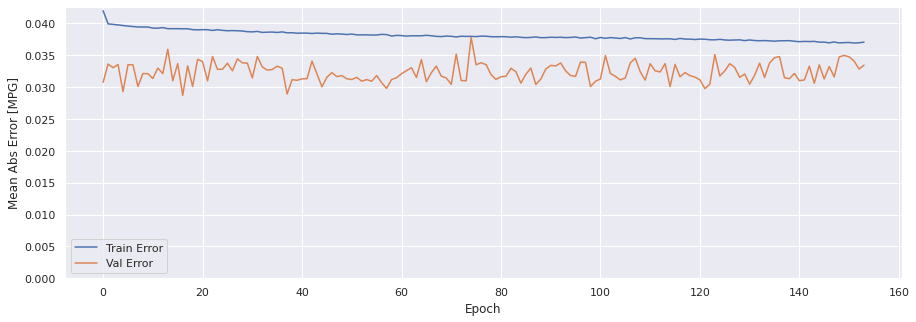

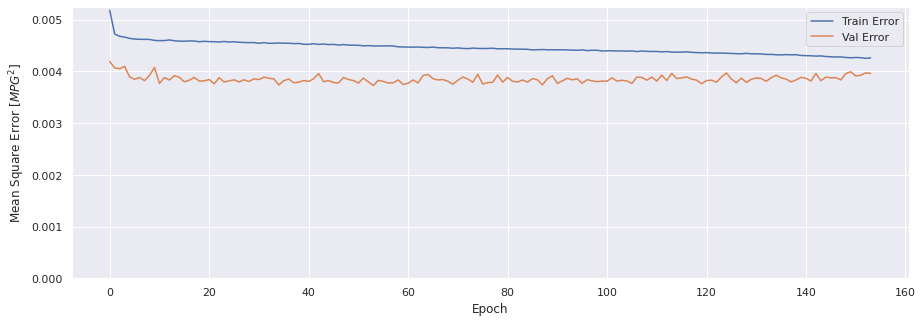

In [193]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history13)

### Evaluar predicciones

In [194]:
score_train13 = model13.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train13[0]}')
print(f'MAE:{score_train13[1]}')
print(f'MSE:{score_train13[2]}')
print(f'SMAPE:{score_train13[3]}')

1413/1413 [==============================] - 9s 6ms/step - loss: 0.0042 - mae: 0.0368 - mse: 0.0042 - smape: 0.7027
Loss:0.004209864418953657
MAE:0.03679502755403519
MSE:0.004209864418953657
SMAPE:0.7027406096458435


In [195]:
score_val13 = model13.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val13[0]}')
print(f'MAE:{score_val13[1]}')
print(f'MSE:{score_val13[2]}')
print(f'SMAPE:{score_val13[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0040 - mae: 0.0334 - mse: 0.0040 - smape: 0.6781
Loss:0.003963551949709654
MAE:0.03344719111919403
MSE:0.003963551949709654
SMAPE:0.6780949234962463


In [196]:
score_test13 = model13.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test13[0]}')
print(f'MAE:{score_test13[1]}')
print(f'MSE:{score_test13[2]}')
print(f'SMAPE:{score_test13[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0046 - mae: 0.0391 - mse: 0.0046 - smape: 0.7135
Loss:0.004649946000427008
MAE:0.03906308114528656
MSE:0.004649946000427008
SMAPE:0.7135032415390015


### Comparativa de resultados

In [197]:
result = hist13.iloc[-1]
comparativa13 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test13[1], score_test13[2], score_test13[3], math.sqrt(score_test13[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa13.style.set_caption("Método de ventana de un paso - LSTM UNRESTRICTED dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.037059,0.004263,0.700527,0.065289
VALIDACION,0.033447,0.003964,0.678977,0.062957
TEST,0.039063,0.004650,0.713503,0.068191


### Obtener predicciones

In [198]:
trainPredict13 = model13.predict(scaled_trainX)
testPredict13 = model13.predict(scaled_testX)

### Visualización de las predicciones

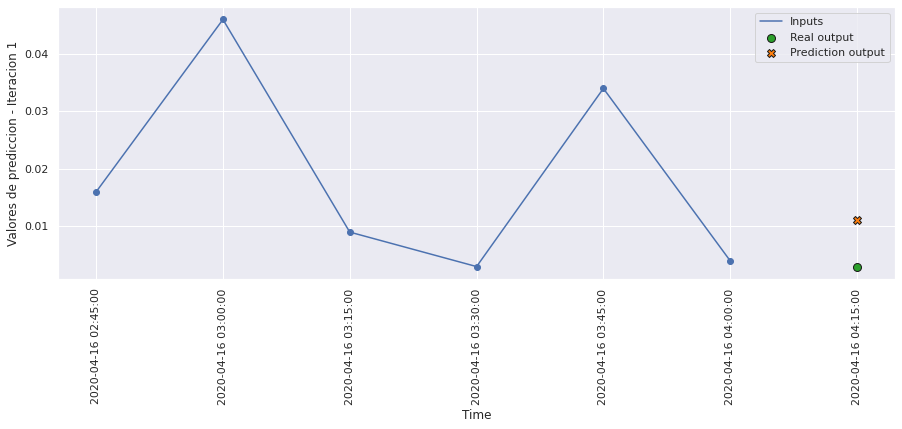

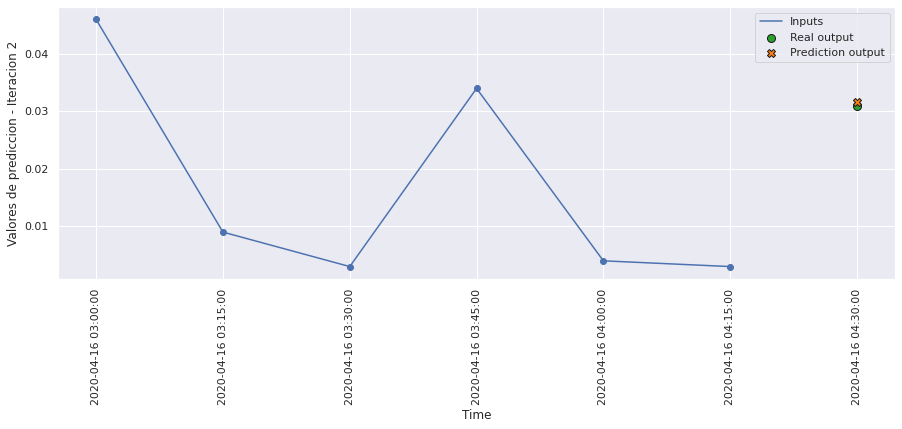

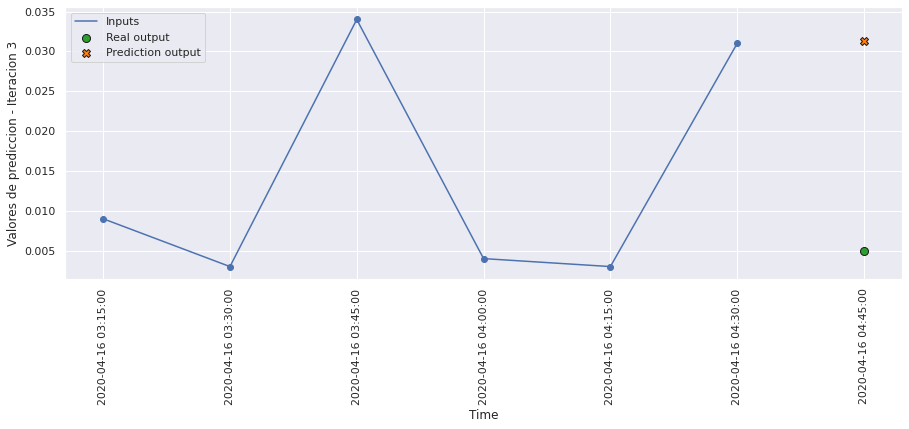

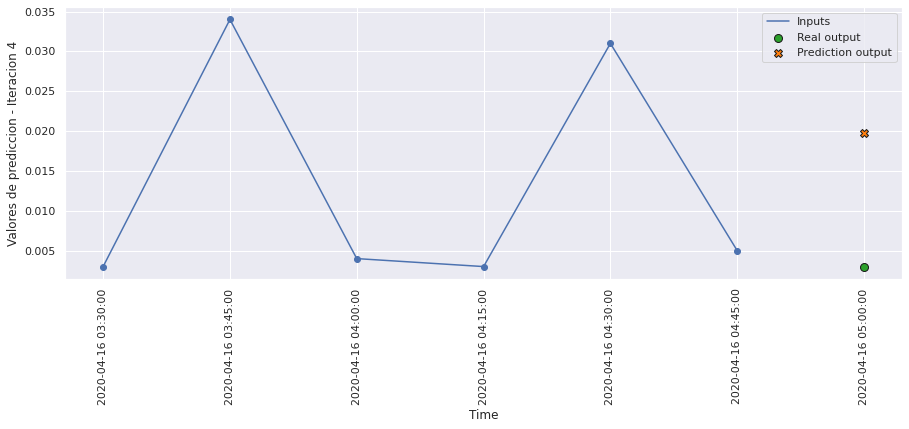

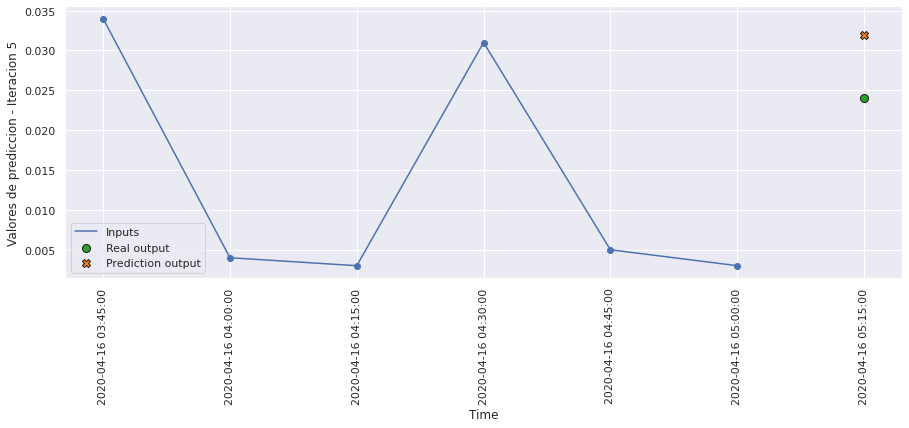

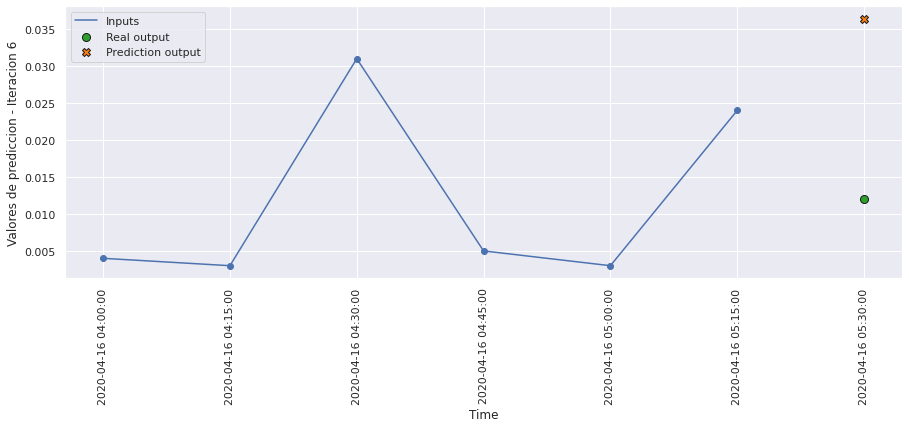

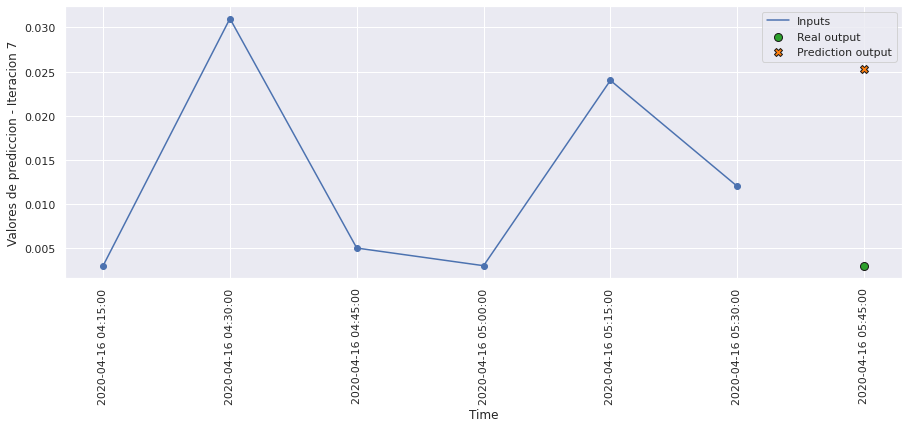

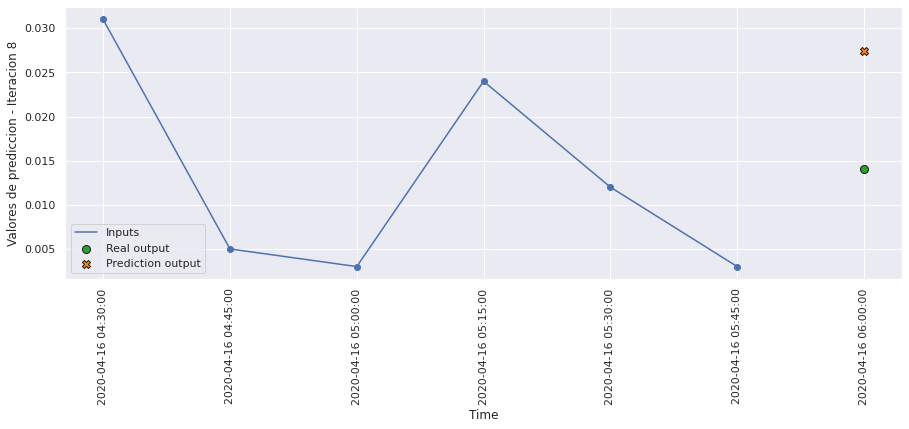

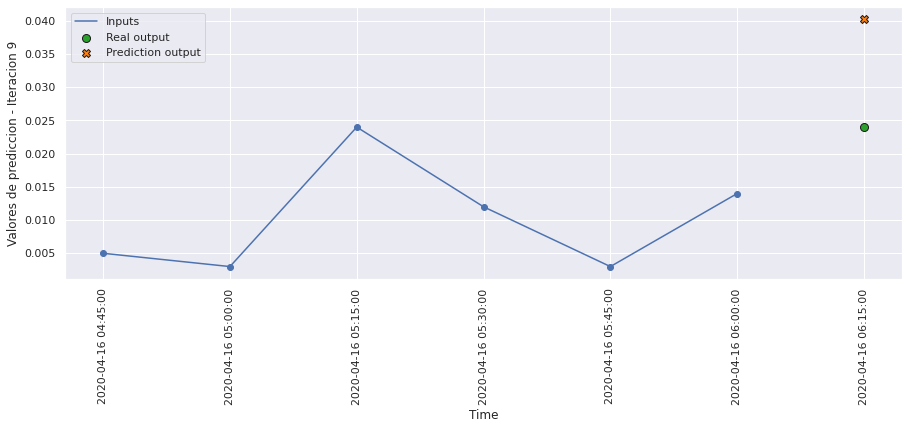

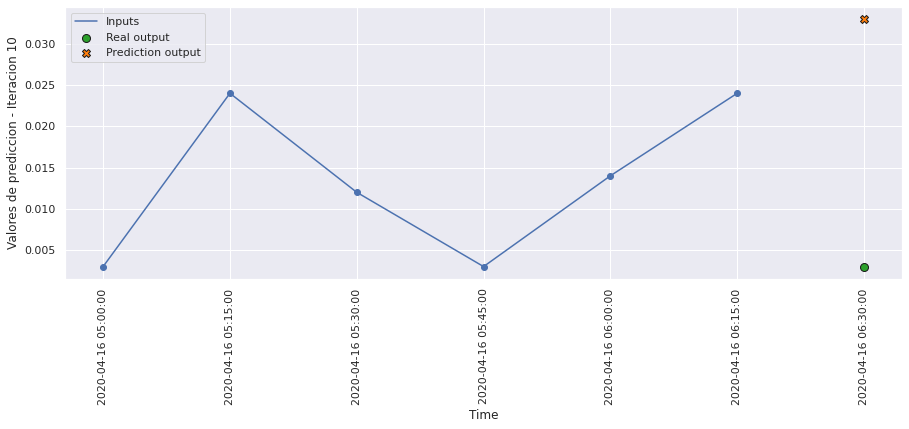

In [199]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict13, 10, 0)

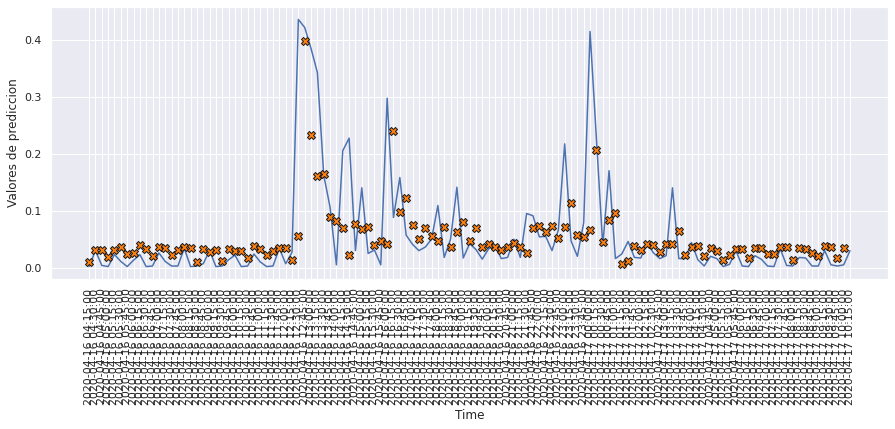

In [200]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict13, 120)

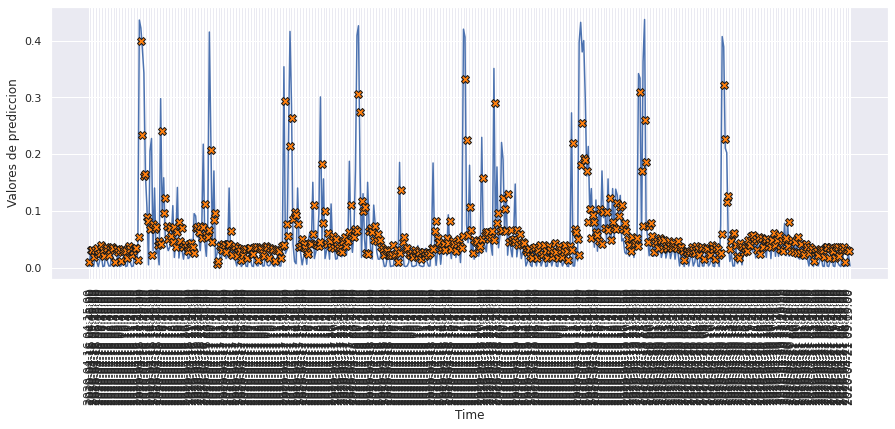

In [201]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict13, 500)

# Comparación de modelos

In [202]:
idx = ['LSTM 1 Layer', 'LSTM 2 Layer', 'LSTM 3 Layer', 'Bidirectional LSTM', 
         'Conv 1D', 'Conv 1D con LSTM', 'ConvLSTM1D', 'ConvLSTM2D', 'LSTM Encode Decode', 
         'GRU 1 Layer', 'GRU 2 Layer', 'LSTM unrestricted 1 layer', 'LSTM unrestricted 2 layer']

col = ['TR_MAE', 'TR_MSE', 'TR_SMAPE', 'TR_RMSE',
       'V_MAE', 'V_MSE', 'V_SMAPE', 'V_RMSE',
       'TS_MAE', 'TS_MSE', 'TS_SMAPE', 'TS_RMSE']

datos = [[score_train1[1], score_train1[2], score_train1[3], math.sqrt(score_train1[2]),
            score_val1[1],   score_val1[2],   score_val1[3],   math.sqrt(score_val1[2]),
           score_test1[1],  score_test1[2],  score_test1[3],  math.sqrt(score_test1[2])],
         [score_train2[1], score_train2[2], score_train2[3], math.sqrt(score_train2[2]),
            score_val2[1],   score_val2[2],   score_val2[3],   math.sqrt(score_val2[2]),
           score_test2[1],  score_test2[2],  score_test2[3],  math.sqrt(score_test2[2])],
         [score_train3[1], score_train3[2], score_train3[3], math.sqrt(score_train3[2]),
            score_val3[1],   score_val3[2],   score_val3[3],   math.sqrt(score_val3[2]),
           score_test3[1],  score_test3[2],  score_test3[3],  math.sqrt(score_test3[2])],
         [score_train4[1], score_train4[2], score_train4[3], math.sqrt(score_train4[2]),
            score_val4[1],   score_val4[2],   score_val4[3],   math.sqrt(score_val4[2]),
           score_test4[1],  score_test4[2],  score_test4[3],  math.sqrt(score_test4[2])],
         [score_train5[1], score_train5[2], score_train5[3], math.sqrt(score_train5[2]),
            score_val5[1],   score_val5[2],   score_val5[3],   math.sqrt(score_val5[2]),
           score_test5[1],  score_test5[2],  score_test5[3],  math.sqrt(score_test5[2])],
         [score_train6[1], score_train6[2], score_train6[3], math.sqrt(score_train6[2]),
            score_val6[1],   score_val6[2],   score_val6[3],   math.sqrt(score_val6[2]),
           score_test6[1],  score_test6[2],  score_test6[3],  math.sqrt(score_test6[2])],
         [score_train7[1], score_train7[2], score_train7[3], math.sqrt(score_train7[2]),
            score_val7[1],   score_val7[2],   score_val7[3],   math.sqrt(score_val7[2]),
           score_test7[1],  score_test7[2],  score_test7[3],  math.sqrt(score_test7[2])],
         [score_train8[1], score_train8[2], score_train8[3], math.sqrt(score_train8[2]),
            score_val8[1],   score_val8[2],   score_val8[3],   math.sqrt(score_val8[2]),
           score_test8[1],  score_test8[2],  score_test8[3],  math.sqrt(score_test8[2])],
         [score_train9[1], score_train9[2], score_train9[3], math.sqrt(score_train9[2]),
            score_val9[1],   score_val9[2],   score_val9[3],   math.sqrt(score_val9[2]),
           score_test9[1],  score_test9[2],  score_test9[3],  math.sqrt(score_test9[2])],
         [score_train10[1], score_train10[2], score_train10[3], math.sqrt(score_train10[2]),
            score_val10[1],   score_val10[2],   score_val10[3],   math.sqrt(score_val10[2]),
           score_test10[1],  score_test10[2],  score_test10[3],  math.sqrt(score_test10[2])],
         [score_train11[1], score_train11[2], score_train11[3], math.sqrt(score_train11[2]),
            score_val11[1],   score_val11[2],   score_val11[3],   math.sqrt(score_val11[2]),
           score_test11[1],  score_test11[2],  score_test11[3],  math.sqrt(score_test11[2])],
         [score_train12[1], score_train12[2], score_train12[3], math.sqrt(score_train12[2]),
            score_val12[1],   score_val12[2],   score_val12[3],   math.sqrt(score_val12[2]),
           score_test12[1],  score_test12[2],  score_test12[3],  math.sqrt(score_test12[2])],
         [score_train13[1], score_train13[2], score_train13[3], math.sqrt(score_train13[2]),
            score_val13[1],   score_val13[2],   score_val13[3],   math.sqrt(score_val13[2]),
           score_test13[1],  score_test13[2],  score_test13[3],  math.sqrt(score_test13[2])]]

comparativa = pd.DataFrame(datos, columns = col, index = idx)
comparativa.style.set_caption("Tabla de comparación de todos los modelos - Método de ventana sólo valor 6 - 1")

,TR_MAE,TR_MSE,TR_SMAPE,TR_RMSE,V_MAE,V_MSE,V_SMAPE,V_RMSE,TS_MAE,TS_MSE,TS_SMAPE,TS_RMSE
LSTM 1 Layer,0.038253,0.004301,0.713337,0.065579,0.033723,0.003896,0.675466,0.062417,0.040178,0.004689,0.721866,0.068477
LSTM 2 Layer,0.036406,0.004142,0.697554,0.064361,0.033420,0.003933,0.681679,0.062711,0.039030,0.004666,0.717159,0.068311
LSTM 3 Layer,0.028682,0.002448,0.646914,0.049473,0.036258,0.004914,0.701833,0.070100,0.041217,0.005798,0.720810,0.076148
Bidirectional LSTM,0.037412,0.004355,0.705066,0.065991,0.033448,0.003934,0.679252,0.062719,0.039086,0.004613,0.715317,0.067922
Conv 1D,0.038924,0.005217,0.716826,0.072226,0.033091,0.004905,0.641433,0.070034,0.038033,0.005286,0.678598,0.072707
Conv 1D con LSTM,0.038995,0.004777,0.709953,0.069117,0.032254,0.004234,0.635076,0.065070,0.038046,0.004801,0.678709,0.069290
ConvLSTM1D,0.038575,0.004589,0.720980,0.067745,0.033928,0.004039,0.682556,0.063550,0.039138,0.004651,0.711770,0.068201
ConvLSTM2D,0.036930,0.004601,0.698821,0.067833,0.030734,0.004083,0.619553,0.063901,0.036049,0.004678,0.653086,0.068395
LSTM Encode Decode,0.034989,0.004150,0.654656,0.064422,0.029663,0.003888,0.589979,0.062350,0.035990,0.004665,0.636794,0.068298
GRU 1 Layer,0.035695,0.004253,0.673588,0.065216,0.030546,0.003978,0.611468,0.063071,0.036477,0.004715,0.649853,0.068666


<AxesSubplot:title={'center':'Comparativa del error en los modelos del método de ventana de un paso con sólo el valor'}>

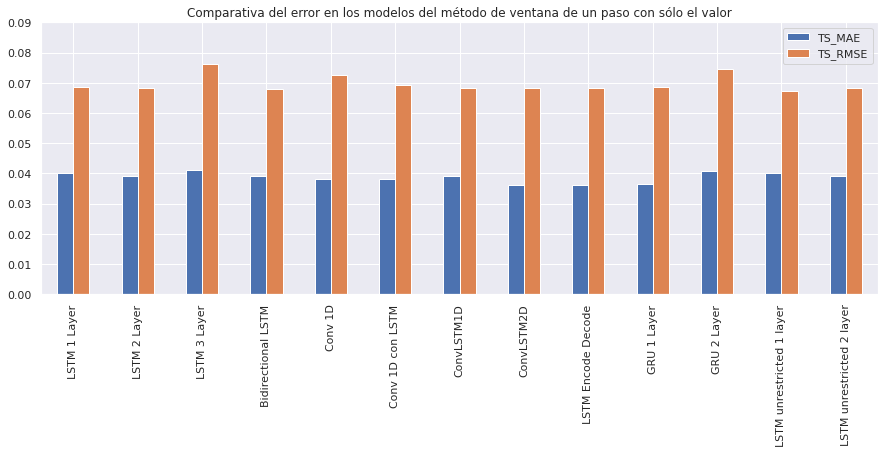

In [206]:
comparativa.loc[:, ['TS_MAE', 'TS_RMSE']].plot(kind='bar', title = 'Comparativa del error en los modelos del método de ventana de un paso con sólo el valor', ylim=(0, 0.09))

<AxesSubplot:title={'center':'Comparativa del error porcentual absoluto medio simétrico del método de ventana de un paso con sólo el valor'}>

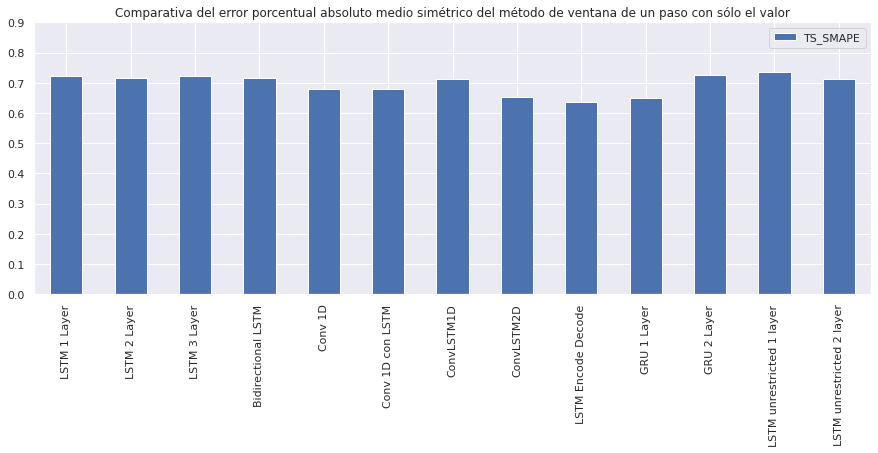

In [204]:
comparativa.loc[:, 'TS_SMAPE'].plot(kind='bar', legend=(['SMAPE']), ylim=(0, 0.9), 
                    title = 'Comparativa del error porcentual absoluto medio simétrico del método de ventana de un paso con sólo el valor')